In [1]:

import os,sys,glob
# Move two levels up work from project level, not location of analysis file
os.chdir('../..')
print(os.getcwd())
import numpy as np
import matplotlib.pyplot as plt
import json
import pandas as pd
import Functions.globalFunctions.ExtracellularField as EcF
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap
from typing import Literal
from scipy import integrate
import ipympl
import time
import seaborn as sns
from scipy import stats
from scipy import optimize
#import warnings
from Analyses.SDC_singlePulse_singleOpticField.tools import *
from Analyses.SDC_singlePulse_singleOpticField import loader

import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.anova import anova_lm
#warnings.filterwarnings('error',category=UserWarning)

%matplotlib inline
recollect = False

font = {'family': 'helvetica',
        'size': 10}
mpl.rc('font', **font)
linestyle_str = ['solid', 'dotted', 'dashed', 'dashdot']
cmap_tab20 = np.array(mpl.cm.get_cmap('tab20').colors)
def myfun(x, y): return list(mpl.colors.to_rgb(x))+[y]
colorkeyval = {'soma': myfun('tab:red', 1), 'axon': myfun('tomato', 1), 'apic': myfun('seagreen', 1),
                'basaldend': myfun('teal', 1), 'alldend': myfun('tab:cyan',1), 'allsec': myfun('tab:blue', 1),
                'pyr_1': list(cmap_tab20[2,:])+[1],'pyr_2': list(cmap_tab20[3,:])+[1],
                'bc_1': list(cmap_tab20[8,:])+[1],'bc_2': list(cmap_tab20[9,:])+[1], 'unclassified': [0, 0, 0]}

d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code


In [2]:
def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw=None, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if ax is None:
        ax = plt.gca()

    if cbar_kw is None:
        cbar_kw = {}

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)

    # Create colorbar
    if not cbar_kw is False:
        cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
        cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # Show all ticks and label them with the respective list entries.
    ax.set_xticks(np.arange(data.shape[1]), labels=col_labels)
    ax.set_yticks(np.arange(data.shape[0]), labels=row_labels)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")

    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=1)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar

def heatmap2(data, row_labels, col_labels, ax=None,
            cbar_kw=None, cbarlabel="",row_colors = None, column_colors = None, labelfs = 10, lw_grid=1, **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if ax is None:
        ax = plt.gca()

    if cbar_kw is None:
        cbar_kw = {}

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)
    if row_colors is not None:
        ax_row_cols = ax.inset_axes([-0.01, 0, 0.01, 1])
        ax_row_cols.spines[:].set_visible(False)
    if column_colors is not None:
        ax_column_cols = ax.inset_axes([0,1, 1, 0.01,])
        ax_column_cols.spines[:].set_visible(False)



    # Create colorbar
    if not cbar_kw is False:
        cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
        cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom", fontsize=labelfs)

    # Show all ticks and label them with the respective list entries.
    if column_colors is None:
        ax.set_xticks(np.arange(data.shape[1]), labels=col_labels,fontsize=labelfs)
        # Let the horizontal axes labeling appear on top.
        ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)
        # Rotate the tick labels and set their alignment.
        plt.setp(ax.get_xticklabels(), rotation=-45, ha="right",
             rotation_mode="anchor")

    else:
        ax_column_cols.imshow(column_colors,aspect='auto')
        ax_column_cols.set_xticks(np.arange(data.shape[0]), labels=col_labels,fontsize=labelfs)
        ax_column_cols.set_xticks(np.arange(data.shape[0]+1)-.5, minor=True)
        ax_column_cols.set_yticks([])
        ax_column_cols.tick_params(which="minor", bottom=False, left=False)
        ax.set_xticks([])
        # Let the horizontal axes labeling appear on top.
        ax_column_cols.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)
        # Rotate the tick labels and set their alignment.
        plt.setp(ax_column_cols.get_xticklabels(), rotation=-45, ha="right",
             rotation_mode="anchor")

    if row_colors is None:
        ax.set_yticks(np.arange(data.shape[0]), labels=row_labels,fontsize=labelfs)
        ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    else:
        ax_row_cols.imshow(row_colors,aspect='auto')
        ax_row_cols.set_yticks(np.arange(data.shape[0]), labels=row_labels,fontsize=labelfs)
        ax_row_cols.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
        ax_row_cols.set_xticks([])
        ax_row_cols.tick_params(which="minor", bottom=False, left=False)

        ax.set_yticks([])
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)

    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)

    ax.grid(which="minor", color="w", linestyle='-', linewidth=lw_grid)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar
def sort_xy_based_x(x,y):
    x = np.array(x)
    y = np.array(y)
    sort_idx = np.argsort(x)
    x = x[sort_idx]
    y = y[sort_idx]
    return x,y

def modify_plot(*args, **kwargs):
    if "ax" in kwargs:
      ax = kwargs['ax']
    else:
      ax = plt.gca()
    xpoints = ypoints = ax.get_xlim()
    ax.plot(xpoints, ypoints, linestyle='--', color='k', lw=1, scalex=False, scaley=False)

def broken_boxplot(df,break_points, yaxratio=1, fig = None,**boxplot_kwargs):
    if fig is None:
        fig = plt.figure()
    if yaxratio==1:
        ax1, ax2 = fig.subplots(2, 1, sharex=True)
    else:
        gs = fig.add_gridspec(2, 1, height_ratios=(1, yaxratio))
        ax1 = fig.add_subplot(gs[0])
        ax2 = fig.add_subplot(gs[1], sharex=ax1)
    fig.subplots_adjust(hspace=0.05)  # adjust space between axes

    # plot the same data on both axes
    sns.boxplot(df,ax=ax1,**boxplot_kwargs)
    sns.boxplot(df,ax=ax2,**boxplot_kwargs)
    ylims = ax1.get_ylim()
    # zoom-in / limit the view to different portions of the data
    ax1.set_ylim(break_points[1], ylims[1])  # outliers only
    ax2.set_ylim(ylims[0], break_points[0]) # most of the data

    # hide the spines between ax and ax2
    ax1.spines.bottom.set_visible(False)
    ax2.spines.top.set_visible(False)
    ax1.tick_params(labeltop=False)  # don't put tick labels at the top
    ax2.xaxis.tick_bottom()

    # Now, let's turn towards the cut-out slanted lines.
    # We create line objects in axes coordinates, in which (0,0), (0,1),
    # (1,0), and (1,1) are the four corners of the axes.
    # The slanted lines themselves are markers at those locations, such that the
    # lines keep their angle and position, independent of the axes size or scale
    # Finally, we need to disable clipping.

    d = .5  # proportion of vertical to horizontal extent of the slanted line
    kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
                linestyle="none", color='k', mec='k', mew=1, clip_on=False)
    ax1.plot([0], [0], transform=ax1.transAxes, **kwargs)
    ax2.plot([0], [1], transform=ax2.transAxes, **kwargs)
    return fig, ax1, ax2
def find_outliers_IQR(df):
   q1=df.quantile(0.25)
   q3=df.quantile(0.75)
   IQR=q3-q1
   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))].copy()
   return outliers, IQR

# loading raw data
stored in master_df

unique_values_columns_master contains all unique values for each column

In [3]:

# Load data
filepath = './Results\SDC\SDC_singlePulse_Ugent470_gray_invivo_multicell'
filename = 'all_data_filled.csv'
drop_columns = ['opsinmech','distribution','distribution_method','phi_0', 'psi_0','seed','celsius','dt','field','settings_str']

# list parameters of interest
cell_init_options = ['phi_0', 'theta_0', 'psi_0',
                        'neurontemplate', 'x_0', 'y_0', 'z_0']
settings_options = ['seed', 'celsius', 'dt']
opsin_options = ['Gmax', 'distribution', 'opsinmech',
                    'distribution_method', 'opsinlocations']
field_options = ['field', 'nPulse']
positional_input = ['x', 'y', 'z', 'phi', 'theta', 'psi']
result = ['amp', 'sR', 'ichr2', 'gchr2', 'dur']
all_columns = result+field_options+opsin_options + positional_input + \
    cell_init_options+settings_options


# opsinlocations to single word
opsinLocation_map = loader.opsinLocation_map
master_df = loader.load_data_df(filepath = filepath, filename = filename, recollect = recollect, result = result, all_columns = all_columns, cell_init_options  = cell_init_options, settings_options  = settings_options, opsin_options = opsin_options, field_options = field_options, positional_input=positional_input, fill_missing_xyzpositions = True, save_recollect = True, savename = None)
master_df['amp'] = master_df['amp']/1000 # convert W/m2 -> mW/mm2
for x in ['x','y','z']:
    for suffix in ['','_0']:
        master_df[x+suffix] = master_df[x+suffix]/1000 #convert um -> mm
master_df['TAC']=-master_df['ichr2']/master_df['dur']*1e-5 # convert to uA (ichr2: mA/cm2*um2)
master_df['Gmax'] = np.round(master_df['Gmax'],4)
master_df['theta_0'] = np.round(master_df['theta_0'],2)
for x in ['amp','Gmax','TAC','dur']:
    master_df[x+'_log10'] = np.round(np.log10(master_df[x]),4)

master_df = master_df.drop(drop_columns,axis=1)
master_df['neurontemplate'] = master_df['neurontemplate'].replace({'CA1_PC_cAC_sig5':'pyr_1', 'CA1_PC_cAC_sig6':'pyr_2', 'cNACnoljp1':'bc_1', 'cNACnoljp2':'bc_2'})
all_columns=master_df.columns
all_settings_columns = [x for x in all_columns if (not x in drop_columns) and (not any([y in x for y in result[:-1]+['TAC']]))]

# change perspective from optrode centered to stratum pyramidale centred
for theta in master_df['theta_0'].unique():
    if theta<0:
        label = 'z'
        master_df.loc[master_df['theta_0']==theta,label]*=-1
        master_df.loc[master_df['theta_0']==theta,label+'_0']*=-1
    elif theta==0:
        label = 'x'
        master_df.loc[master_df['theta_0']==theta,label]*=-1
        master_df.loc[master_df['theta_0']==theta,label+'_0']*=-1
        toz = master_df.loc[master_df['theta_0']==theta,'x'].to_numpy()
        tox = master_df.loc[master_df['theta_0']==theta,'z'].to_numpy()
        toz_0 = master_df.loc[master_df['theta_0']==theta,'x_0'].to_numpy()
        tox_0 = master_df.loc[master_df['theta_0']==theta,'z_0'].to_numpy()
        master_df.loc[master_df['theta_0']==theta,'x'] = tox
        master_df.loc[master_df['theta_0']==theta,'z'] = toz
        master_df.loc[master_df['theta_0']==theta,'x_0'] = tox_0
        master_df.loc[master_df['theta_0']==theta,'z_0'] = toz_0

    master_df.loc[master_df['theta_0']==theta,'z']=np.round(master_df.loc[master_df['theta_0']==theta,'z']+master_df.loc[master_df['theta_0']==theta,'z_0'],3)
    master_df.loc[master_df['theta_0']==theta,'x']=np.round(master_df.loc[master_df['theta_0']==theta,'x']+master_df.loc[master_df['theta_0']==theta,'x_0'],3)

unique_values_columns_master = {key: master_df[key].unique() for key in all_columns}
for x in ['amp','Gmax','TAC','dur']:
    unique_values_columns_master[x] = np.sort(unique_values_columns_master[x])
    unique_values_columns_master[x+'_log10'] = np.sort(unique_values_columns_master[x+'_log10'])
for x in ['x', 'z', 'x_0', 'z_0']:
    unique_values_columns_master[x] = np.sort(unique_values_columns_master[x])
print('all coluumn names:\n\t',all_columns.to_numpy())
print('all settings:\n\t',all_settings_columns)
print('Total number of entries:\n\t',len(master_df))
for k in all_settings_columns:
    print(f'unique entries {k}:\n\t', len(unique_values_columns_master[k]),': ', unique_values_columns_master[k])
master_df.describe()


all coluumn names:
	 ['amp' 'sR' 'ichr2' 'gchr2' 'dur' 'nPulse' 'Gmax' 'opsinlocations' 'x' 'y'
 'z' 'phi' 'theta' 'psi' 'theta_0' 'neurontemplate' 'x_0' 'y_0' 'z_0'
 'TAC' 'amp_log10' 'Gmax_log10' 'TAC_log10' 'dur_log10']
all settings:
	 ['dur', 'nPulse', 'Gmax', 'opsinlocations', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'theta_0', 'neurontemplate', 'x_0', 'y_0', 'z_0', 'Gmax_log10', 'dur_log10']
Total number of entries:
	 203280
unique entries dur:
	 5 :  [  1.           3.16227766  10.          31.6227766  100.        ]
unique entries nPulse:
	 1 :  [1]
unique entries Gmax:
	 8 :  [ 0.1     0.2276  0.5179  1.1788  2.6827  6.1054 13.895  31.6228]
unique entries opsinlocations:
	 4 :  ['allsec' 'axon' 'basaldend' 'soma']
unique entries x:
	 16 :  [-1.   -0.5   0.    0.25  0.5   0.75  1.    1.25  1.5   1.75  2.    2.25
  2.5   3.    3.5   4.  ]
unique entries y:
	 1 :  [0.]
unique entries z:
	 11 :  [-0.4  -0.29 -0.18 -0.07  0.04  0.15  0.26  0.37  0.48  0.59  0.7 ]
unique entries phi:
	 

,amp,sR,ichr2,gchr2,dur,nPulse,Gmax,x,y,z,...,psi,theta_0,x_0,y_0,z_0,TAC,amp_log10,Gmax_log10,TAC_log10,dur_log10
count,146546.000000,146546.0,203280.000000,203280.000000,203280.000000,203280.0,203280.000000,203280.000000,203280.0,203280.000000,...,203280.0,2.032800e+05,203280.000000,203280.0,203280.000000,2.032800e+05,146546.000000,203280.000000,203280.000000,203280.000000
mean,589.677601,1.0,-3146.909071,2.327224,29.157011,1.0,7.041275,1.333333,0.0,0.150000,...,0.0,1.085755e-18,-0.333333,0.0,0.333333,5.848390e-03,1.528230,0.250000,-3.363021,1.000000
std,1466.457581,0.0,10395.225481,202.383389,37.041537,0.0,10.262995,1.124231,0.0,0.347851,...,0.0,1.281903e+00,0.471406,0.0,0.518546,3.680057e-02,1.316288,0.818325,1.266908,0.707109
min,0.000221,1.0,-248205.592900,-5051.152100,1.000000,1.0,0.100000,-1.000000,0.0,-0.400000,...,0.0,-1.570000e+00,-1.000000,0.0,-0.400000,1.110500e-07,-3.655800,-1.000000,-6.954500,0.000000
25%,4.526110,1.0,-2303.734575,0.015580,3.162278,1.0,0.445325,0.500000,0.0,-0.180000,...,0.0,-1.570000e+00,-1.000000,0.0,-0.400000,1.579185e-04,0.655725,-0.375050,-3.801600,0.500000
50%,39.531250,1.0,-1076.053800,0.148600,10.000000,1.0,1.930750,1.250000,0.0,0.150000,...,0.0,0.000000e+00,0.000000,0.0,0.700000,6.815203e-04,1.596900,0.250000,-3.166500,1.000000
75%,326.590185,1.0,-247.697100,0.936725,31.622777,1.0,8.052800,2.000000,0.0,0.480000,...,0.0,1.570000e+00,0.000000,0.0,0.700000,3.449181e-03,2.514000,0.875000,-2.462300,1.500000
max,11455.688477,1.0,-0.018090,60820.664600,100.000000,1.0,31.622800,4.000000,0.0,0.700000,...,0.0,1.570000e+00,0.000000,0.0,0.700000,1.241128e+00,4.059000,1.500000,0.093800,2.000000


In [4]:

#test selector
myselection = {key:unique_values_columns_master[key][0] for key in all_settings_columns if not '_log10' in key}
myselection['dur'] = 100
myselection['x_0'] = 0
myselection['x'] = 0
myselection['z_0'] = 0.7
myselection['Gmax'] = unique_values_columns_master['Gmax'][4]
print(myselection)
intm_df = master_df[selection_generator(master_df,unique_values_columns_master,verbose=False,**myselection)].reset_index(drop=True)
intm_df.head(len(intm_df))


{'dur': 100, 'nPulse': 1, 'Gmax': 2.6827, 'opsinlocations': 'allsec', 'x': 0, 'y': 0.0, 'z': -0.4, 'phi': 0, 'theta': -1.5707963267948966, 'psi': 0, 'theta_0': -1.57, 'neurontemplate': 'pyr_1', 'x_0': 0, 'y_0': 0.0, 'z_0': 0.7}


,amp,sR,ichr2,gchr2,dur,nPulse,Gmax,opsinlocations,x,y,...,theta_0,neurontemplate,x_0,y_0,z_0,TAC,amp_log10,Gmax_log10,TAC_log10,dur_log10
0,0.091692,1.0,-3153.1661,1.0669,100.0,1,2.6827,allsec,0.0,0.0,...,-1.57,pyr_1,0.0,0.0,0.7,0.000315,-1.0377,0.4286,-3.5013,2.0


## Surface plots of 3 pitches for single neurontemplate


{'neurontemplate': 'pyr_1', 'opsinlocations': 'allsec'}
{'neurontemplate': 'pyr_1', 'opsinlocations': 'allsec', 'Gmax': 0.5179, 'theta_0': -1.57}

{'neurontemplate': 'pyr_1', 'opsinlocations': 'allsec', 'Gmax': 1.1788, 'theta_0': -1.57}

{'neurontemplate': 'pyr_1', 'opsinlocations': 'allsec', 'Gmax': 0.5179, 'theta_0': 0.0}

{'neurontemplate': 'pyr_1', 'opsinlocations': 'allsec', 'Gmax': 1.1788, 'theta_0': 0.0}

{'neurontemplate': 'pyr_1', 'opsinlocations': 'allsec', 'Gmax': 0.5179, 'theta_0': 1.57}

{'neurontemplate': 'pyr_1', 'opsinlocations': 'allsec', 'Gmax': 1.1788, 'theta_0': 1.57}



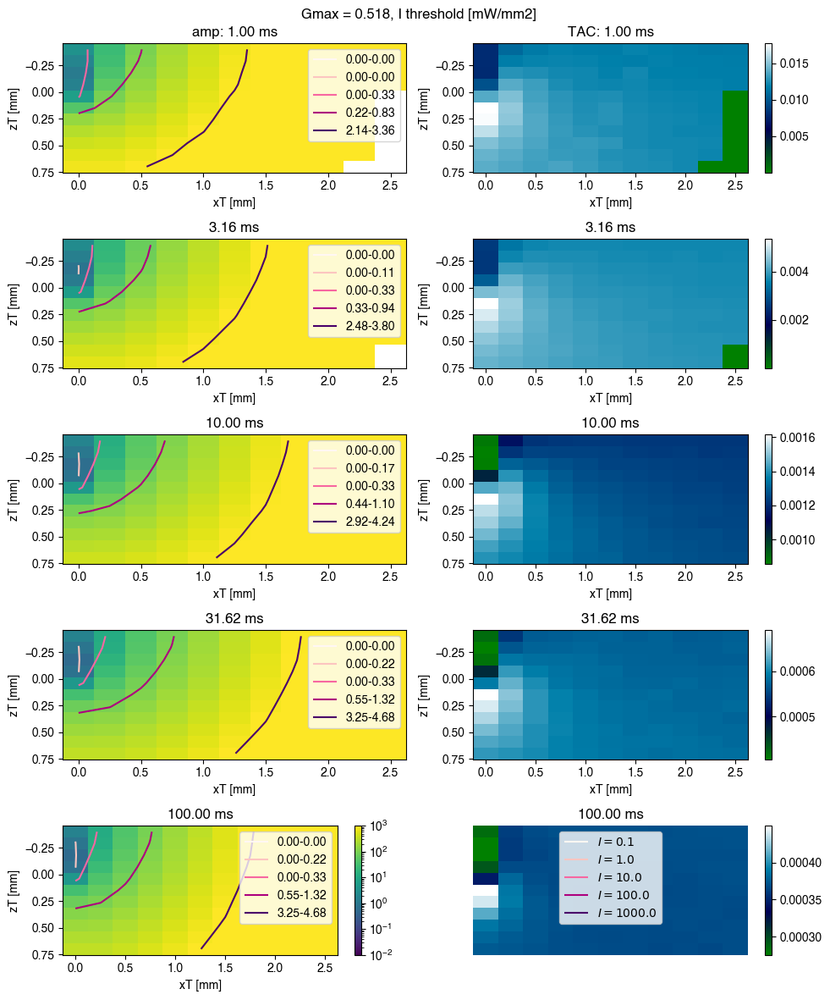

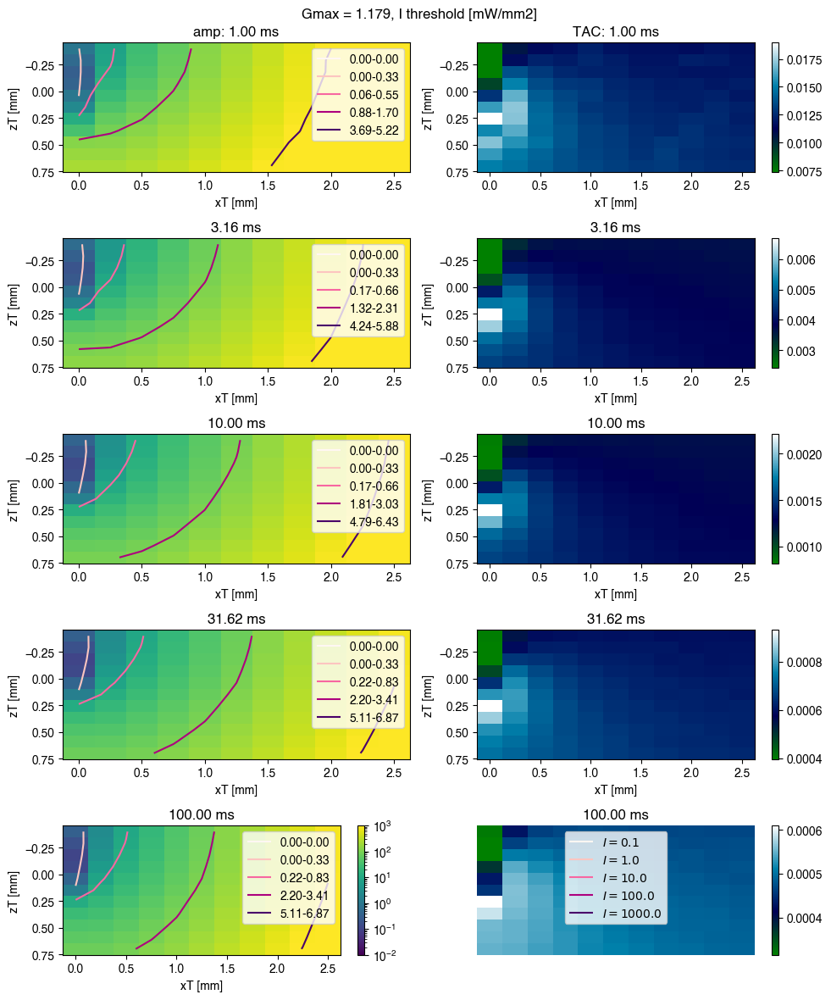

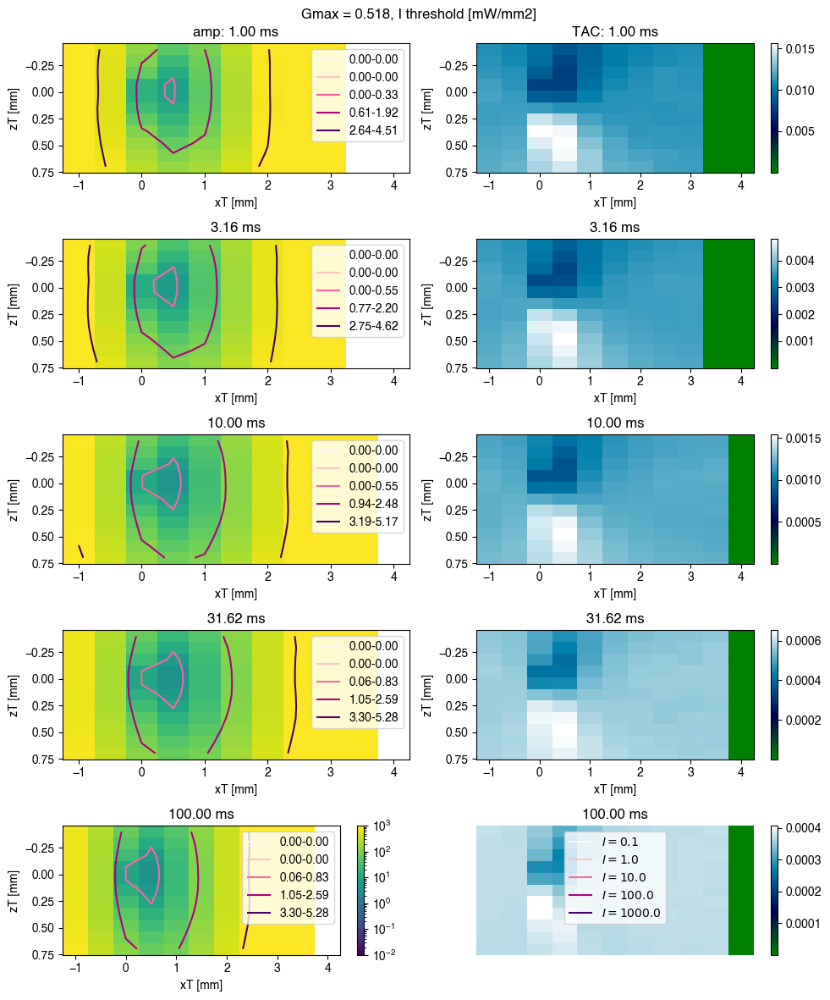

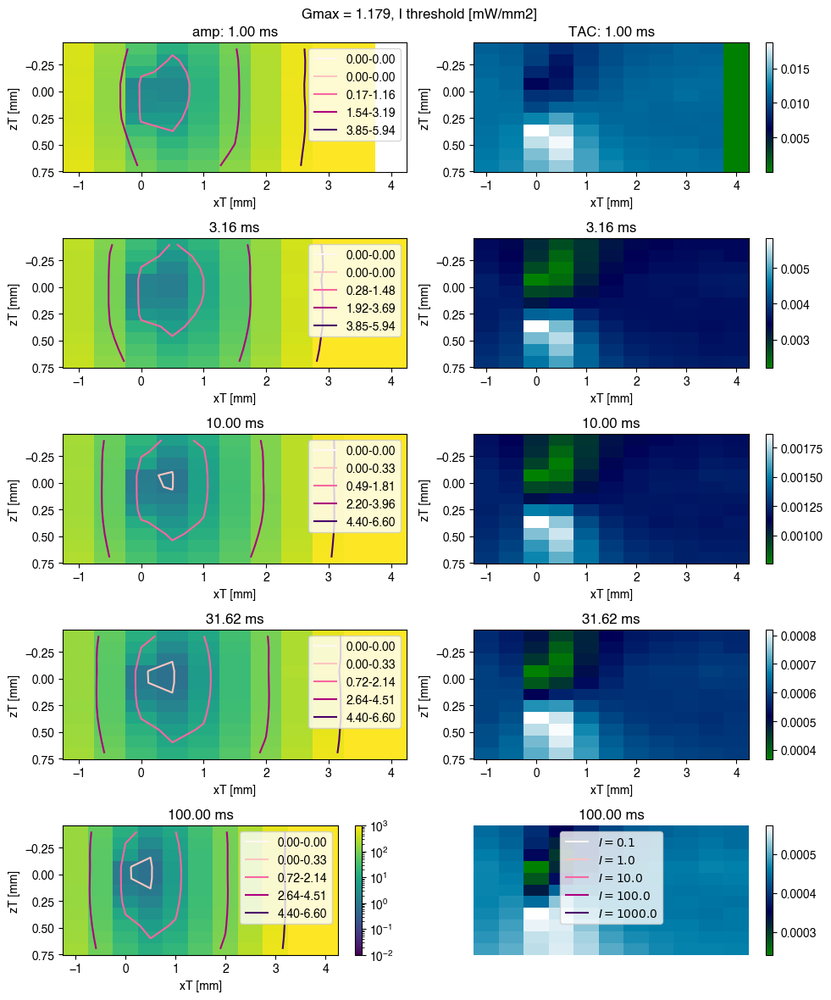

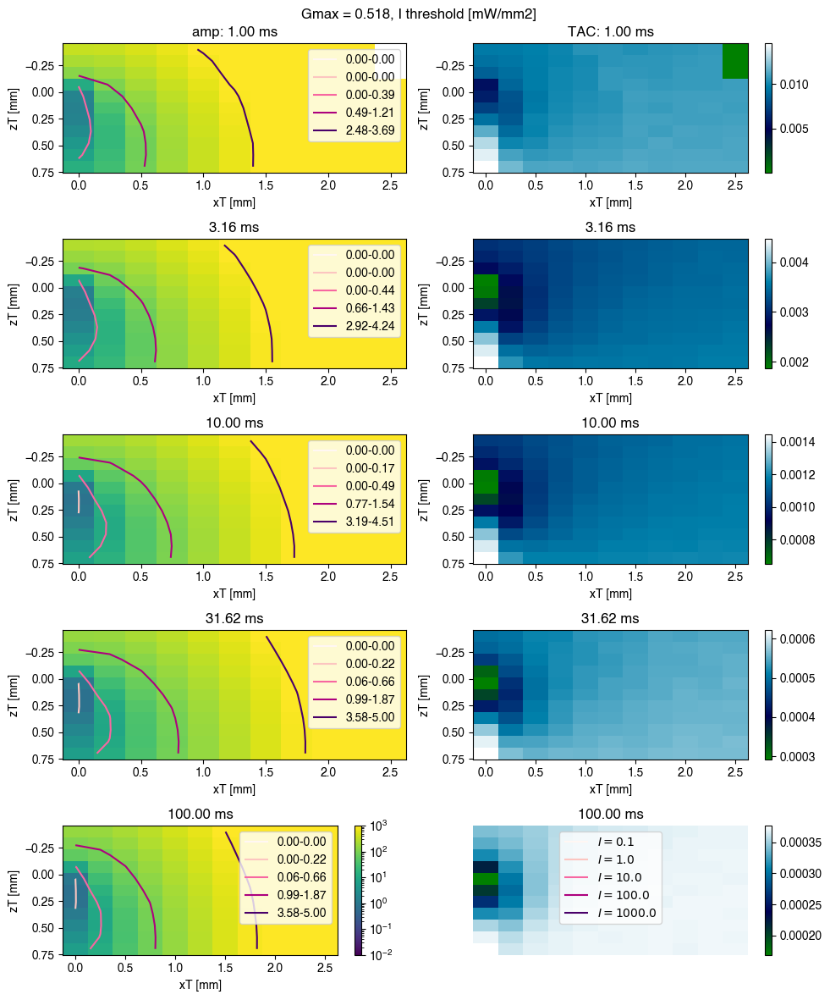

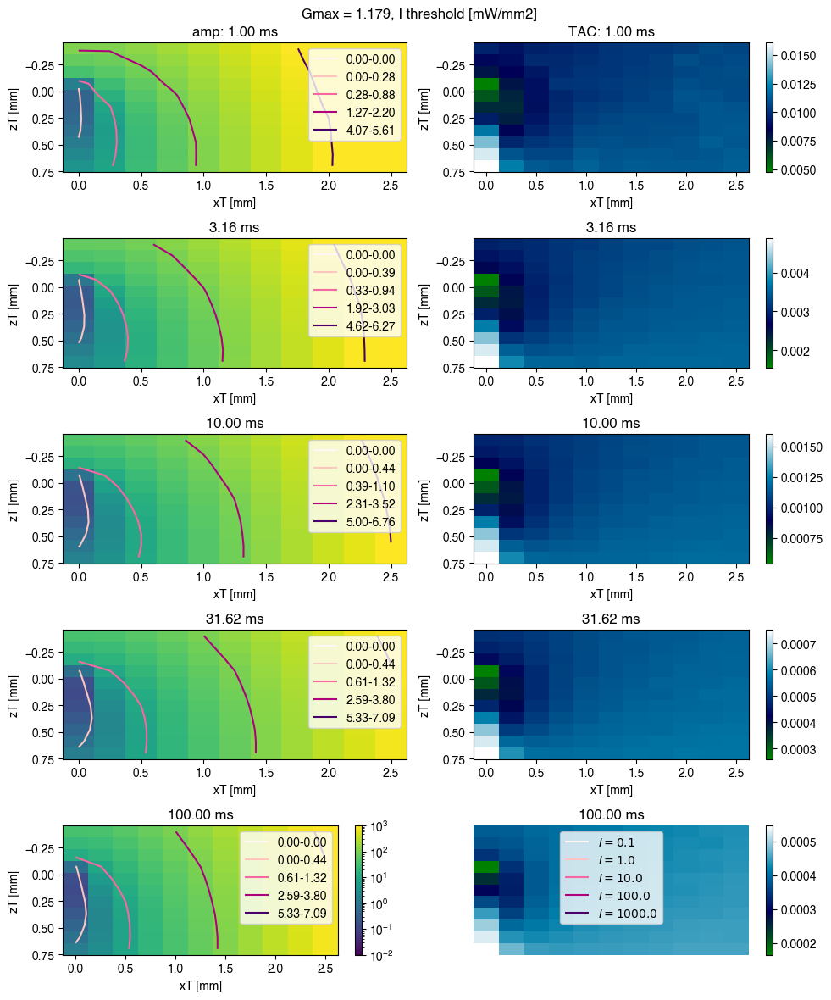

In [5]:
myselection_noGmax = {'neurontemplate':'pyr_1', 'opsinlocations': 'allsec'}

print(myselection_noGmax)
intm_df = master_df[selection_generator(master_df,unique_values_columns_master,verbose=False,**myselection_noGmax)]
gmaxs = list(intm_df['Gmax'].unique())
print_upscale = False
nan_tolerance_percentage = 0.95


for theta in unique_values_columns_master['theta_0']:
    for gmax in gmaxs[2:4]:
        myselection = {**myselection_noGmax, 'Gmax': gmax,'theta_0':theta}
        single_config_df = master_df[selection_generator(master_df,unique_values_columns_master,verbose=False,**myselection)].reset_index(drop=True)
        print(myselection)

        udurs = list(single_config_df['dur'].unique())
        fig,axs = plt.subplots(len(udurs),2,tight_layout = True,figsize=np.array([10,12]))
        for i, feat in enumerate(['amp','TAC']):
            if feat=='amp':
                levels = np.logspace(-1,3,5)
                norm_log = mpl.cm.colors.LogNorm(vmax=1000, vmin=0.01)
                norm_log_cntr = mpl.cm.colors.LogNorm(vmax=levels[-1], vmin=levels[0])
                plot_cntr = True
            else:
                plot_cntr = False
            for dur,ax in zip(udurs,axs[:,i]):
                intm_df = single_config_df[single_config_df['dur']==dur]
                if not np.all(np.isnan(intm_df[feat])):
                    data_toplot = np.array((intm_df['x'],intm_df['z'],intm_df[feat])).T
                    # if ninterp, data_toplot[-1] is in 'ij' order
                    data_toplot = EcF.prepareDataforInterp(data_toplot,'ninterp',sorted=False)
                    yY, zZ = np.meshgrid(np.linspace(data_toplot[0].min(),data_toplot[0].max(),len(np.unique(data_toplot[0])),endpoint=True),np.linspace(data_toplot[1].min(),data_toplot[1].max(),len(np.unique(data_toplot[0])),endpoint=True),indexing='ij')

                    if sum(np.isnan(data_toplot[-1].flatten()))/len(data_toplot[-1].flatten()) < nan_tolerance_percentage:
                        if plot_cntr:
                            im,cntr,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm_log,invert_yaxis=True,contour_kwargs={'norm':norm_log_cntr,'cmap':'RdPu','levels':levels})
                            h, l = cntr.legend_elements("I")
                            if theta!=0:
                                surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(yY,zZ,data_toplot[2],intensity = levels,radial_data=True,gridorder = 'ij')
                            else:
                                surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(yY,zZ,data_toplot[2],intensity = levels,radial_data=False,gridorder = 'ij')
                            ax.legend(h, [f'{x:0.2f}-{y:0.2f}' if ~np.isnan(x) else '-' for x,y in zip(surf_low,surf_up)],ncol=1,loc='upper right')
                        else:
                            TAC_min = np.nanmin(intm_df[feat])
                            TAC_max = np.nanmax(intm_df[feat])
                            norm_log = mpl.cm.colors.Normalize(vmax=TAC_max, vmin=TAC_min)
                            im,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm_log,invert_yaxis=True,cmap='ocean')
                        ax.set_xlabel('xT [mm]')
                        ax.set_ylabel('zT [mm]')
                        ax.set_title(f'{dur:0.2f} ms')
                if dur==udurs[0]:
                    ax.set_title(f'{feat}: {dur:0.2f} ms')
                if dur!=udurs[-1] and feat=='amp':
                    cb.remove()


        fig.suptitle(f'Gmax = {gmax:0.3f}, I threshold [mW/mm2]')
        try:
            h, l = cntr.legend_elements("I")
            axs[-1,-1].legend(h, l,ncol=1,loc='upper center')
            axs[-1,-1].axis('off')
            #cb = fig.colorbar(im,ax=axs[-1,-2])
        except:
            pass
        print()

# VTA/STA

In [6]:
vta_filename = 'vta_logspace(-1,3,9)3_westim3.csv'
vta_df = loader.load_vta_df(filepath, vta_filename, recollect = False)
vta_df.head()
for x in ['Gmax','dur','level','theta_0']:
    vta_df[x] = np.round(vta_df[x],2)


for x in ['vta_low','vta_up','surf_low','surf_up','dur','Gmax','level','surf_estim','surf_estim_hr','surf_avg']:
    vta_df[x+'_log10'] = np.round(np.log10(vta_df[x]),4)
vta_df['neurontemplate'].unique()

try:
    vta_df['neurontemplate'] = vta_df['neurontemplate'].replace({'CA1_PC_cAC_sig5':'pyr_1', 'CA1_PC_cAC_sig6':'pyr_2', 'cNACnoljp1':'bc_1', 'cNACnoljp2':'bc_2'})
except Exception as e:
    print(e)
    pass
vta_df[['celltype','number']] = vta_df['neurontemplate'].str.split('_',expand=True)
vta_columns=vta_df.columns


vta_limit_df = vta_df.copy()
for x,maxsurf in zip(['surf_low','surf_up','surf_avg','surf_estim','surf_estim_hr'],[5*1.1,2*2.75*1.32]):
    vta_limit_df[x] = np.minimum(vta_limit_df[x],np.round(maxsurf,4))
    vta_limit_df[x+'_log10'] = np.minimum(vta_limit_df[x+'_log10'],np.round(np.log10(maxsurf),4))

unique_values_columns_vta = {key: vta_df[key].unique() for key in vta_columns}
for x in ['vta_low','vta_up','surf_low','surf_up','surf_avg','surf_estim','surf_estim_hr','dur','Gmax','level']:
    unique_values_columns_vta[x] = np.sort(unique_values_columns_vta[x])
    unique_values_columns_vta[x+'_log10'] = np.sort(unique_values_columns_vta[x+'_log10'])

vta_df.head()

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,vta_low,vta_up,surf_low,surf_up,b_opt_pos,b_opt_pos_TAC,w_opt_pos_TAC,b_opt_pos_TACamp,w_opt_pos_TACamp,dur,...,Gmax_log10,level_log10,celltype,number,surf_estim,surf_estim_hr,nt_ol,surf_estim_log10,surf_estim_hr_log10,surf_avg_log10
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,-1.0,-1.0000,pyr,1,0.0,0.0,pyr_1_allsec,-inf,-inf,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,-1.0,-0.4949,pyr,1,0.0,0.0,pyr_1_allsec,-inf,-inf,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,-1.0,0.0000,pyr,1,0.0,0.0,pyr_1_allsec,-inf,-inf,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,-1.0,0.4997,pyr,1,0.0,0.0,pyr_1_allsec,-inf,-inf,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,-1.0,1.0000,pyr,1,0.0,0.0,pyr_1_allsec,-inf,-inf,NaN


## surfaces of activation for 100 mW/mm2 LightSource output

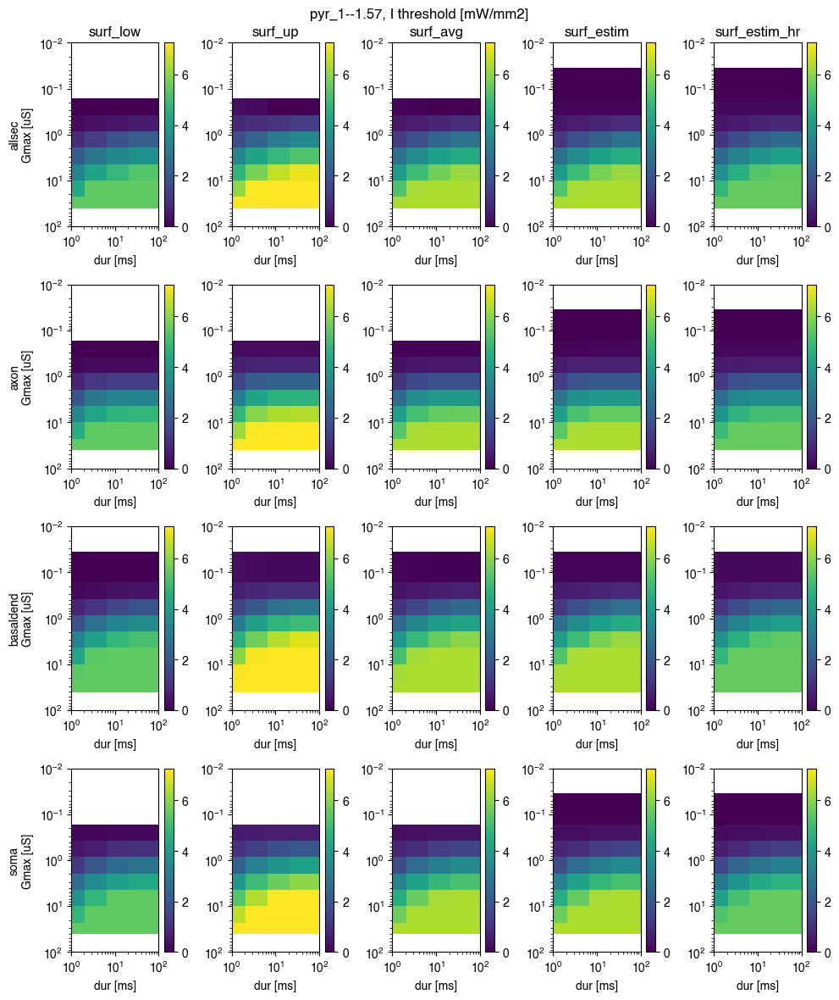

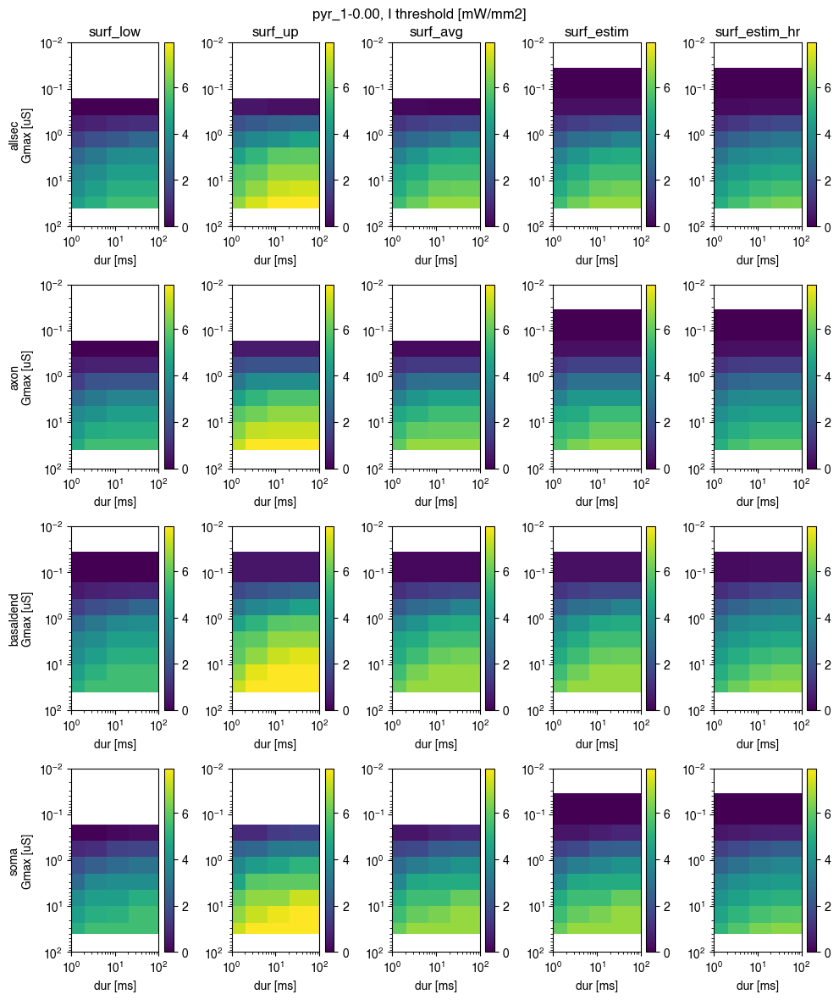

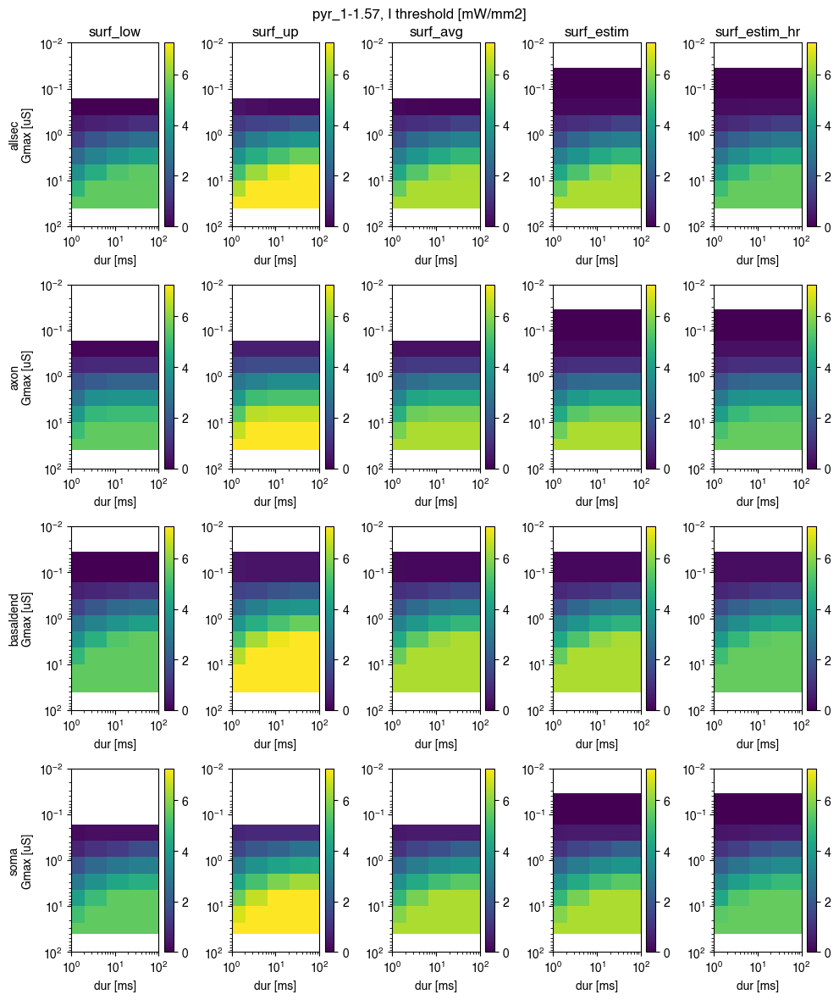

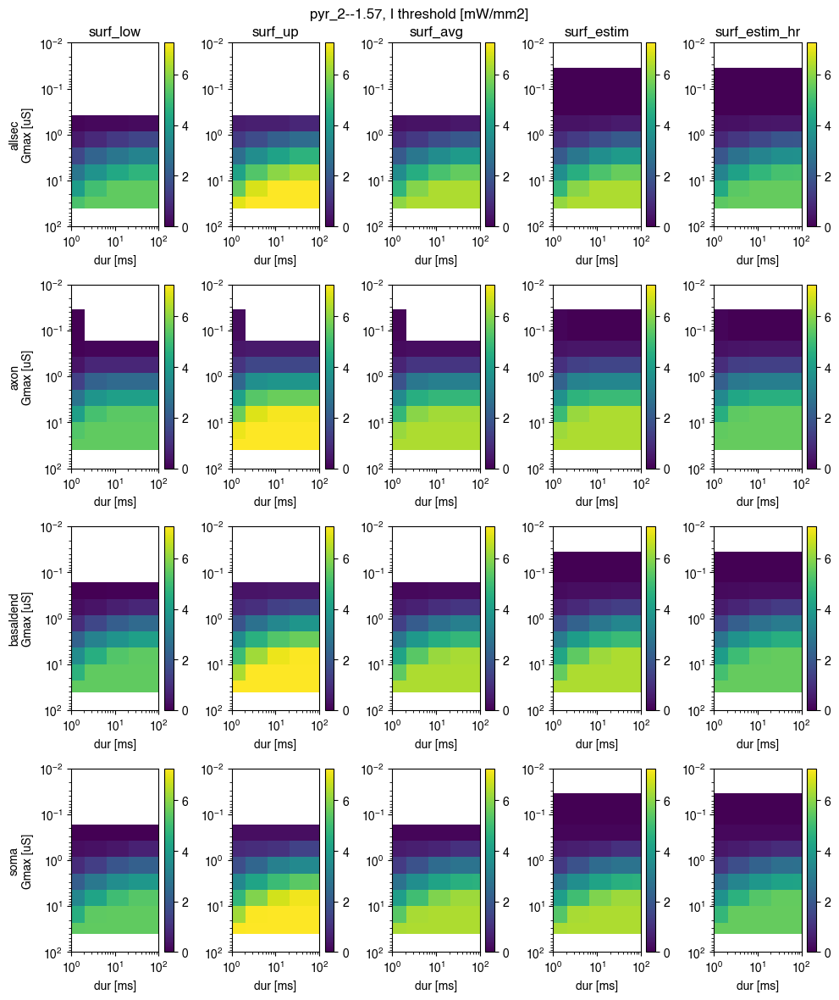

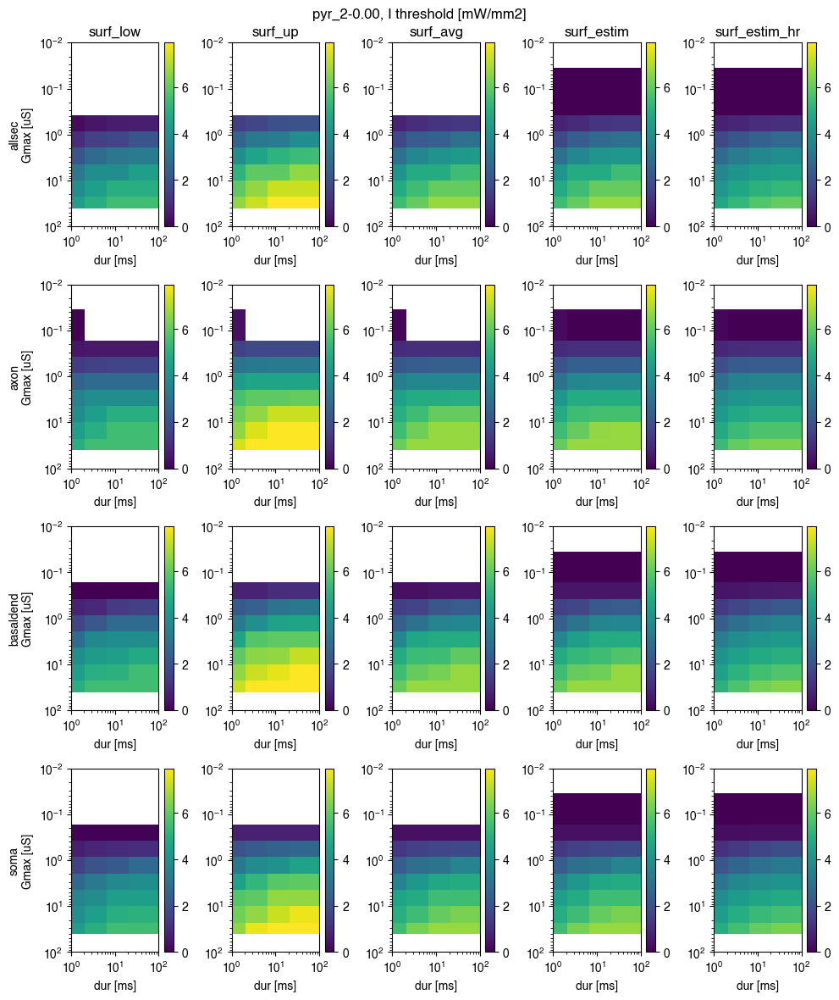

...

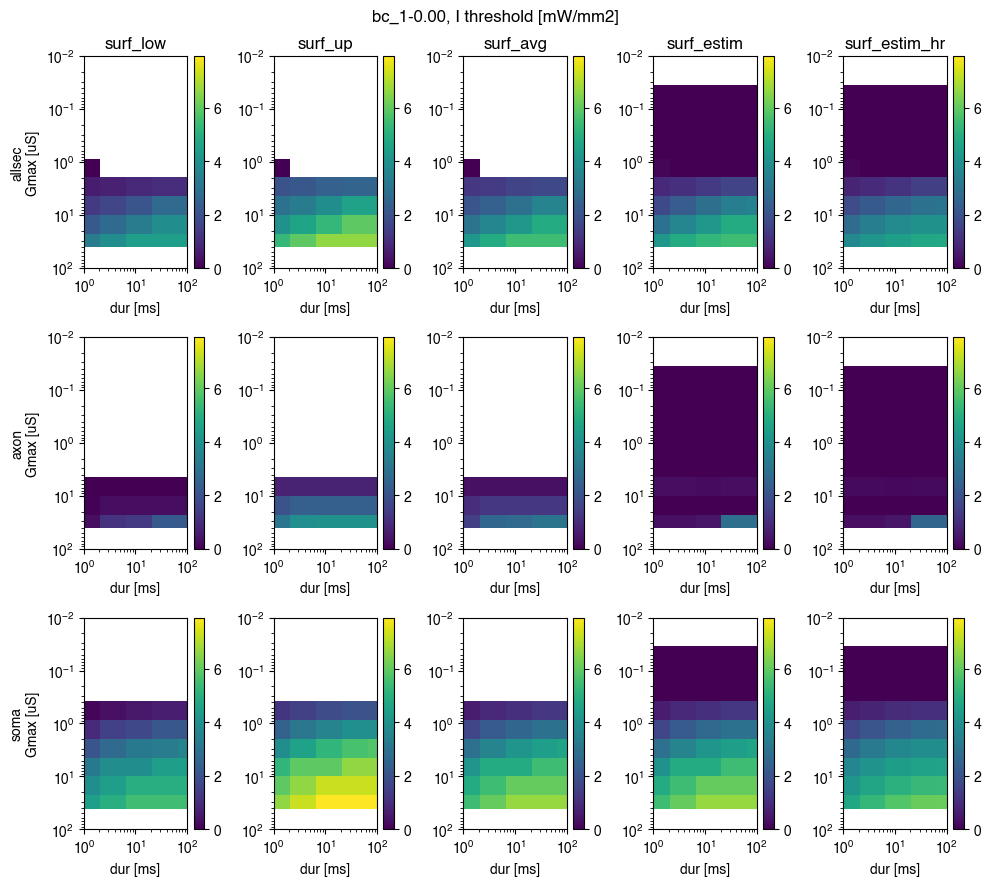

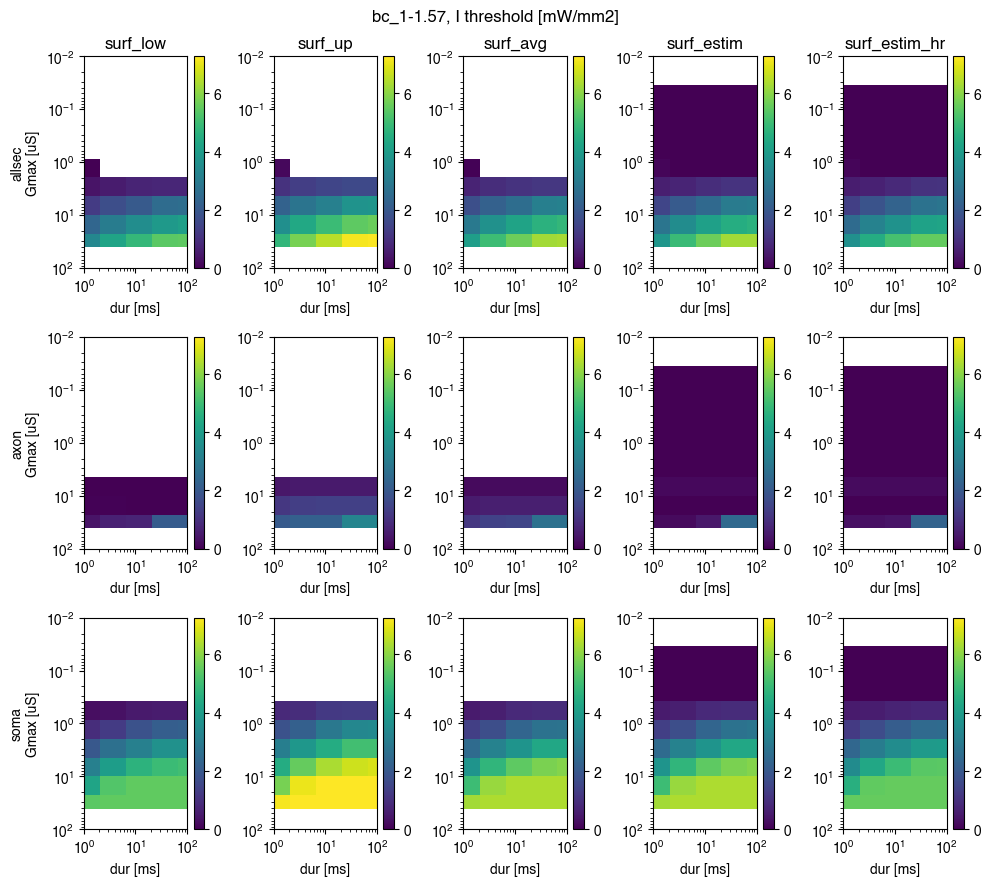

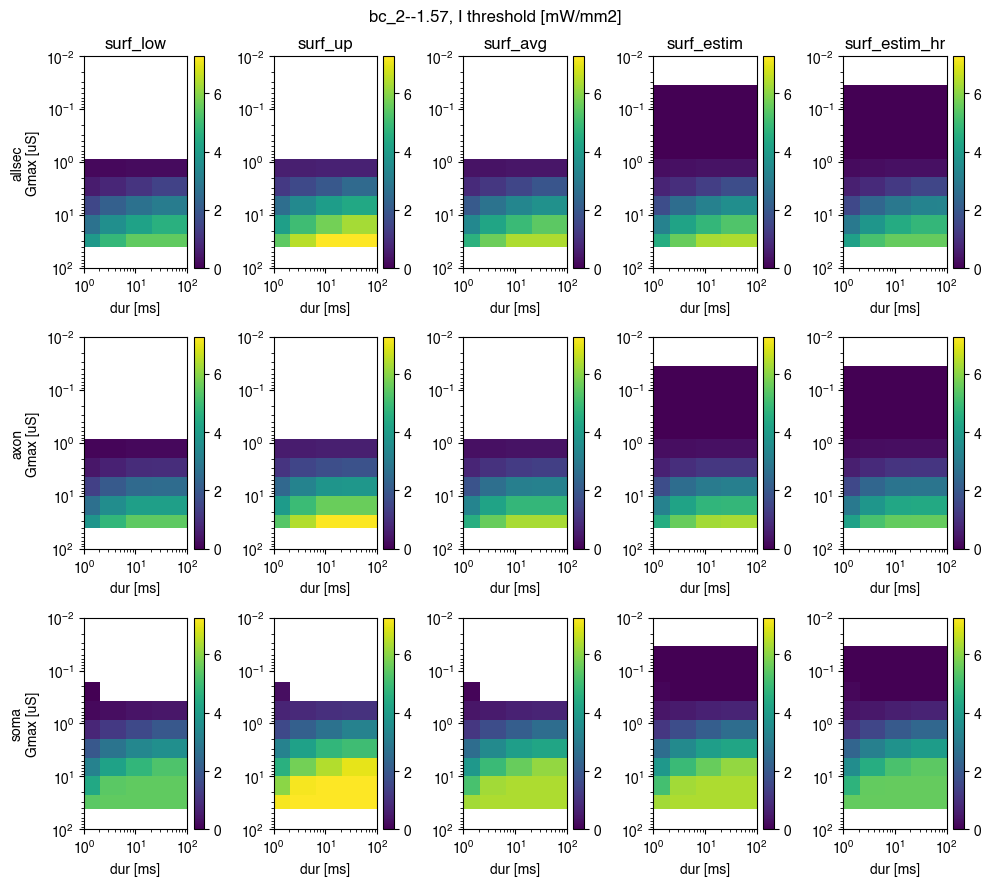

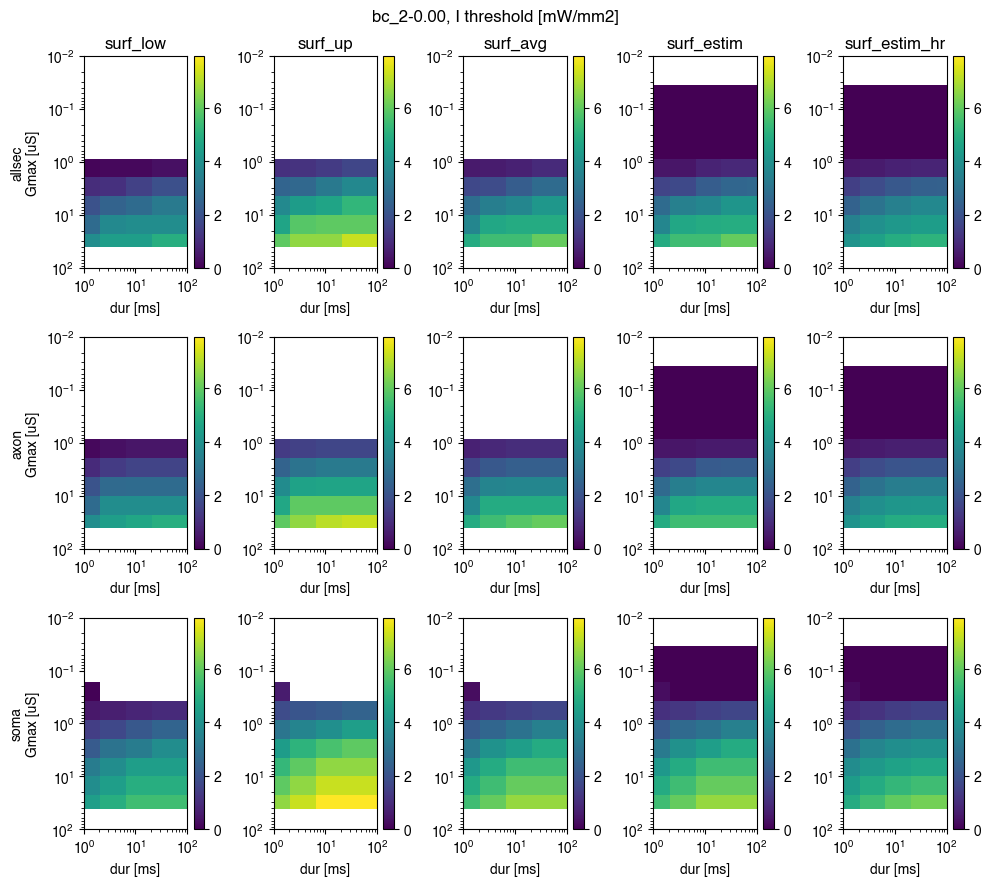

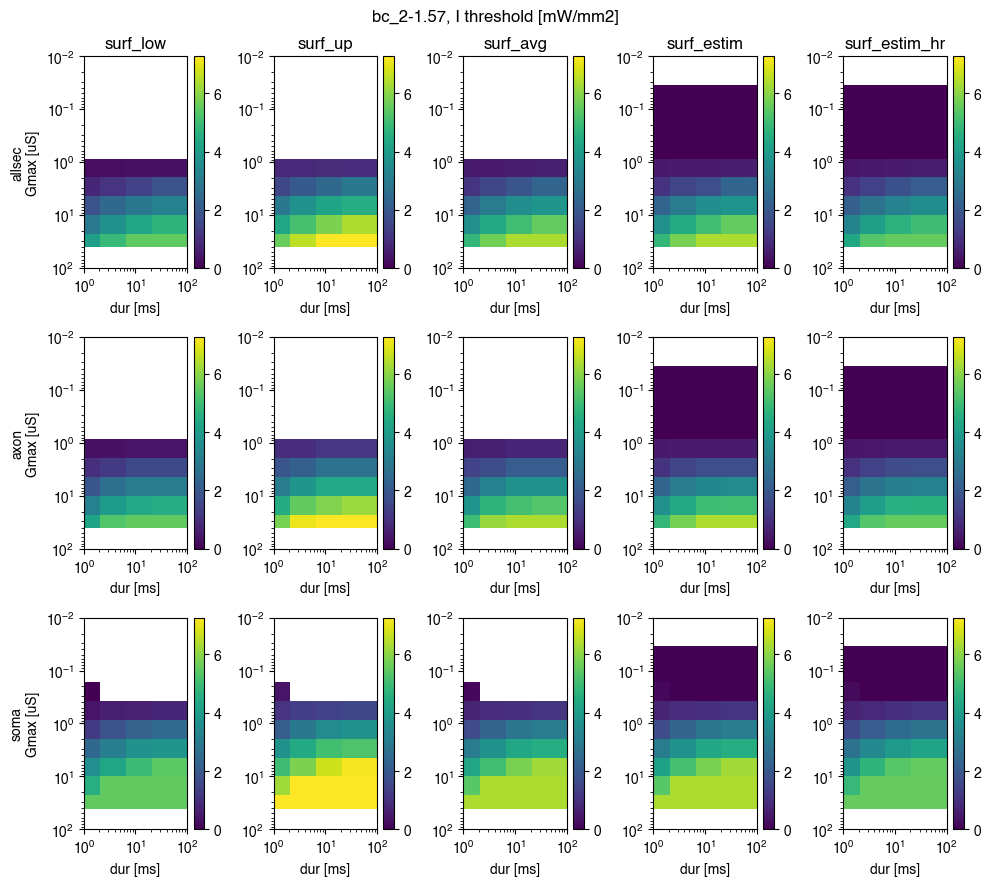

In [7]:

levels = [0.1,1,10]
norm_log_cntr = mpl.cm.colors.LogNorm(vmax=levels[-1], vmin=levels[0])
for neurontemplate in unique_values_columns_vta['neurontemplate']:
    for pitch in unique_values_columns_vta['theta_0']:
        fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,neurontemplate=neurontemplate,level=100,theta_0=pitch)]
        uAxesVals = fig_df['opsinlocations'].unique()
        fig,axs = plt.subplots(len(uAxesVals),5,tight_layout = True,figsize = (10,3*len(uAxesVals)))
        for i,datalabel in enumerate(['surf_low','surf_up','surf_avg','surf_estim','surf_estim_hr']):
            if not all(np.isnan(fig_df[datalabel])):
                Imin = 0#np.nanmin(fig_df[datalabel])
                if 'surf' in datalabel:
                    Imax = np.nanmax(fig_df[['surf_up','surf_low']].values)
                    norm = mpl.cm.colors.Normalize(vmax=Imax, vmin=Imin)
                else:
                    Imax = np.nanmax(fig_df[datalabel])
                    norm = mpl.cm.colors.PowerNorm(gamma=2,vmax=Imax, vmin=Imin)
                # if Imin<=0 or pitch ==0:
                # else:
                #     norm = cm.colors.LogNorm(vmax=Imax, vmin=Imin)
                for oL,ax in zip(uAxesVals,axs[:,i]):
                    intm_df = fig_df[fig_df['opsinlocations']==oL]
                    data_toplot = EcF.prepareDataforInterp(np.array((intm_df['dur'],intm_df['Gmax'],intm_df[datalabel])).T,'ninterp',sorted=False)
                    yY, zZ = np.meshgrid(data_toplot[0],data_toplot[1],indexing='ij')

                    im,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm)
                    ax.set_xscale('log')
                    ax.set_xlim((min(intm_df['dur'].unique()),max(intm_df['dur'].unique())))
                    ax.set_yscale('log')
                    ax.set_ylim((1e-2,1e2))
                    ax.invert_yaxis()
                    ax.set_xlabel('dur [ms]')
                    if i==0:
                        ax.set_ylabel(f'{oL}\nGmax [uS]')
                    if oL == uAxesVals[0]:
                        ax.set_title(datalabel)
        fig.suptitle(f'{neurontemplate}-{pitch:0.2f}, I threshold [mW/mm2]')
        print()

## Surfaces of activation opsin location = allsec

[array(['allsec', 'axon', 'basaldend', 'soma'], dtype=object), array(['pyr_1', 'pyr_2', 'bc_1', 'bc_2'], dtype=object)]














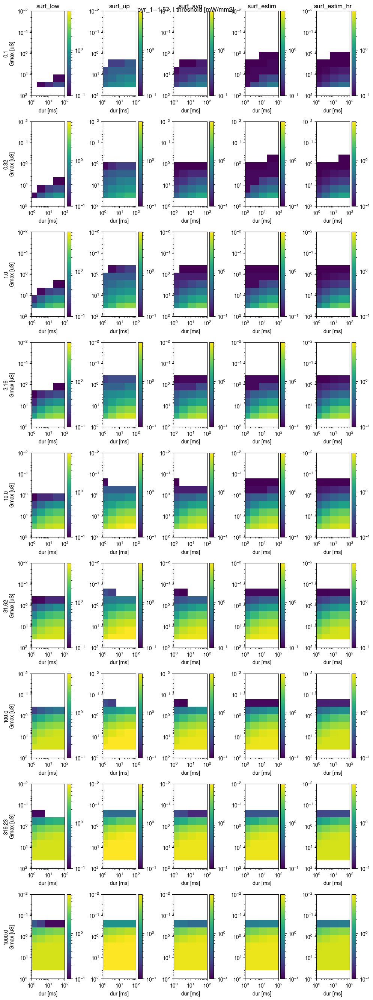

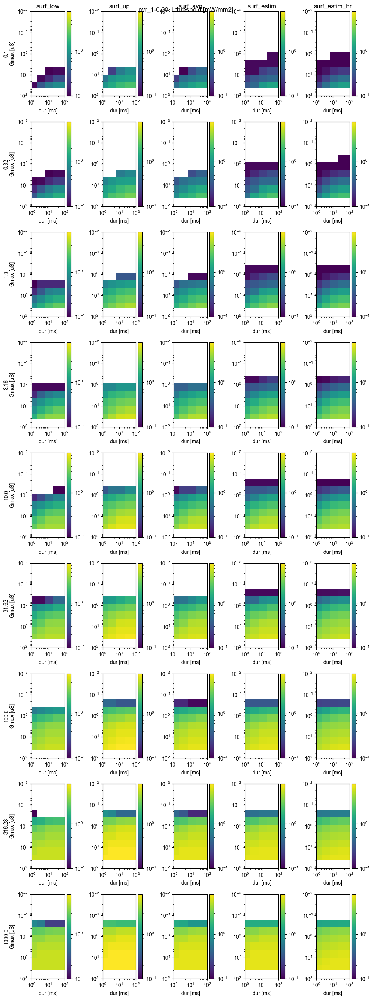

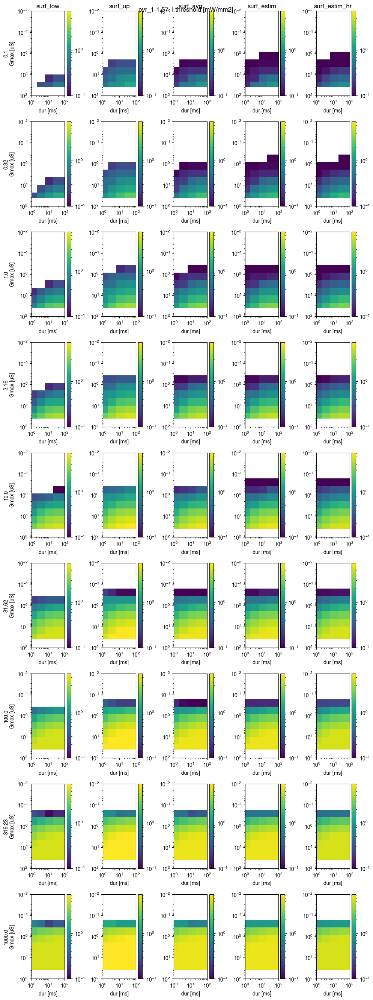

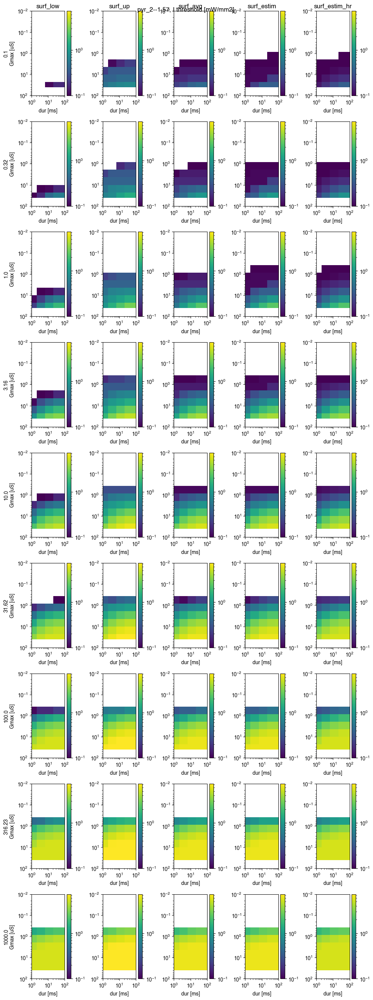

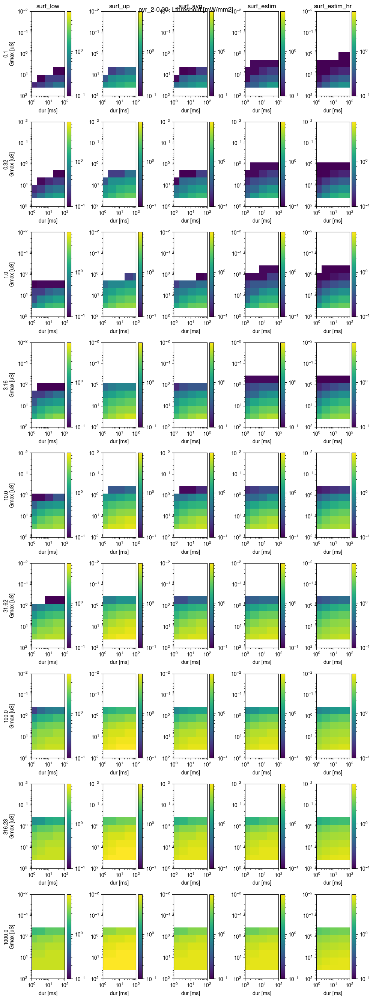

...

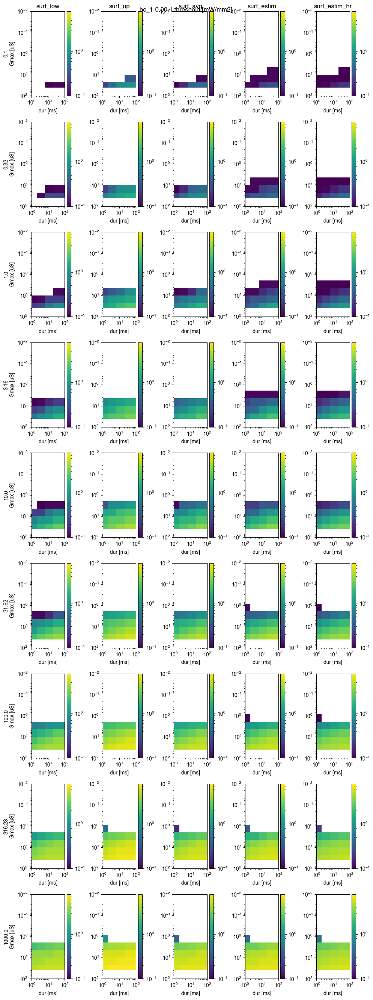

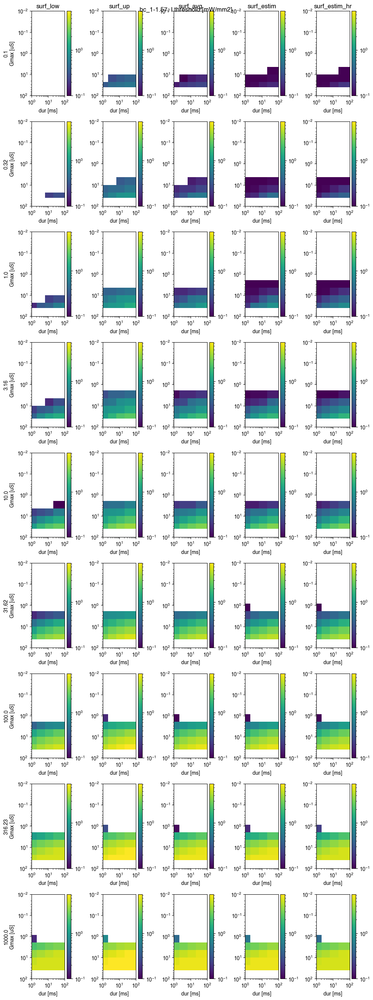

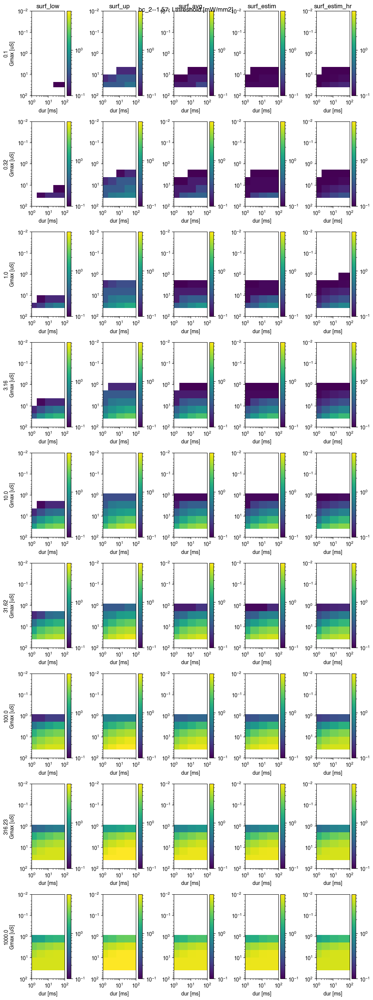

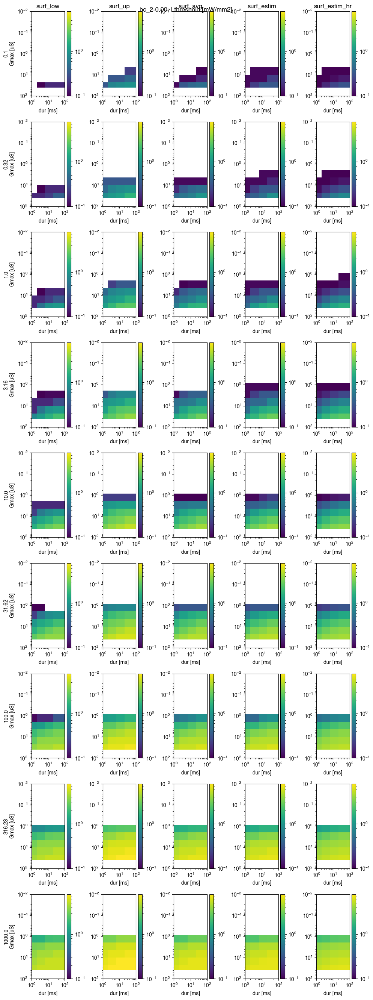

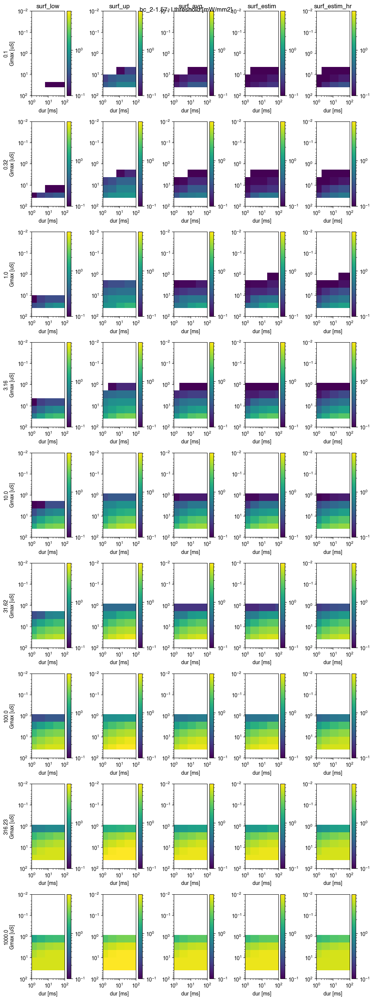

In [8]:
variables = ['opsinlocations','neurontemplate']
print([unique_values_columns_vta[key] for key in variables])
levels = [0.1,1,10]
norm_log_cntr = mpl.cm.colors.LogNorm(vmax=levels[-1], vmin=levels[0])
for neurontemplate in unique_values_columns_vta['neurontemplate']:
    for pitch in unique_values_columns_vta['theta_0']:
        fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,neurontemplate=neurontemplate,opsinlocations='allsec',theta_0=pitch)]
        uAxesVals = fig_df['level'].unique()
        fig,axs = plt.subplots(len(uAxesVals),5,tight_layout = True,figsize = (10,3*len(uAxesVals)))
        for i,datalabel in enumerate(['surf_low','surf_up', 'surf_avg', 'surf_estim', 'surf_estim_hr']):
            if not all(np.isnan(fig_df[datalabel])):
                Imin = 0#np.nanmin(fig_df[datalabel])
                if 'surf' in datalabel:
                    Imax = np.nanmax(fig_df[['surf_up','surf_low']].values)
                    norm = mpl.cm.colors.LogNorm(vmax=Imax, vmin=0.1)
                else:
                    Imax = np.nanmax(fig_df[datalabel])
                    norm = mpl.cm.colors.PowerNorm(gamma=2,vmax=Imax, vmin=Imin)
                # if Imin<=0 or pitch ==0:
                # else:
                #     norm = cm.colors.LogNorm(vmax=Imax, vmin=Imin)
                for uAV,ax in zip(uAxesVals,axs[:,i]):
                    intm_df = fig_df[fig_df['level']==uAV]
                    data_toplot = EcF.prepareDataforInterp(np.array((intm_df['dur'],intm_df['Gmax'],intm_df[datalabel])).T,'ninterp',sorted=False)
                    yY, zZ = np.meshgrid(data_toplot[0],data_toplot[1],indexing='ij')

                    im,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm)
                    ax.set_xscale('log')
                    ax.set_xlim((min(intm_df['dur'].unique()),max(intm_df['dur'].unique())))
                    ax.set_yscale('log')
                    ax.set_ylim((1e-2,1e2))
                    ax.invert_yaxis()
                    ax.set_xlabel('dur [ms]')
                    if i==0:
                        ax.set_ylabel(f'{uAV}\nGmax [uS]')
                    if uAV == uAxesVals[0]:
                        ax.set_title(datalabel)
        fig.suptitle(f'{neurontemplate}-{pitch:0.2f}, I threshold [mW/mm2]')
        print()

## change in surf for intensity fixed pulse duration 10 ms  wrt Optrode level

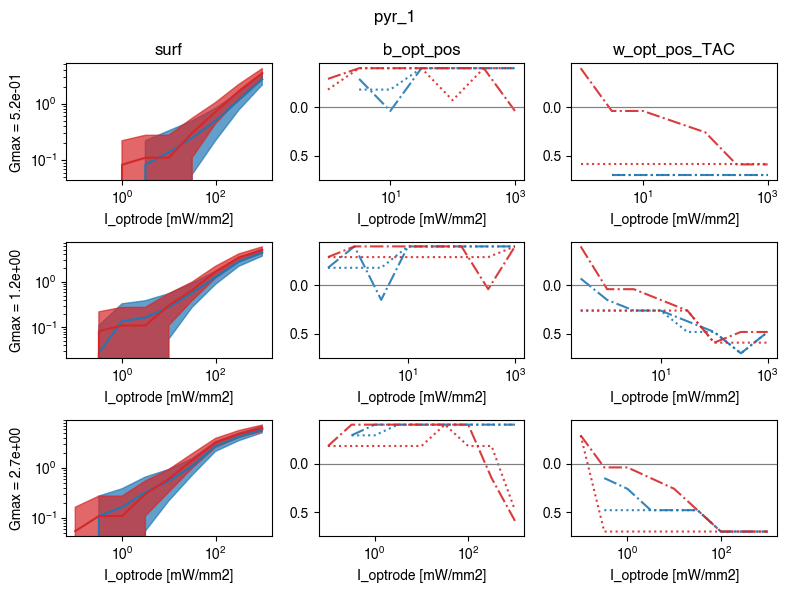

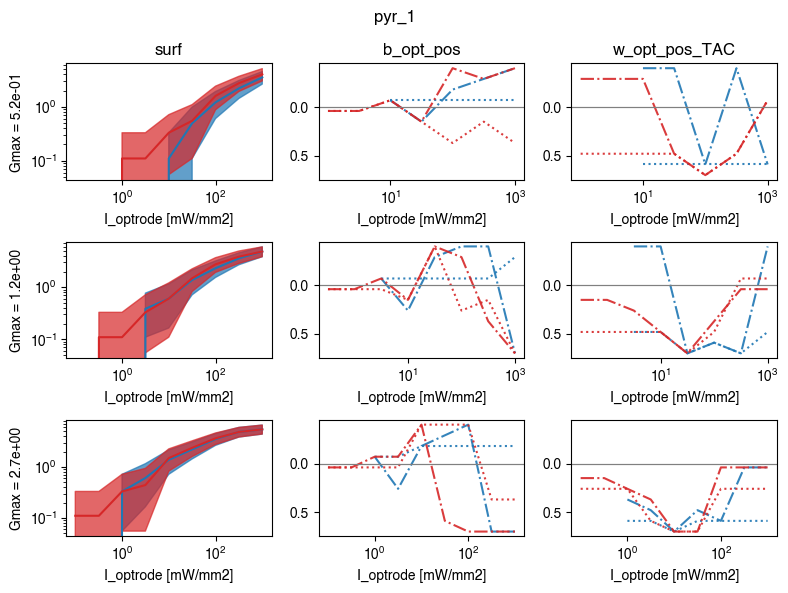

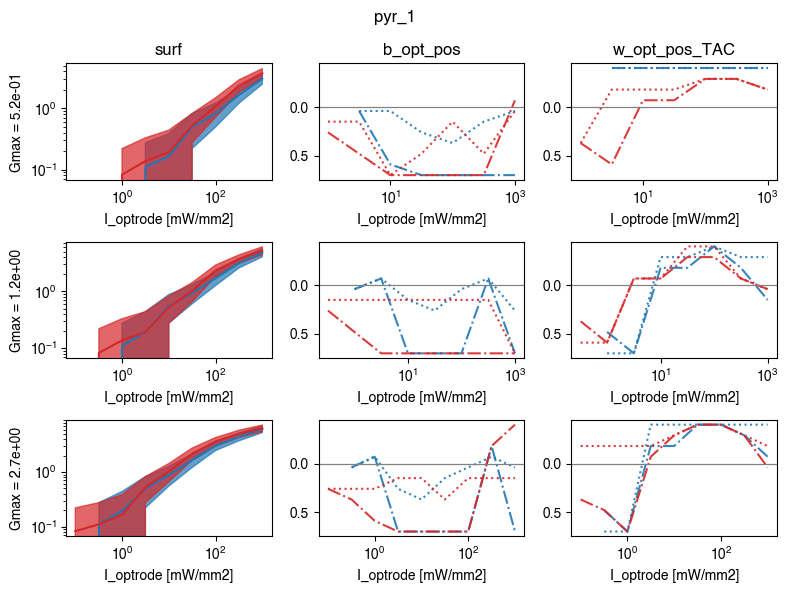

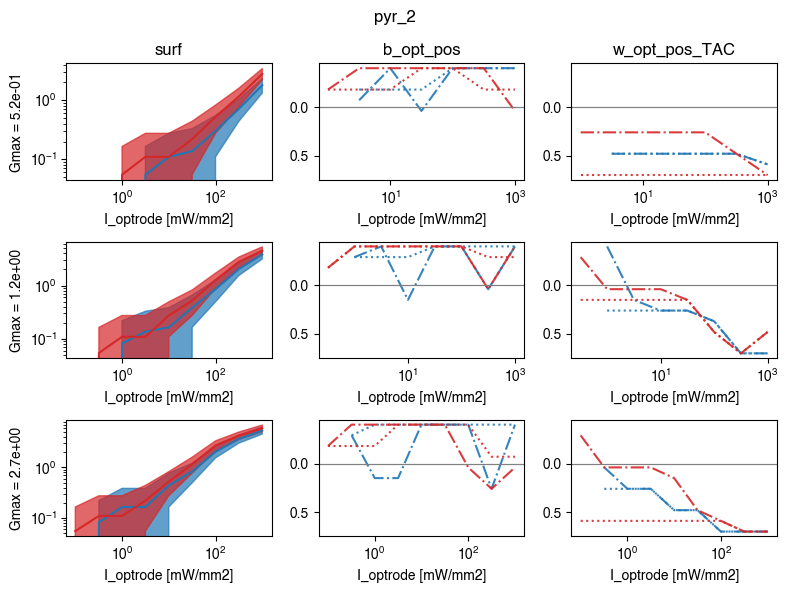

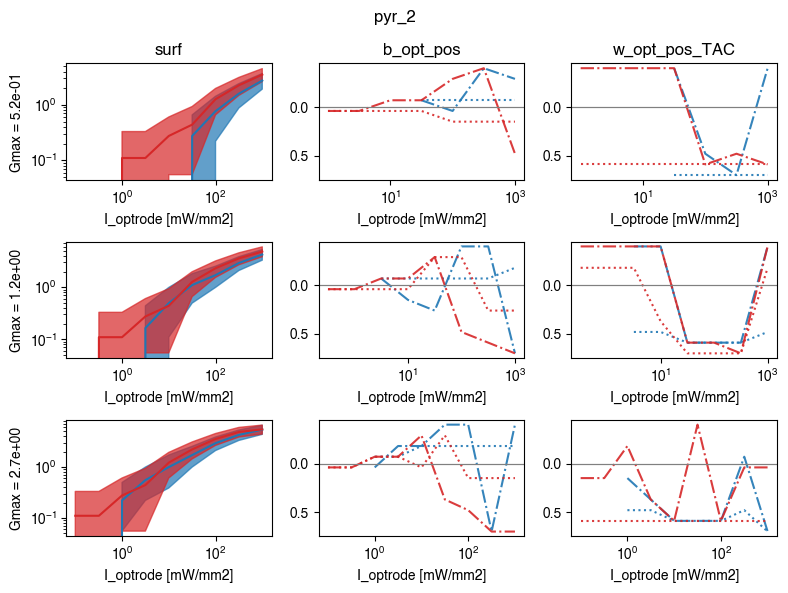

...

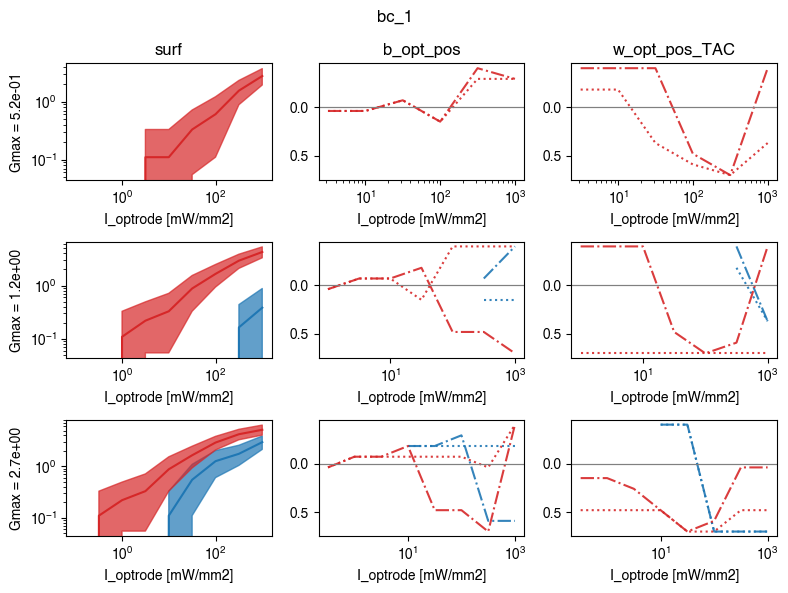

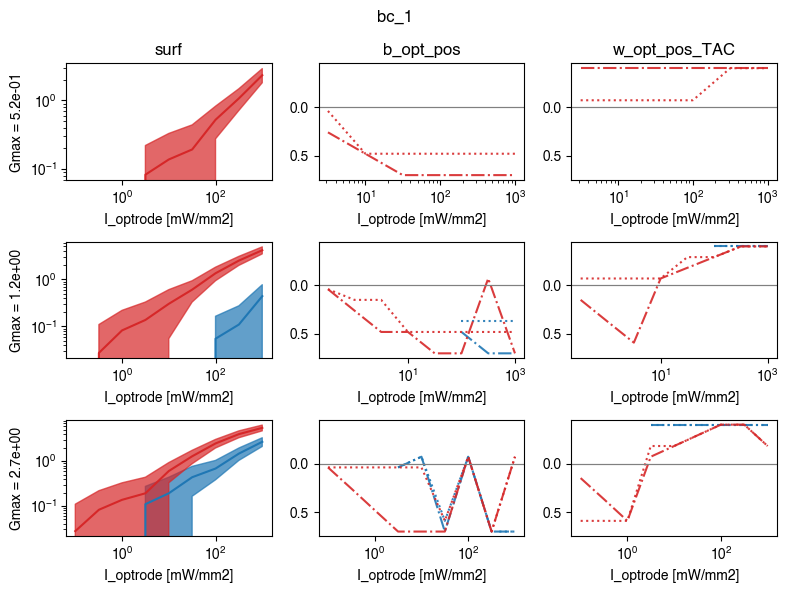

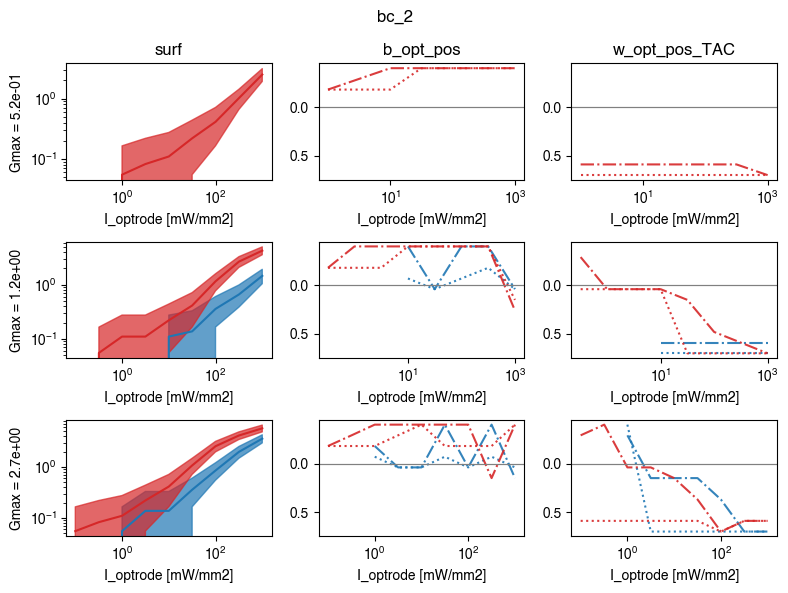

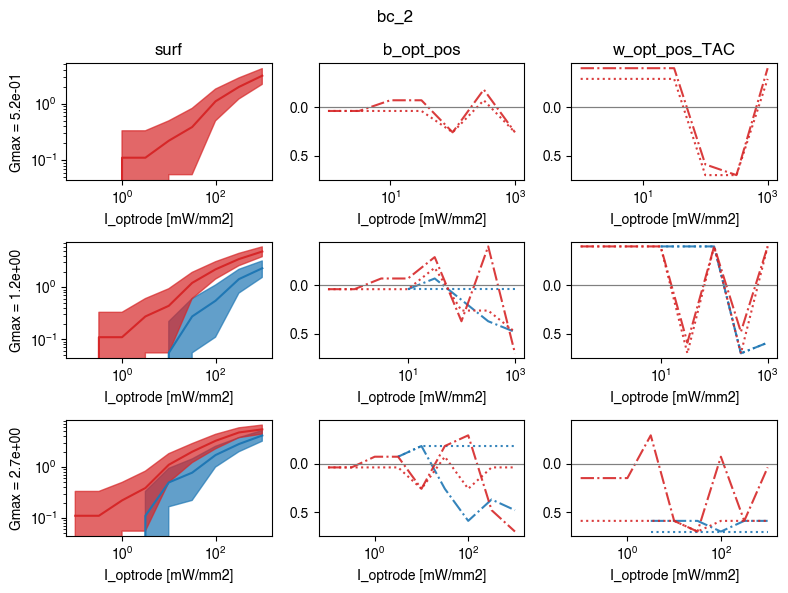

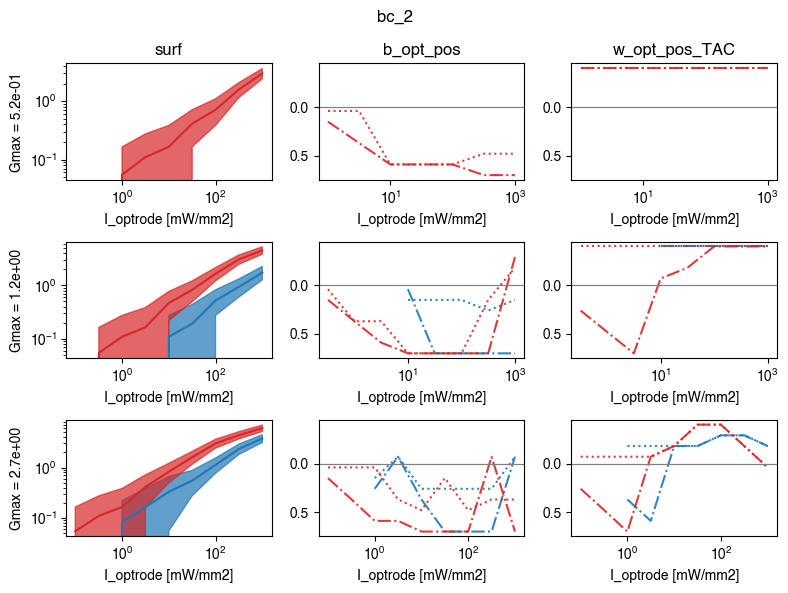

In [9]:
for neurontemplate,linestyle in zip(unique_values_columns_vta['neurontemplate'],linestyle_str):
    for pitch in unique_values_columns_vta['theta_0']:
        fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,neurontemplate=neurontemplate,dur=1,theta_0=pitch)]
        uGmax = np.sort(fig_df['Gmax'].unique())[2:5]
        fig,axs = plt.subplots(len(uGmax),3,tight_layout = True,figsize = (8,2*len(uGmax)))
        for i,datalabel in enumerate(['surf','b_opt_pos','w_opt_pos_TAC']):
            for uG,ax in zip(uGmax,axs[:,i]):
                xlogscale = False
                ylogscale = False
                intm_df = fig_df[fig_df['Gmax']==uG]
                uOpsinLocations = [x for x in intm_df['opsinlocations'].unique()]
                for oL in ['allsec','soma']:#uOpsinLocations[:1]:
                    clr = colorkeyval[oL]
                    plot_df = intm_df[intm_df['opsinlocations']==oL]
                    xdata = plot_df['level']

                    if datalabel == 'surf':
                        ydata = plot_df['surf_avg']

                        ax.plot(xdata, plot_df['surf_avg'], color=clr, alpha=1,label=oL)
                        clr[-1]=0.7
                        ax.fill_between(xdata, plot_df['surf_low'], plot_df['surf_up'], color=clr, alpha=0.7,label=oL)
                        if sum(~ np.isnan(ydata))>0:
                            xlogscale = True
                            ylogscale = True
                    elif datalabel=='w_opt_pos_TAC':
                        ydata = plot_df['w_opt_pos_TAC']
                        ax.plot(xdata,plot_df['w_opt_pos_TAC'], linestyle=':',color=clr, alpha=0.9)
                        ax.plot(xdata,plot_df['w_opt_pos_TACamp'], linestyle='-.',color=clr, alpha=0.9)
                        ax.axhline(0, color='grey', linewidth=0.8)
                        if any(~ np.isnan(ydata)):
                            xlogscale = True
                        # if pitch!=0:
                        #     minz = min(master_df.query(f"theta_0=={pitch}")['z'])*1000
                        #     ax.set_ylim((minz+plot_df['z_0'].iloc[0]-100,plot_df['z_0'].iloc[0]))
                        # else:
                        #     minx = min(master_df.query(f"theta_0=={pitch}")['x'])*1000
                        #     ax.set_ylim((minx+plot_df['x_0'].iloc[0]-100,plot_df['x_0'].iloc[0]))

                    else:
                        ydata = plot_df['b_opt_pos']
                        #ax.plot(xdata,plot_df['b_opt_pos'], linestyle='--',color=clr, alpha=0.9)
                        ax.plot(xdata,plot_df['b_opt_pos_TAC'], linestyle=':',color=clr, alpha=0.9)
                        ax.plot(xdata,plot_df['b_opt_pos_TACamp'], linestyle='-.',color=clr, alpha=0.9)
                        ax.axhline(0, color='grey', linewidth=0.8)
                        if any(~ np.isnan(ydata)):
                            xlogscale = True
                        # if pitch!=0:
                        #     minz = min(master_df.query(f"theta_0=={pitch}")['z'])*1000
                        #     ax.set_ylim((minz+plot_df['z_0'].iloc[0]-100,plot_df['z_0'].iloc[0]))
                        # else:
                        #     minx = min(master_df.query(f"theta_0=={pitch}")['x'])*1000
                        #     ax.set_ylim((minx+plot_df['x_0'].iloc[0]-100,plot_df['x_0'].iloc[0]))


                if xlogscale:
                    ax.set_xscale('log')
                if ylogscale:
                    ax.set_yscale('log')
                ax.set_xlabel('I_optrode [mW/mm2]')
                if i==0:
                    ax.set_ylabel(f'Gmax = {uG:0.1e}')
                if uG == uGmax[0]:
                    ax.set_title(datalabel)
                    # if i==0:
                        # ax.legend(ncol=3)
                if i>0:
                    ax.set_ylim([-0.450,0.750])
                    ax.invert_yaxis()


        fig.suptitle(f'{neurontemplate}')
        print()

# Optimal position

,b_opt_pos_TAC,w_opt_pos_TAC,dur,opsinlocations,neurontemplate,theta_0,level,Gmax,selector
360,NaN,NaN,1.0,allsec,pyr_1,1.57,0.10,0.10,allsec
361,NaN,NaN,1.0,allsec,pyr_1,1.57,0.32,0.10,allsec
362,NaN,NaN,1.0,allsec,pyr_1,1.57,1.00,0.10,allsec
363,NaN,NaN,1.0,allsec,pyr_1,1.57,3.16,0.10,allsec
364,NaN,NaN,1.0,allsec,pyr_1,1.57,10.00,0.10,allsec
...,...,...,...,...,...,...,...,...,...
14800,0.26,-0.4,100.0,soma,bc_2,1.57,10.00,31.62,soma
14801,0.26,-0.4,100.0,soma,bc_2,1.57,31.62,31.62,soma
14802,0.26,-0.4,100.0,soma,bc_2,1.57,100.00,31.62,soma
14803,0.26,-0.4,100.0,soma,bc_2,1.57,316.23,31.62,soma


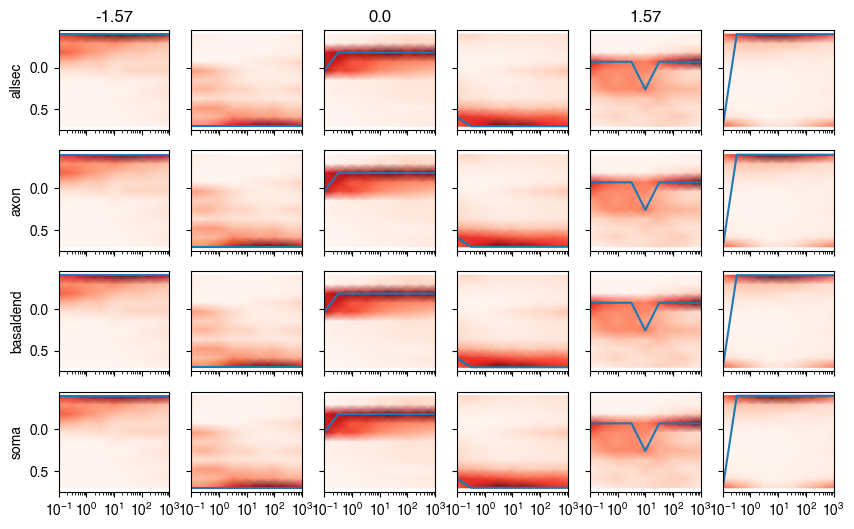

In [10]:
zpos = np.arange(-400,810,110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
#vta_limit_df['selector'] = vta_limit_df.apply(lambda x: f"{x['opsinlocations']}_{x['neurontemplate']}",axis=1)
vta_limit_df['selector'] = vta_limit_df.apply(lambda x: f"{x['opsinlocations']}",axis=1)
ukeys = vta_limit_df['selector'].unique()
columnsOI = ['b_opt_pos_TAC','w_opt_pos_TAC','dur','opsinlocations','neurontemplate','theta_0','level','Gmax','selector']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['theta_0']==pitch)#(vta_limit_df['selector']==uk) & (vta_limit_df['theta_0']==pitch)
        intm_df = vta_limit_df.loc[idx,columnsOI]
        b_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        w_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                b_opt_dict[pitch][uk][i,j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                w_opt_dict[pitch][uk][i,j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)




vta_limit_df.drop(columns=['selector'])


fig,axs = plt.subplots(len(ukeys),6,figsize=(10,6),sharex=True,sharey=True)
xX,yY = np.meshgrid(intensities,zpos)
for uk, axrow in zip(ukeys,axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX,yY,b_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk],axis=0)
        axrow[i*2].plot(intensities,zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45,0.750])

        axrow[i*2+1].pcolormesh(xX,yY,w_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk],axis=0)
        axrow[i*2+1].plot(intensities,zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45,0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk==ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0,0].invert_yaxis()
intm_df

C:\Users\rschoete\AppData\Local\Temp\ipykernel_26424\3560962326.py:25: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
C:\Users\rschoete\AppData\Local\Temp\ipykernel_26424\3560962326.py:26: RuntimeWarning: invalid value encountered in true_divide
  w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)
C:\Users\rschoete\AppData\Local\Temp\ipykernel_26424\3560962326.py:25: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
C:\Users\rschoete\AppData\Local\Temp\ipykernel_26424\3560962326.py:26: RuntimeWarning: invalid value encountered in true_divide
  w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)
C:\Users\rschoete\AppData\Local\Temp\ipykernel_26424\3560962326.py:25: RuntimeWarning: invalid value encountered in true_divide
  b_opt_dict[pitch][

,b_opt_pos_TAC,w_opt_pos_TAC,dur,opsinlocations,neurontemplate,theta_0,level,Gmax,selector
14400,NaN,NaN,1.0,soma,bc_2,1.57,0.10,0.10,soma_bc_2
14401,NaN,NaN,1.0,soma,bc_2,1.57,0.32,0.10,soma_bc_2
14402,NaN,NaN,1.0,soma,bc_2,1.57,1.00,0.10,soma_bc_2
14403,NaN,NaN,1.0,soma,bc_2,1.57,3.16,0.10,soma_bc_2
14404,NaN,NaN,1.0,soma,bc_2,1.57,10.00,0.10,soma_bc_2
...,...,...,...,...,...,...,...,...,...
14800,0.26,-0.4,100.0,soma,bc_2,1.57,10.00,31.62,soma_bc_2
14801,0.26,-0.4,100.0,soma,bc_2,1.57,31.62,31.62,soma_bc_2
14802,0.26,-0.4,100.0,soma,bc_2,1.57,100.00,31.62,soma_bc_2
14803,0.26,-0.4,100.0,soma,bc_2,1.57,316.23,31.62,soma_bc_2


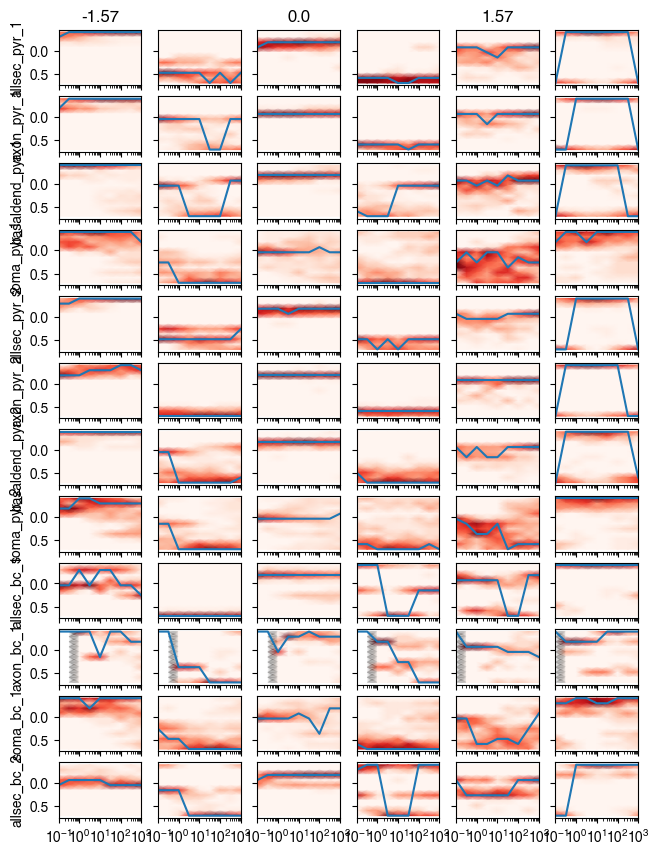

In [11]:
zpos = np.arange(-400,810,110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
vta_limit_df['selector'] = vta_limit_df.apply(lambda x: f"{x['opsinlocations']}_{x['neurontemplate']}",axis=1)
ukeys = vta_limit_df['selector'].unique()
columnsOI = ['b_opt_pos_TAC','w_opt_pos_TAC','dur','opsinlocations','neurontemplate','theta_0','level','Gmax','selector']
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}
    for uk in ukeys[:]:
        idx = (vta_limit_df['selector']==uk) & (vta_limit_df['theta_0']==pitch)
        intm_df = vta_limit_df.loc[idx,columnsOI]
        b_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        w_opt_dict[pitch][uk]=np.zeros((len(zpos),len(intensities)))
        for i, zp in enumerate(zpos):
            for j, ity in enumerate(intensities):
                idx = (intm_df['b_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                b_opt_dict[pitch][uk][i,j] = np.sum(idx)

                idx = (intm_df['w_opt_pos_TAC']==zp) & (intm_df['level']==ity)
                w_opt_dict[pitch][uk][i,j] = np.sum(idx)

        b_opt_dict[pitch][uk] = b_opt_dict[pitch][uk]/np.sum(b_opt_dict[pitch][uk],axis=0)
        w_opt_dict[pitch][uk] = w_opt_dict[pitch][uk]/np.sum(w_opt_dict[pitch][uk],axis=0)




vta_limit_df.drop(columns=['selector'])


fig,axs = plt.subplots(12,6,figsize=(19/2.54,26/2.54),sharex=True,sharey=True)
xX,yY = np.meshgrid(intensities,zpos)
for uk, axrow in zip(ukeys,axs):
    for i, theta in enumerate(thetas):
        axrow[i*2].pcolormesh(xX,yY,b_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(b_opt_dict[theta][uk],axis=0)
        axrow[i*2].plot(intensities,zpos[idx_max])
        axrow[i*2].set_xscale('log')
        axrow[i*2].set_ylim([-0.45,0.750])

        axrow[i*2+1].pcolormesh(xX,yY,w_opt_dict[theta][uk],shading='gouraud',alpha=1,cmap='Reds')
        idx_max = np.argmax(w_opt_dict[theta][uk],axis=0)
        axrow[i*2+1].plot(intensities,zpos[idx_max])
        axrow[i*2+1].set_xscale('log')
        axrow[i*2+1].set_ylim([-0.45,0.750])
        axrow[i*2].invert_yaxis()
        axrow[i*2+1].invert_yaxis()

        if uk==ukeys[0]:
            axrow[i*2].set_title(theta)
    axrow[0].set_ylabel(uk)

axs[0,0].invert_yaxis()
intm_df

# Paper plots

1.18


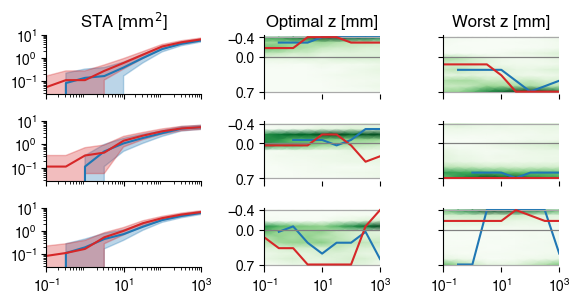

In [12]:

zpos = np.arange(-400,810,110)/1000
intensities = unique_values_columns_vta['level']
thetas = unique_values_columns_vta['theta_0']
xX,yY = np.meshgrid(intensities,zpos)
columnsOI = ['b_opt_pos_TAC','w_opt_pos_TAC','dur','opsinlocations','neurontemplate','theta_0','level','Gmax']

# colloect best and worst positions
b_opt_dict = {}
w_opt_dict = {}
for pitch in thetas:
    b_opt_dict[pitch] = {}
    w_opt_dict[pitch] = {}

    idx = (vta_limit_df['theta_0']==pitch)
    intm_df = vta_limit_df.loc[idx,columnsOI]
    b_opt_dict[pitch]=np.zeros((len(zpos),len(intensities)))
    w_opt_dict[pitch]=np.zeros((len(zpos),len(intensities)))
    for i, zp in enumerate(zpos):
        for j, ity in enumerate(intensities):
            idx = (intm_df['b_opt_pos_TAC']==zp) & (intm_df['level']==ity)
            b_opt_dict[pitch][i,j] = np.sum(idx)

            idx = (intm_df['w_opt_pos_TAC']==zp) & (intm_df['level']==ity)
            w_opt_dict[pitch][i,j] = np.sum(idx)

    b_opt_dict[pitch] = b_opt_dict[pitch]/np.sum(b_opt_dict[pitch],axis=0)
    w_opt_dict[pitch] = w_opt_dict[pitch]/np.sum(w_opt_dict[pitch],axis=0)

# create figure
fig = plt.figure(tight_layout = True,figsize = (15/2.54,8/2.54))
gs = mpl.gridspec.GridSpec(3, 3, width_ratios=[4, 3, 3], height_ratios=[1, 1, 1])
axs = []
for i in range(3):
    axs_intm = []
    for j in range(3):
        idx = i*3+j
        axs_intm.append(fig.add_subplot(gs[idx]))
    axs.append(axs_intm)
axs = np.array(axs)
fig_df = vta_limit_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,neurontemplate='pyr_1',dur=10)]
uGmax = np.sort(fig_df['Gmax'].unique())[3]
print(uGmax)
fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,neurontemplate='pyr_1',dur=10, Gmax=uGmax)]
for i,datalabel in enumerate(['surf','b_opt_pos','w_opt_pos_TAC']):
    for pitch, ax in zip(unique_values_columns_vta['theta_0'], axs[:,i]):
        xlogscale = False
        ylogscale = False

        intm_df = fig_df[fig_df['theta_0']==pitch]
        uOpsinLocations = [x for x in intm_df['opsinlocations'].unique()]
        for oL in ['allsec','soma']:#uOpsinLocations[:1]:
            clr = colorkeyval[oL]
            plot_df = intm_df[intm_df['opsinlocations']==oL]
            xdata = plot_df['level']

            if datalabel == 'surf':
                ydata = plot_df['surf_avg']

                ax.plot(xdata, plot_df['surf_avg'], color=clr, alpha=1,label=oL)
                clr[-1]=0.7
                ax.fill_between(xdata, plot_df['surf_low'], plot_df['surf_up'], color=clr, alpha=0.3,label=oL)
                if sum(~ np.isnan(ydata))>0:
                    xlogscale = True
                    ylogscale = True
            elif datalabel=='w_opt_pos_TAC':
                if oL=='allsec':
                    ax.pcolormesh(xX,yY,w_opt_dict[pitch],shading='gouraud',cmap='Greens',rasterized=True)
                ax.axhline(-0.4, color='darkgrey', linewidth=0.8)
                ax.axhline(0.7, color='darkgrey', linewidth=0.8)
                ydata = plot_df['w_opt_pos_TAC']
                ax.plot(xdata,plot_df['w_opt_pos_TAC'], linestyle='-',color=clr, alpha=1)
                #ax.plot(xdata,plot_df['w_opt_pos_TACamp'], linestyle='-.',color=clr, alpha=0.9)
                ax.axhline(0, color='grey', linewidth=0.8)

                if any(~ np.isnan(ydata)):
                    xlogscale = True
            else:
                if oL=='allsec':
                    ax.pcolormesh(xX,yY,b_opt_dict[pitch],shading='gouraud',cmap='Greens',rasterized=True)
                ax.axhline(-0.4, color='darkgrey', linewidth=0.8)
                ax.axhline(0.7, color='darkgrey', linewidth=0.8)
                ydata = plot_df['b_opt_pos']
                #ax.plot(xdata,plot_df['b_opt_pos'], linestyle='--',color=clr, alpha=0.9)
                ax.plot(xdata,plot_df['b_opt_pos_TAC'], linestyle='-',color=clr, alpha=1)
                #ax.plot(xdata,plot_df['b_opt_pos_TACamp'], linestyle='-.',color=clr, alpha=0.9)
                ax.axhline(0, color='grey', linewidth=0.8)

                if any(~ np.isnan(ydata)):
                    xlogscale = True


        if xlogscale:
            ax.set_xscale('log')
        if ylogscale:
            ax.set_yscale('log')


        if i>0:
            ax.set_ylim([-0.450,0.750])
            ax.invert_yaxis()
            ax.set_yticks([-0.4,0,0.7])
            ax.spines[['top','right']].set_visible(False)

        if i>1:
            ax.set_yticklabels([])
        if i>0:
            ax.spines[['top','right','bottom']].set_visible(False)
            ax.set_xticks([])
            ax.minorticks_off()
        if i==0:
            ax.set_ylim([0.11*0.25,10])
            ax.spines[['top','right']].set_visible(False)

        ax.set_xlim([0.1,10**3])
        ax.set_xticks([0.1,10,10**3])
axs[0,0].set_title('STA [$\mathrm{mm}^2$]')
axs[0,1].set_title('Optimal z [mm]')
axs[0,2].set_title('Worst z [mm]')
for ax in axs[0:2,0:3].ravel():
    ax.set_xticklabels([])
fig.savefig('vta_bestpos.svg',dpi=300)


{'neurontemplate': 'pyr_1', 'opsinlocations': 'allsec'}
1.1788
0



C:\Users\rschoete\AppData\Local\Temp\ipykernel_26424\3117254080.py:90: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.savefig('threshholdf_tac.svg')
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


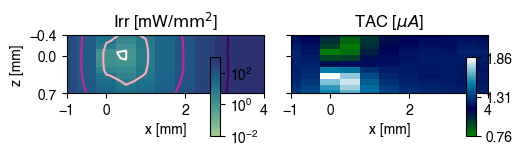

In [13]:
single_theta = True
cmap_Irr = sns.color_palette("crest", as_cmap=True)
cmap_TAC = 'ocean'
myselection_noGmax = {'neurontemplate':'pyr_1', 'opsinlocations': 'allsec'}

print(myselection_noGmax)
intm_df = master_df[selection_generator(master_df,unique_values_columns_master,verbose=False,**myselection_noGmax)]
gmaxs = list(intm_df['Gmax'].unique())
print_upscale = False
nan_tolerance_percentage = 0.95

uGmax = np.sort(gmaxs)[3]
print(uGmax)
dur = 10
levels = np.logspace(0,3,4)
norm_log_amp = mpl.cm.colors.LogNorm(vmax=1000, vmin=0.01)
norm_log_cntr = mpl.cm.colors.LogNorm(vmax=levels[-1], vmin=levels[0])

if single_theta:
    myselection = {**myselection_noGmax, 'Gmax': uGmax, 'dur': dur, 'theta_0': 0}
    thetas = [0]
else:
    myselection = {**myselection_noGmax, 'Gmax': uGmax, 'dur': dur}
    thetas = unique_values_columns_master['theta_0']
fig_df = master_df[selection_generator(master_df,unique_values_columns_master,verbose=False,**myselection)]
TAC_max = np.nanmax(fig_df['TAC'])
TAC_min = np.nanmin(fig_df['TAC'])
norm_log_TAC = mpl.cm.colors.Normalize(vmax=TAC_max, vmin=TAC_min)

fig,axs = plt.subplots(len(thetas),2,tight_layout = True,figsize=np.array([13/2.54,4/2.54]), sharey=True)
if single_theta:
    axs = axs[None,:]
for theta,axrow in zip(thetas,axs):
    print(theta)
    intm_df = fig_df[selection_generator(fig_df,unique_values_columns_master,verbose=False,**{'theta_0': theta})].reset_index(drop=True)

    for i, (feat, ax) in enumerate(zip(['amp','TAC'],axrow)):
        if feat=='amp':
            plot_cntr = True
            norm_log=norm_log_amp
        else:
            plot_cntr = False
            norm_log=norm_log_TAC

        if not np.all(np.isnan(intm_df[feat])):
            data_toplot = np.array((intm_df['x'],intm_df['z'],intm_df[feat])).T
            # if ninterp, data_toplot[-1] is in 'ij' order
            data_toplot = EcF.prepareDataforInterp(data_toplot,'ninterp',sorted=False)
            yY, zZ = np.meshgrid(np.linspace(data_toplot[0].min(),data_toplot[0].max(),len(np.unique(data_toplot[0])),endpoint=True),np.linspace(data_toplot[1].min(),data_toplot[1].max(),len(np.unique(data_toplot[0])),endpoint=True),indexing='ij')

            if sum(np.isnan(data_toplot[-1].flatten()))/len(data_toplot[-1].flatten()) < nan_tolerance_percentage:
                if plot_cntr:
                    im,cntr,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm_log,invert_yaxis=True,contour_kwargs={'norm':norm_log_cntr,'cmap':'RdPu','levels':levels},cmap=cmap_Irr)
                    h, l = cntr.legend_elements("I")
                    if theta!=0:
                        surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(yY,zZ,data_toplot[2],intensity = levels,radial_data=True,gridorder = 'ij')
                    else:
                        surf_avg, surf_low, surf_up = SURFVTA2D_count_hard_lower_upper(yY,zZ,data_toplot[2],intensity = levels,radial_data=False,gridorder = 'ij')
                    # ax.legend(h, [f'{x:0.2f}-{y:0.2f}' if ~np.isnan(x) else '-' for x,y in zip(surf_low,surf_up)],ncol=1,loc='upper right')
                else:
                    im,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm_log,invert_yaxis=True,cmap=cmap_TAC)
                cb.remove()
                im.set_rasterized(True)
        ax.set_ylim((-0.400,0.700))
        ax.set_yticks([-0.400,0,0.700])
        ax.invert_yaxis()
        if theta == thetas[-1]:
            if i==0:
                ax_cb_amp = fig.add_axes([.42, .1, .02, .5])
                cb_amp = fig.colorbar(im, cax=ax_cb_amp)
            else:
                ax_cb_TAC = fig.add_axes([.92, .1, .02, .5])
                cb_TAC = fig.colorbar(im, cax=ax_cb_TAC)
                cb_TAC.ax.set_yticks(np.round([TAC_min,(TAC_max+TAC_min)/2,TAC_max],5))
                cb_TAC.ax.set_yticklabels([x*1e3 for x in cb_TAC.ax.get_yticks()])



if single_theta:
    axs[0,0].set_xlim([-1,4])
    axs[0,1].set_xlim([-1,4])
    axs[0,0].set_xticks([-1,0,2,4])
    axs[0,1].set_xticks([-1,0,2,4])
axs[0,0].set_title('Irr [mW/$\mathrm{mm^2}$]')
axs[0,1].set_title('TAC [$\mu A$]')
axs[1-single_theta,0].set_ylabel('z [mm]')
print()
axs[-1,1].set_xlabel('x [mm]')
axs[-1,0].set_xlabel('x [mm]')
fig.savefig('threshholdf_tac.svg')




# STATISTICS
## Configuration dependence (i.e., not Gmax or dur)

In [14]:
vta_df.columns

Index(['vta_low', 'vta_up', 'surf_low', 'surf_up', 'b_opt_pos',
       'b_opt_pos_TAC', 'w_opt_pos_TAC', 'b_opt_pos_TACamp',
       'w_opt_pos_TACamp', 'dur', 'level', 'theta_0', 'neurontemplate', 'x_0',
       'y_0', 'z_0', 'Gmax', 'opsinlocations', 'theta', 'settings_str',
       'surf_avg', 'vta_low_log10', 'vta_up_log10', 'surf_low_log10',
       'surf_up_log10', 'dur_log10', 'Gmax_log10', 'level_log10', 'celltype',
       'number', 'surf_estim', 'surf_estim_hr', 'nt_ol', 'surf_estim_log10',
       'surf_estim_hr_log10', 'surf_avg_log10'],
      dtype='object')

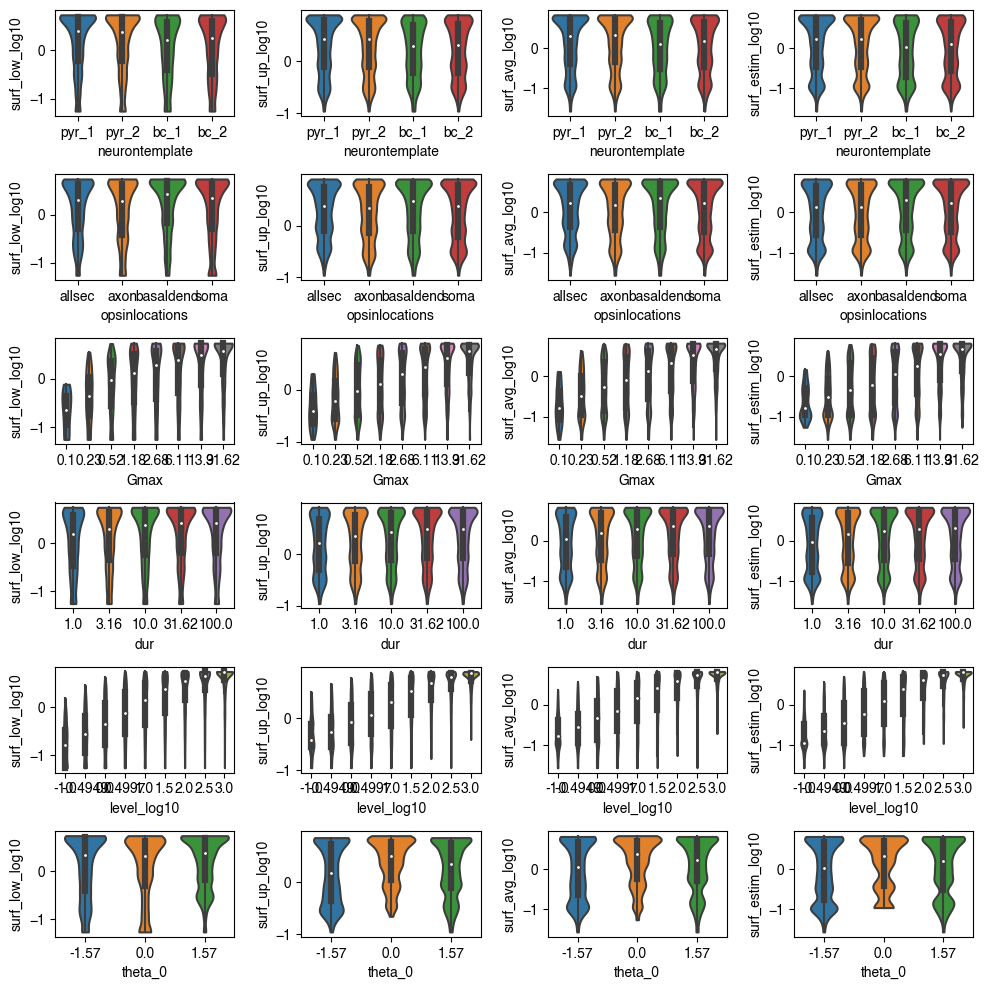

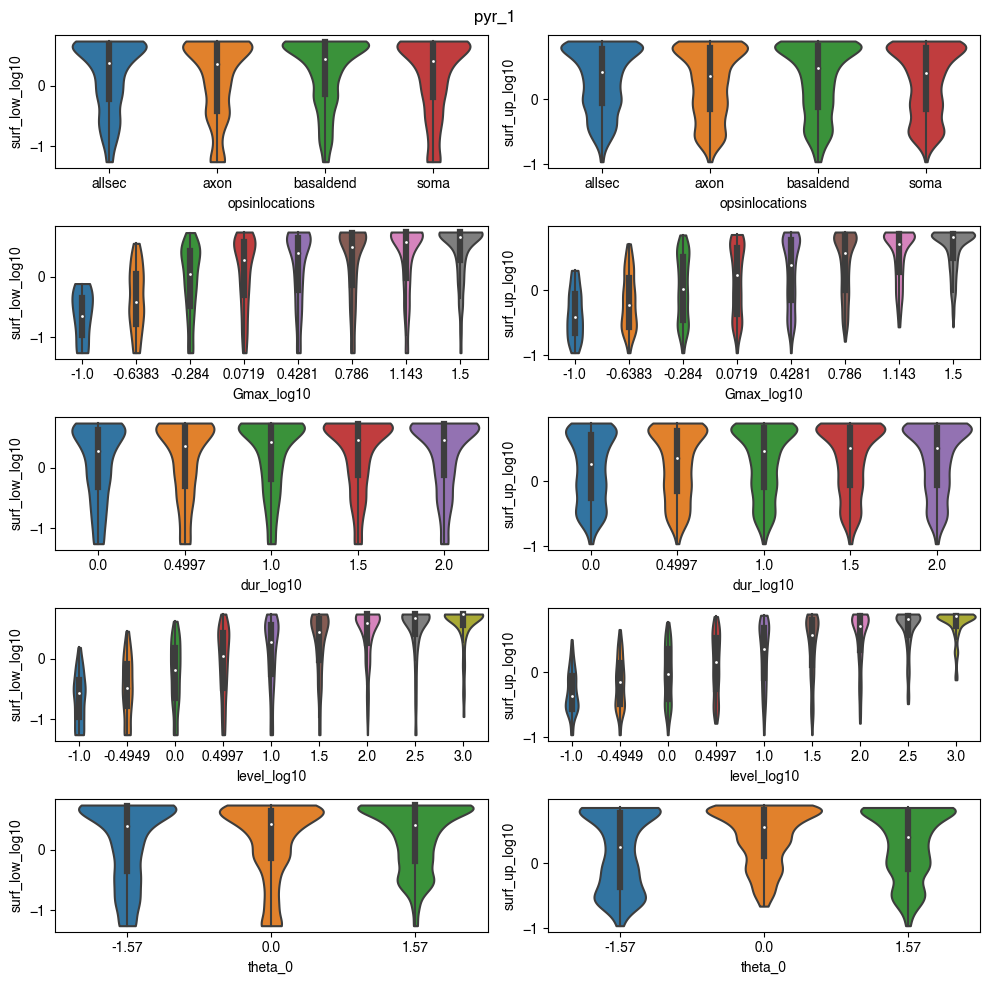

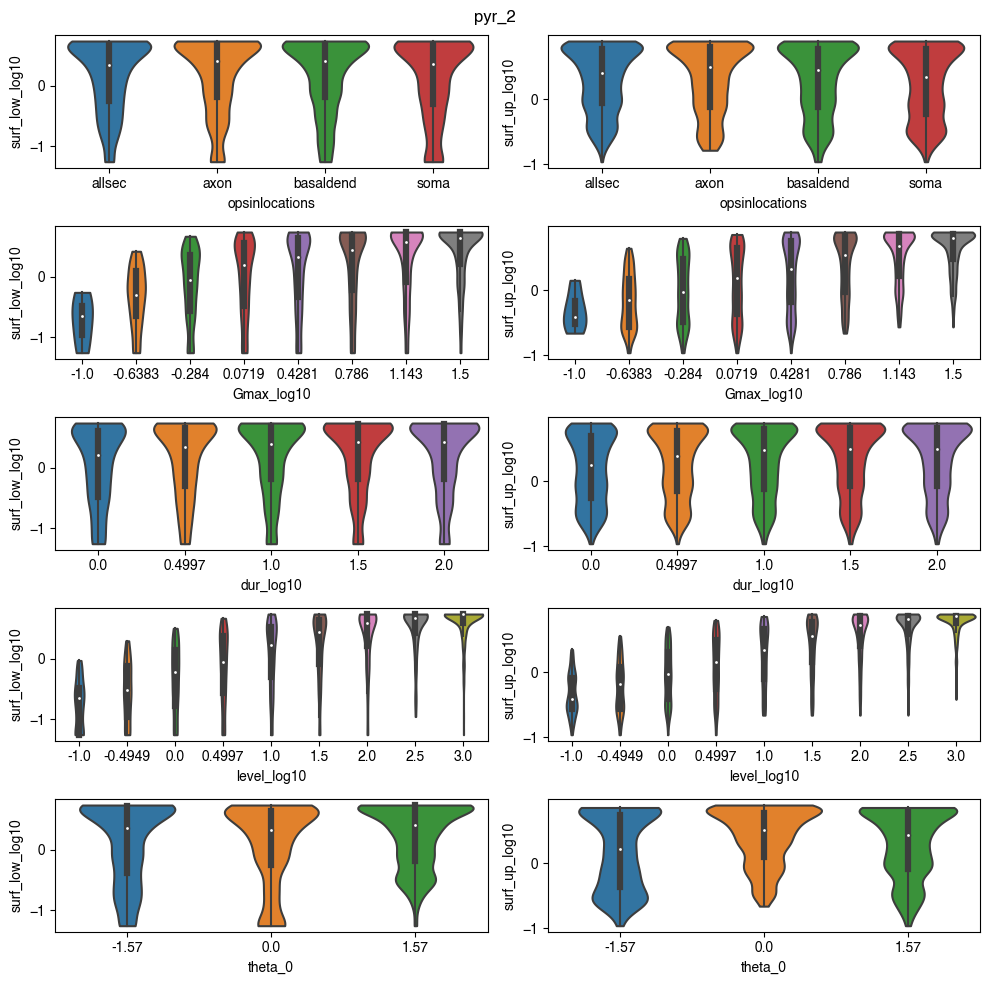

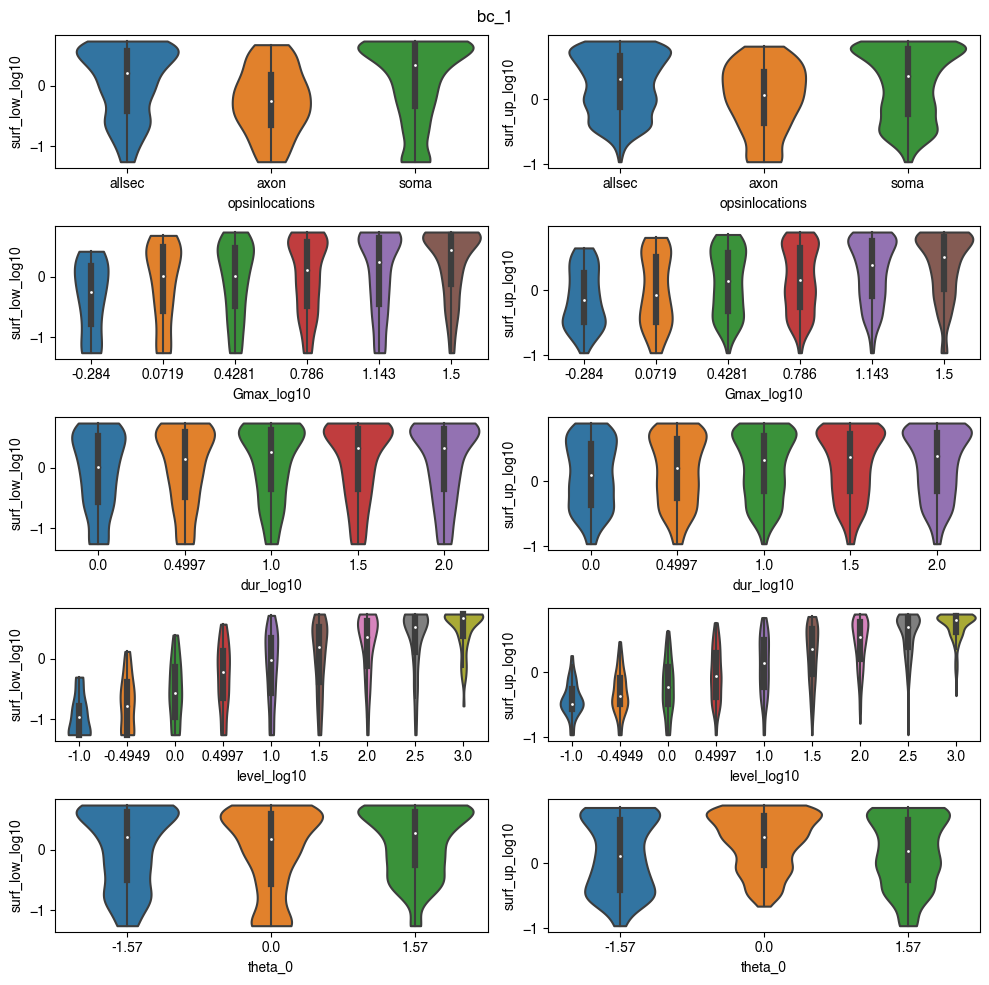

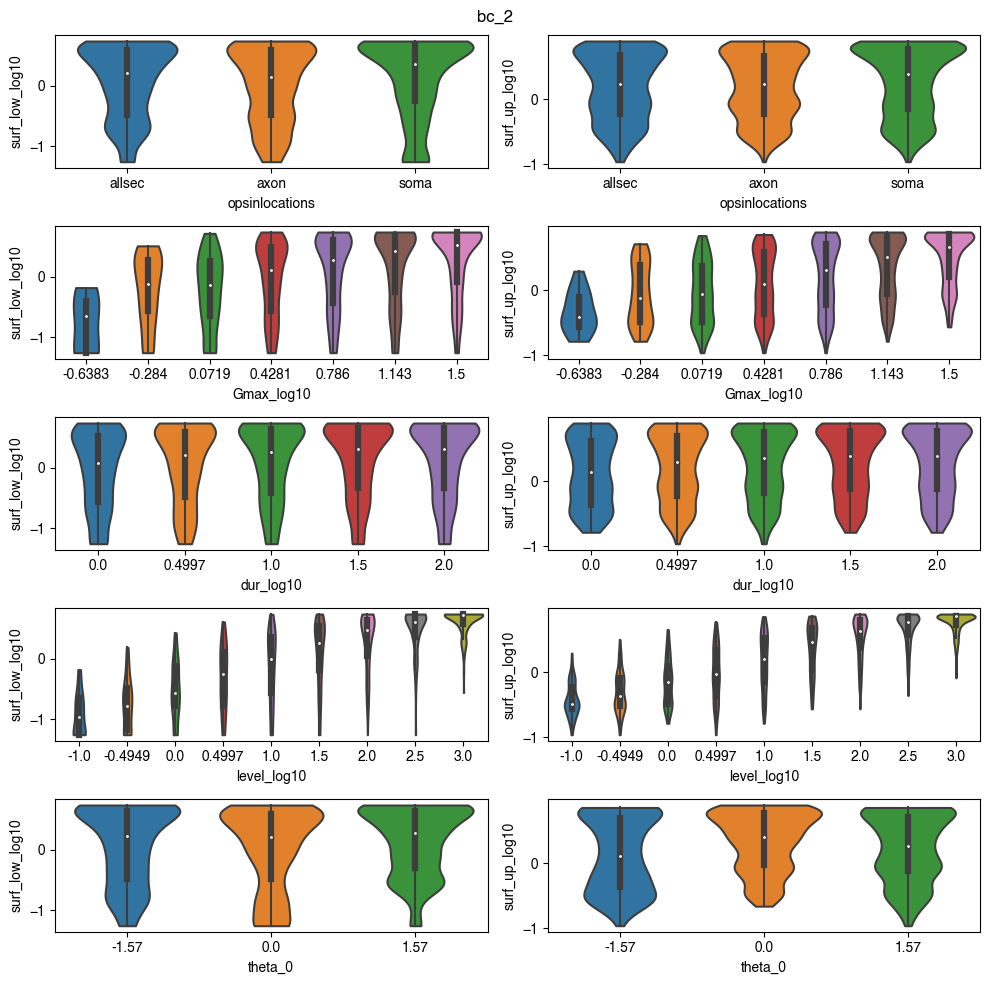

In [15]:
level = 100
fig,axs = plt.subplots(6,4,tight_layout = True,figsize=(10,10))
for i,pool in enumerate(['neurontemplate','opsinlocations','Gmax','dur','level_log10','theta_0']):
    for j,feat in enumerate(['surf_low_log10','surf_up_log10','surf_avg_log10','surf_estim_log10']):
        idx = ~(np.isinf(vta_df[feat])|np.isnan(vta_df[feat]))
        sns.violinplot(data=vta_df[idx],y=feat,x=pool,ax=axs[i,j],cut=0)

for nt in unique_values_columns_vta['neurontemplate']:
    idx_nt = vta_df['neurontemplate']==nt
    fig,axs = plt.subplots(5,2,tight_layout = True,figsize=(10,10))
    for i,pool in enumerate(['opsinlocations','Gmax_log10','dur_log10','level_log10','theta_0']):
        for j,feat in enumerate(['surf_low_log10','surf_up_log10']):
            idx = ~(np.isinf(vta_df[feat])|np.isnan(vta_df[feat])) & idx_nt
            sns.violinplot(data=vta_df[idx],y=feat,x=pool,ax=axs[i,j],cut=0)
    fig.suptitle(nt)


{'surf_avg': {'all': {'neurontemplate': (98.79646347233125, 2.8200855194809146e-21), 'opsinlocations': (85.68112673735182, 1.8532977983434292e-18), 'Gmax': (3071.81599436725, 0.0), 'dur': (174.3595680877823, 1.2124668882344417e-36), 'theta_0': (64.69321259349358, 8.954624458916305e-15), 'level': (6460.260084768903, 0.0)}}, 'surf_low': {'all': {'neurontemplate': (112.33701086589906, 3.4462372996292806e-24), 'opsinlocations': (75.77126508112129, 2.476244055923897e-16), 'Gmax': (2828.3746857130523, 0.0), 'dur': (174.22047384527025, 1.2987667338985887e-36), 'theta_0': (42.06943142301266, 7.323843206716869e-10), 'level': (6304.7570723878225, 0.0)}}, 'surf_up': {'all': {'neurontemplate': (89.65416265197166, 2.5991825372462887e-19), 'opsinlocations': (82.25048802379673, 1.009787106182332e-17), 'Gmax': (3072.8921412064747, 0.0), 'dur': (173.03311975990607, 2.3357464038108965e-36), 'theta_0': (119.63179106575731, 1.0526564114286731e-26), 'level': (6447.434562925848, 0.0)}}}


Text(0.5, 1.0, 'Kruskal Wallis')

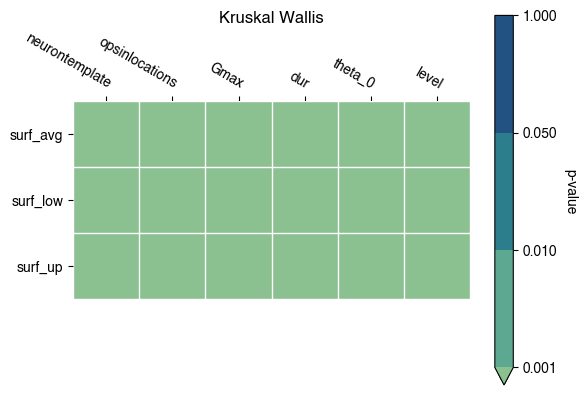

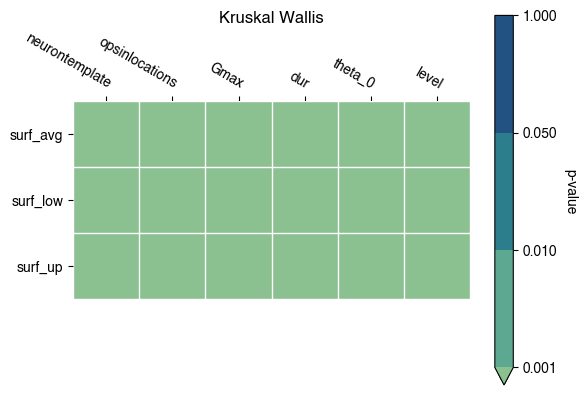

In [16]:
#colors = np.array([[189,0,38],[166,217,106],[102,189,99],[26,152,80]])/256
#colors = np.flipud(colors)
#hcolors = ['06492F','1F734E','3FA070','64CF94','8FFEBB','fdae61']
#hcolors = hcolors[1:-2]+hcolors[-1:]
#colors = np.array([tuple(int(h[i:i+2], 16) for i in (0, 2, 4)) for h in hcolors])/256
# counts = len(hcolors)*[100]
#fig, ax = plt.subplots()
# ax.bar(hcolors, counts, color=colors)
colors = np.array(sns.color_palette("crest", n_colors=10))
colors = colors[[0,2,5,8],:]
cmap = LinearSegmentedColormap.from_list('my_cmap', colors, N=colors.shape[0])
boundaries  = [0.001,0.01,0.05,1.0]
boundnorm = mpl.cm.colors.BoundaryNorm(boundaries,len(boundaries),extend='min')




KW_dict = {}
features = ['surf_avg', 'surf_low','surf_up']
classes = ['neurontemplate','opsinlocations','Gmax','dur','theta_0','level']
for feat in features:
    KW_dict[feat] = {'all':{}}
    for pool in classes:
        intm_df=vta_df[~(np.isinf(vta_df[feat])|np.isnan(vta_df[feat]))]
        pooledData = [list(intm_df[feat][intm_df[pool]==ukey]) for ukey in unique_values_columns_vta[pool]]
        KW_dict[feat]['all'][pool] = stats.kruskal(*pooledData,nan_policy='omit')[:]
print(KW_dict)

heatmapdata = np.zeros((len(features),len(classes)))
for ifeat,feat in enumerate(features):
    for ipool,pool in enumerate(classes):
        heatmapdata[ifeat,ipool] = KW_dict[feat]['all'][pool][1]

fig,ax= plt.subplots(1,1)
heatmap(heatmapdata,features,classes,ax=ax,norm=boundnorm,cmap=cmap,cbarlabel='p-value')
ax.set_title('Kruskal Wallis')

## Limite surf
KW_dict = {}
for feat in features:
    KW_dict[feat] = {'all':{}}
    for pool in classes:
        intm_df=vta_limit_df[~(np.isinf(vta_df[feat])|np.isnan(vta_df[feat]))]
        pooledData = [list(intm_df[feat][intm_df[pool]==ukey]) for ukey in unique_values_columns_vta[pool]]
        KW_dict[feat]['all'][pool] = stats.kruskal(*pooledData,nan_policy='omit')[:]

heatmapdata = np.zeros((len(features),len(classes)))
for ifeat,feat in enumerate(features):
    for ipool,pool in enumerate(classes):
        heatmapdata[ifeat,ipool] = KW_dict[feat]['all'][pool][1]

fig,ax= plt.subplots(1,1)
heatmap(heatmapdata,features,classes,ax=ax,norm=boundnorm,cmap=cmap,cbarlabel='p-value')
ax.set_title('Kruskal Wallis')

Text(0.5, 0.98, 'row greater than column')

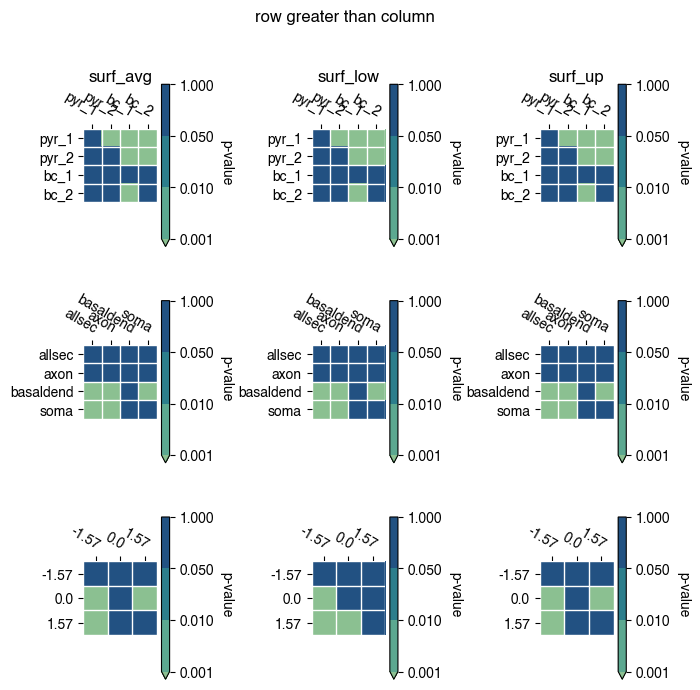

In [17]:
WSRT_dict = {}
classes_toplot = ['neurontemplate','opsinlocations','theta_0']
classes = ['neurontemplate','opsinlocations','Gmax','dur','theta_0','level']
for feat in features:
    WSRT_dict[feat] = {'all':{}}
    for pool in classes_toplot:
        ukeys =  unique_values_columns_vta[pool]
        mytest_WSRT = np.ones((len(ukeys),len(ukeys),len(features)))
        for i in range(len(ukeys)):
            for j in range(len(ukeys)):

                df1 = vta_df[vta_df[pool]==ukeys[i]]
                df2 = vta_df[vta_df[pool]==ukeys[j]]
                df1 = df1.set_index([x for x in classes if not (pool in x or x in pool)])[feat]
                df2 = df2.set_index([x for x in classes if not (pool in x or x in pool)])[feat]
                diff_df = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=('_0', '_1'),validate='one_to_many')
                diff_df = diff_df[feat+'_1']-diff_df[feat+'_0']
                xydiff = np.array(diff_df)
                xydiff = xydiff[~(np.isnan(xydiff)|np.isinf(xydiff))]
                if  len(xydiff)>0 and i!=j:
                    wstats = stats.wilcoxon(xydiff,alternative='less')
                    mytest_WSRT[i,j,0] = wstats[0]
                    mytest_WSRT[i,j,1] = wstats[1]
        WSRT_dict[feat]['all'][pool] = mytest_WSRT

fig,axs = plt.subplots(len(classes_toplot),len(features),tight_layout=True,figsize=(7,7))
for pool,ax in zip(classes_toplot,axs):
    ukeys =  unique_values_columns_vta[pool]
    for ifeat,feat in enumerate(features):
        im,_ = heatmap(WSRT_dict[feat]['all'][pool][:,:,1], ukeys, ukeys, ax=ax[ifeat], norm=boundnorm,cmap=cmap,cbarlabel='p-value')
        if pool==classes[0]:
            ax[ifeat].set_title(feat)
fig.suptitle('row greater than column')

## Limited surf to axial symm simulation domain

Text(0.5, 0.98, 'row greater than column')

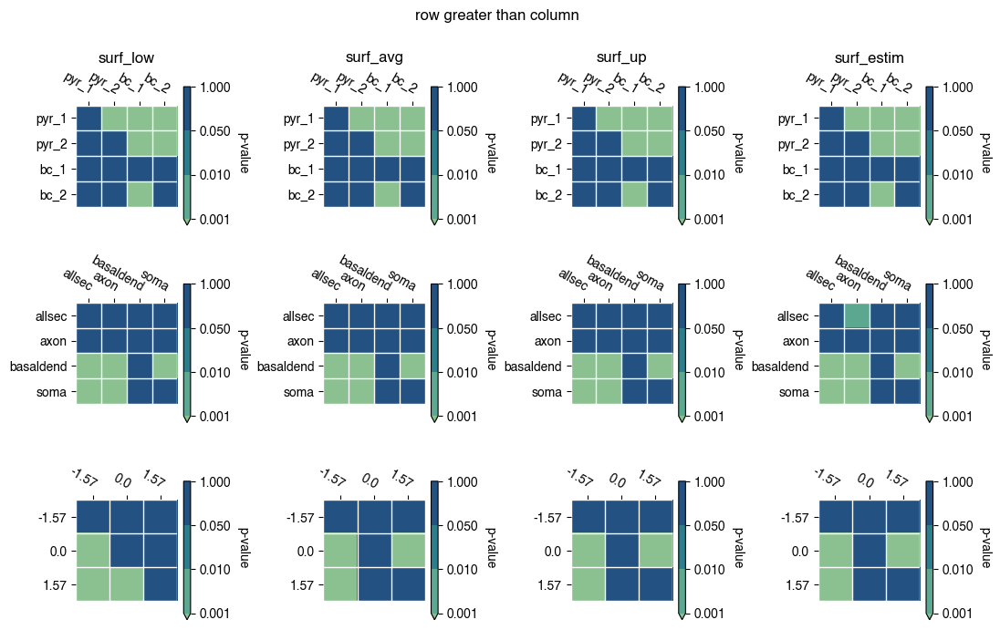

In [18]:
WSRT_dict = {}
classes_toplot = ['neurontemplate','opsinlocations','theta_0']
classes = ['neurontemplate','opsinlocations','Gmax','dur','theta_0','level']
features = ['surf_low','surf_avg','surf_up','surf_estim']
for feat in features:
    WSRT_dict[feat] = {'all':{}}
    for pool in classes_toplot:
        ukeys =  unique_values_columns_vta[pool]
        mytest_WSRT = np.ones((len(ukeys),len(ukeys),2))
        for i in range(len(ukeys)):
            for j in range(len(ukeys)):

                df1 = vta_limit_df[vta_limit_df[pool]==ukeys[i]]
                df2 = vta_limit_df[vta_limit_df[pool]==ukeys[j]]
                df1 = df1.set_index([x for x in classes if not (pool in x or x in pool)])[feat]
                df2 = df2.set_index([x for x in classes if not (pool in x or x in pool)])[feat]
                diff_df = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=('_0', '_1'),validate='one_to_many')
                diff_df = diff_df[feat+'_1']-diff_df[feat+'_0']
                xydiff = np.array(diff_df)
                xydiff = xydiff[~(np.isnan(xydiff)|np.isinf(xydiff))]
                if  len(xydiff)>0 and i!=j:
                    wstats = stats.wilcoxon(xydiff,alternative='less')
                    mytest_WSRT[i,j,0] = wstats[0]
                    mytest_WSRT[i,j,1] = wstats[1]
        WSRT_dict[feat]['all'][pool] = mytest_WSRT

fig,axs = plt.subplots(len(classes_toplot),4,tight_layout=True,figsize=(11,7))
for pool,ax in zip(classes_toplot,axs):
    ukeys =  unique_values_columns_vta[pool]
    for ifeat,feat in enumerate(features):
        im,_ = heatmap(WSRT_dict[feat]['all'][pool][:,:,1], ukeys, ukeys, ax=ax[ifeat], norm=boundnorm,cmap=cmap,cbarlabel='p-value')
        if pool==classes[0]:
            ax[ifeat].set_title(feat)
fig.suptitle('row greater than column')

['allsec1_-2' 'allsec1_0' 'allsec1_2' 'axon1_-2' 'axon1_0' 'axon1_2'
 'basaldend1_-2' 'basaldend1_0' 'basaldend1_2' 'soma1_-2' 'soma1_0'
 'soma1_2' 'allsec2_-2' 'allsec2_0' 'allsec2_2' 'axon2_-2' 'axon2_0'
 'axon2_2' 'basaldend2_-2' 'basaldend2_0' 'basaldend2_2' 'soma2_-2'
 'soma2_0' 'soma2_2']


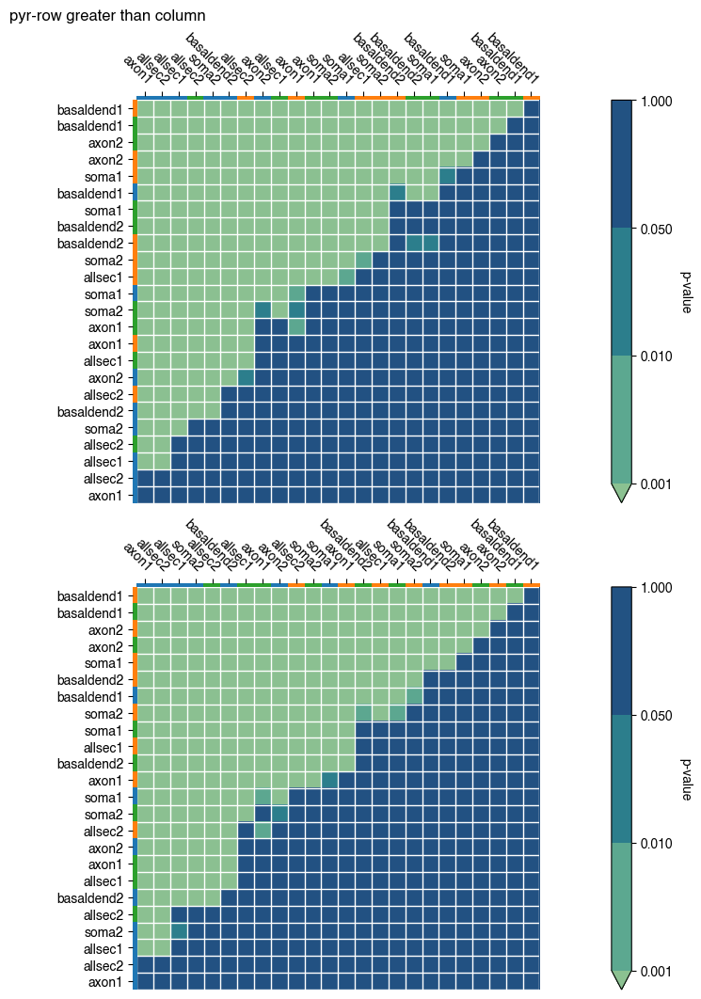

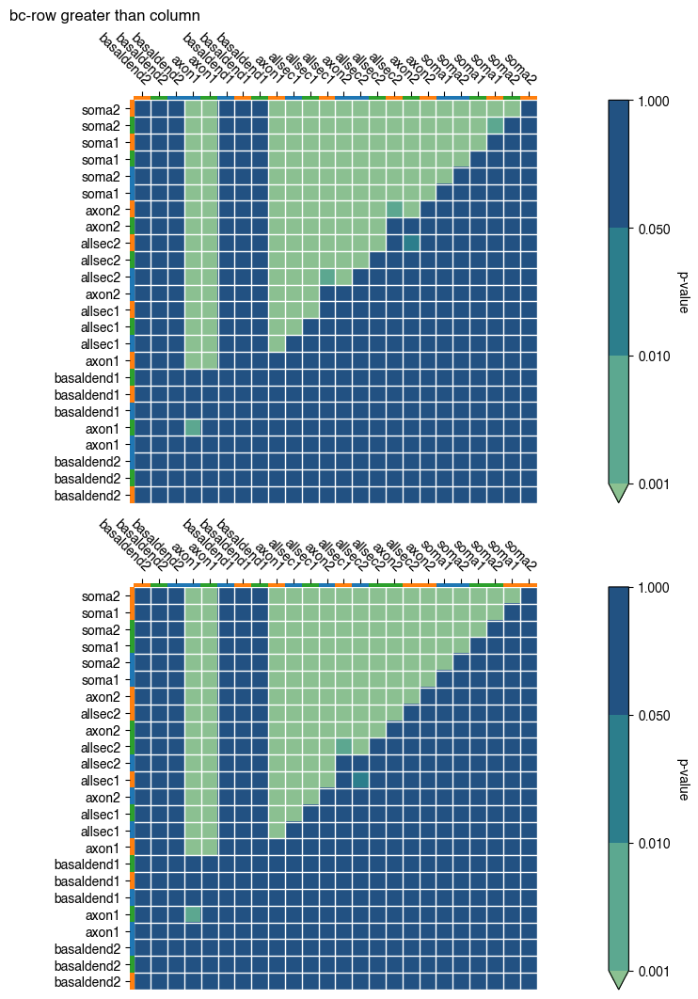

In [19]:
# limit surface is used to equalize comparison between pitch 0 and pitch +- pi/2
colors = np.array(sns.color_palette("crest", n_colors=10))
colors = colors[[0,2,5,8],:]
cmap = LinearSegmentedColormap.from_list('my_cmap', colors, N=colors.shape[0])
boundaries  = [0.001,0.01,0.05,1.0]
boundnorm = mpl.cm.colors.BoundaryNorm(boundaries,len(boundaries),extend='min')
features = ['surf_avg','surf_up']
classes = ['opsinlocations','Gmax','dur','theta_0','level','celltype','number']
wsrt_df = vta_limit_df[features+classes].copy()
wsrt_df['wsrt_keys'] = wsrt_df.apply(lambda x: f"{x['opsinlocations']}{x['number']}_{x['theta_0']:0.0f}",axis=1)
print(wsrt_df['wsrt_keys'].unique())
cvrt_label = {'allsec':'all', 'alldend':'dend', 'soma':'soma', 'axon':'axon', 'basaldend':'basal', 'apic':'apic'}


ukeys =  wsrt_df['wsrt_keys'].unique()
for cellt in wsrt_df['celltype'].unique()[:]:
    intm_df = wsrt_df[wsrt_df['celltype']==cellt]
    for feat in features:
        WSRT_dict[feat][cellt] = {}
        mytest_WSRT = np.ones((len(ukeys),len(ukeys),2))
        for i in range(len(ukeys)):
            for j in range(len(ukeys)):
                df1 = intm_df[intm_df['wsrt_keys']==ukeys[i]]
                df2 = intm_df[intm_df['wsrt_keys']==ukeys[j]]
                df1 = df1.set_index([x for x in ['Gmax','dur','level']])[feat]
                df2 = df2.set_index([x for x in ['Gmax','dur','level']])[feat]
                diff_df = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=('_0', '_1'),validate='one_to_many')
                diff_df = diff_df[feat+'_0']-diff_df[feat+'_1']
                xydiff = np.array(diff_df)
                xydiff = xydiff[~(np.isnan(xydiff)|np.isinf(xydiff))]
                if  len(xydiff)>0 and i!=j:
                    wstats = stats.wilcoxon(xydiff,alternative='greater')
                    mytest_WSRT[i,j,0] = wstats[0]
                    mytest_WSRT[i,j,1] = wstats[1]
        WSRT_dict[feat][cellt] = mytest_WSRT


row_colors = sns.color_palette("tab10")
row_colors_dict = {ol:clr for ol,clr in zip(wsrt_df['theta_0'].unique(),row_colors)}
# row_colors = np.tile(np.array([[1,0,0,0.99],[0,1,0,0.99]]),(int(len(ukeys)/2),1))[:,None,:]
for cellt in wsrt_df['celltype'].unique()[:]:
    fig,axs = plt.subplots(2,1,tight_layout=True,figsize=(13*1.2,9*1.2))
    for ifeat, (feat, ax) in enumerate(zip(features,axs)):
        greatest = np.sum(WSRT_dict[feat][cellt][:,:,1]<0.001,axis=1)
        idx_column = np.argsort(greatest)
        idx_row = np.flip(idx_column)
        row_labels = ukeys[idx_row]
        column_labels = ukeys[idx_column]
        row_colors = np.array([i for x in row_labels for k,i in row_colors_dict.items() if f'_{k:0.0f}' in x])[:,None,:]
        column_colors = np.array([i for x in column_labels for k,i in row_colors_dict.items() if f'_{k:0.0f}' in x])[None,:,:]
        row_labels = [x.rsplit('_',1)[0] for x in row_labels]
        column_labels = [x.rsplit('_',1)[0] for x in column_labels]

        data_toplot = WSRT_dict[feat][cellt][:,idx_column,1]
        im,_ = heatmap2(data_toplot[idx_row,:], row_labels, column_labels, ax=ax, row_colors=row_colors, column_colors=column_colors, norm=boundnorm,cmap=cmap,cbarlabel='p-value')
        if pool==classes[0]:
            ax[ifeat].set_title(feat)
    fig.suptitle(f'{cellt}-row greater than column')


In [20]:
# limit surface is used to equalize comparison between pitch 0 and pitch +- pi/2
colors = np.array(sns.color_palette("crest", n_colors=10))
colors = colors[[0,2,5,8],:]
cmap = LinearSegmentedColormap.from_list('my_cmap', colors, N=colors.shape[0])
boundaries  = [0.001,0.01,0.05,1.0]
boundnorm = mpl.cm.colors.BoundaryNorm(boundaries,len(boundaries),extend='min')
features = ['surf_low','surf_up','surf_avg']
classes = ['opsinlocations','Gmax','dur','theta_0','level','neurontemplate']
wsrt_df = vta_limit_df[features+classes].copy()
wsrt_df['wsrt_keys'] = wsrt_df.apply(lambda x: f"{x['opsinlocations']}_{x['neurontemplate']}_{x['theta_0']:0.0f}",axis=1)
print(wsrt_df['wsrt_keys'].unique())
cvrt_label = {'allsec':'all', 'alldend':'dend', 'soma':'soma', 'axon':'axon', 'basaldend':'basal', 'apic':'apic'}


ukeys =  wsrt_df['wsrt_keys'].unique()
WSRT_dict = {}
for feat in features:
    WSRT_dict[feat] = {}
    mytest_WSRT = np.ones((len(ukeys),len(ukeys),2))
    for i in range(len(ukeys)):
        for j in range(len(ukeys)):
            df1 = wsrt_df[wsrt_df['wsrt_keys']==ukeys[i]]
            df2 = wsrt_df[wsrt_df['wsrt_keys']==ukeys[j]]
            df1 = df1.set_index([x for x in ['Gmax','dur','level']])[feat]
            df2 = df2.set_index([x for x in ['Gmax','dur','level']])[feat]
            diff_df = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=('_0', '_1'),validate='one_to_many')
            diff_df = diff_df[feat+'_0']-diff_df[feat+'_1']
            xydiff = np.array(diff_df)
            xydiff = xydiff[~(np.isnan(xydiff)|np.isinf(xydiff))]
            if  len(xydiff)>0 and i!=j:
                wstats = stats.wilcoxon(xydiff,alternative='greater')
                mytest_WSRT[i,j,0] = wstats[0]
                mytest_WSRT[i,j,1] = wstats[1]
    WSRT_dict[feat] = mytest_WSRT



['allsec_pyr_1_-2' 'allsec_pyr_1_0' 'allsec_pyr_1_2' 'axon_pyr_1_-2'
 'axon_pyr_1_0' 'axon_pyr_1_2' 'basaldend_pyr_1_-2' 'basaldend_pyr_1_0'
 'basaldend_pyr_1_2' 'soma_pyr_1_-2' 'soma_pyr_1_0' 'soma_pyr_1_2'
 'allsec_pyr_2_-2' 'allsec_pyr_2_0' 'allsec_pyr_2_2' 'axon_pyr_2_-2'
 'axon_pyr_2_0' 'axon_pyr_2_2' 'basaldend_pyr_2_-2' 'basaldend_pyr_2_0'
 'basaldend_pyr_2_2' 'soma_pyr_2_-2' 'soma_pyr_2_0' 'soma_pyr_2_2'
 'allsec_bc_1_-2' 'allsec_bc_1_0' 'allsec_bc_1_2' 'axon_bc_1_-2'
 'axon_bc_1_0' 'axon_bc_1_2' 'soma_bc_1_-2' 'soma_bc_1_0' 'soma_bc_1_2'
 'allsec_bc_2_-2' 'allsec_bc_2_0' 'allsec_bc_2_2' 'axon_bc_2_-2'
 'axon_bc_2_0' 'axon_bc_2_2' 'soma_bc_2_-2' 'soma_bc_2_0' 'soma_bc_2_2']


In [21]:
WSRT_score = {}
for feat in features:
    WSRT_score[feat] = {}
    idx = -1
    score = np.sum(WSRT_dict[feat][:,:,1]<0.001,axis=1)\
        + 0.1*np.sum((WSRT_dict[feat][:,:,1]>=0.001) & (WSRT_dict[feat][:,:,1]<0.01),axis=1)\
        + 0.01*np.sum((WSRT_dict[feat][:,:,1]>=0.01) & (WSRT_dict[feat][:,:,1]<0.05),axis=1)
    for uk,scr in zip(ukeys, score):
        idx+=1
        suk =  uk.split('_')
        WSRT_score[feat][idx] = {'opsinlocations':suk[0], 'neurontemplate': f"{suk[1]}_{suk[2]}", 'theta_0': suk[-1], 'score':scr}
WSRT_surf_avg_df = pd.DataFrame.from_dict(WSRT_score['surf_avg'], orient='index')
WSRT_surf_avg_df.sort_values('score')

table = pd.pivot_table(WSRT_surf_avg_df, values='score', index=['neurontemplate', 'opsinlocations'],columns=['theta_0'], aggfunc=np.sum)
table

theta_0                           -2      0      2
neurontemplate opsinlocations                     
bc_1           allsec           3.00   5.00   4.00
               axon             0.00   2.00   0.10
               soma            12.00  20.00  16.00
bc_2           allsec           6.10   9.01   8.00
               axon             5.00  10.10   9.00
               soma            15.00  27.20  21.10
pyr_1          allsec          17.00  30.10  24.00
               axon            12.00  23.01  24.10
               basaldend       35.01  41.00  40.00
               soma            26.10  36.01  33.00
pyr_2          allsec          12.00  20.01  17.00
               axon            21.02  38.00  39.00
               basaldend       20.00  33.02  33.00
               soma            18.00  31.10  25.02

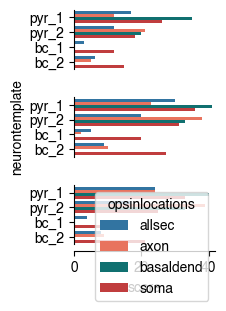

In [22]:

fig,axs = plt.subplots(3,1,tight_layout=True,figsize=(6/2.54,8/2.54))
WSRT_surf_avg_df['neurontemplate'].astype('category')
WSRT_surf_avg_df['opsinlocations'].astype('category')
WSRT_surf_avg_df['theta_0'].astype('category')
for pitch,ax in zip(WSRT_surf_avg_df['theta_0'].unique(),axs):
    idx=WSRT_surf_avg_df['theta_0'] == pitch
    sns.barplot(data=WSRT_surf_avg_df[idx], x="score", y="neurontemplate", hue="opsinlocations", palette=colorkeyval,ax=ax)
    

for ax in axs[0:2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_xticks([])
    ax.set_xlabel('')
    ax.get_legend().remove()
    ax.set_xlim([0,42])
axs[-1].spines['top'].set_visible(False)
axs[-1].spines['right'].set_visible(False)
axs[-1].spines['bottom'].set_position(('outward', 5))
axs[0].set_ylabel('')
axs[-1].set_ylabel('')
fig.savefig('wsrt_cat_vol_avg.svg')

# estim vs calculated

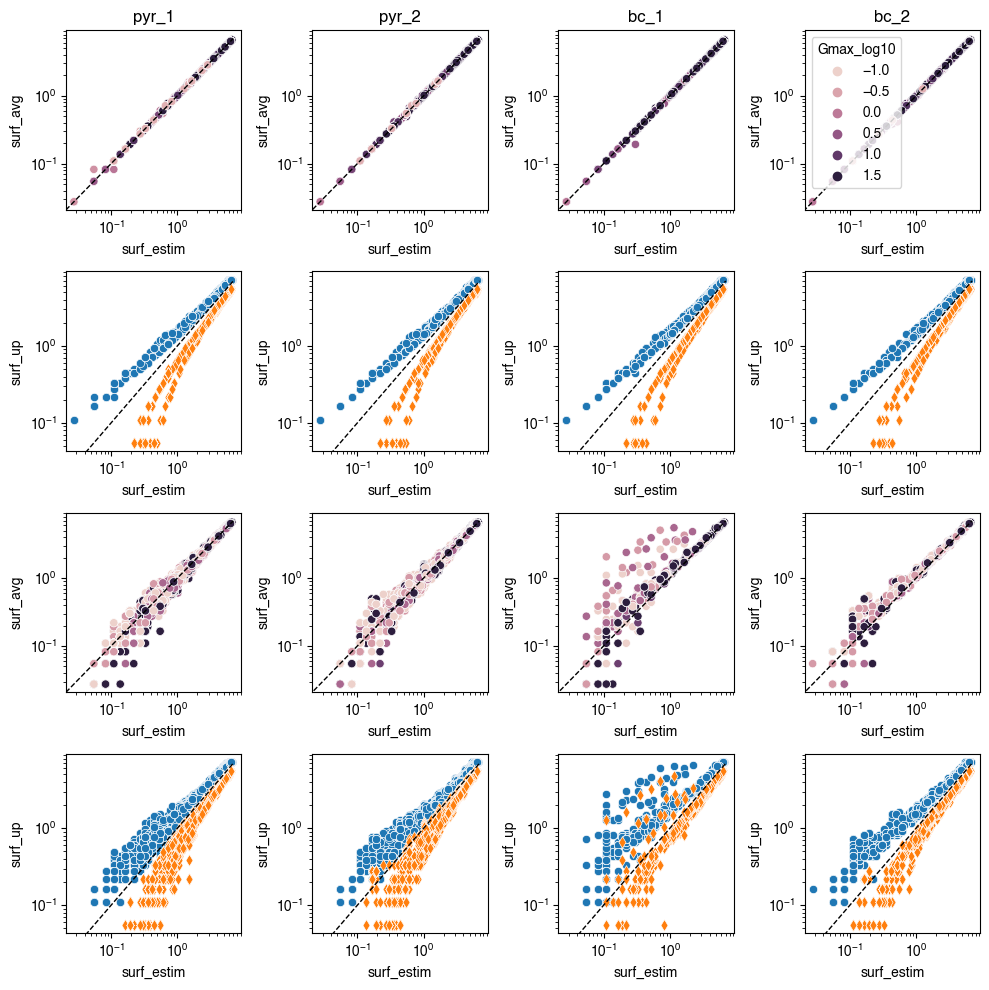

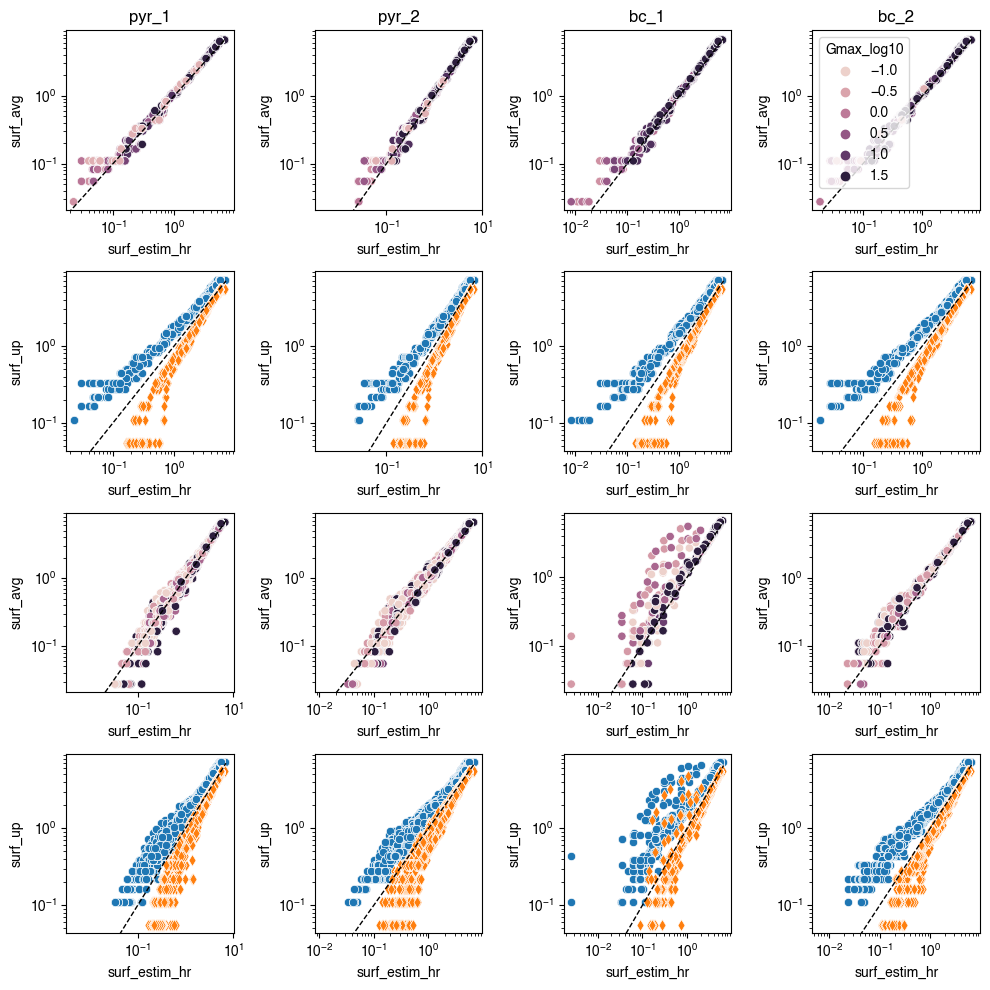

In [23]:
for estimfeat in ['surf_estim', 'surf_estim_hr']:
    nts = unique_values_columns_vta['neurontemplate']
    fig,axs = plt.subplots(4,len(nts),tight_layout = True,figsize=(10,10))
    for nt,iax in zip(nts,axs[0,:]):
        idx = (vta_limit_df['neurontemplate']==nt) & (vta_limit_df['opsinlocations']=='soma')
        intm_df = vta_limit_df[idx]
        sns.scatterplot(intm_df, x=estimfeat, y='surf_avg',hue='Gmax_log10',ax=iax,alpha=1)
        modify_plot(ax=iax)
        if nt != unique_values_columns_vta['neurontemplate'][-1]:
          iax.get_legend().remove()
        iax.set_title(nt)

    for nt,iax in zip(nts,axs[1,:]):
        idx = (vta_limit_df['neurontemplate']==nt) & (vta_limit_df['opsinlocations']=='soma')
        intm_df = vta_limit_df[idx]
        sns.scatterplot(intm_df, x=estimfeat, y='surf_up',ax=iax,alpha=1)
        sns.scatterplot(intm_df, x=estimfeat, y='surf_low',marker='d',ax=iax,alpha=1)
        modify_plot(ax=iax)

    for nt,iax in zip(nts,axs[-2,:]):
        idx = (vta_limit_df['neurontemplate']==nt) & (vta_limit_df['opsinlocations']!='soma')
        intm_df = vta_limit_df[idx]
        sns.scatterplot(intm_df, x=estimfeat, y='surf_avg',hue='dur_log10',ax=iax,alpha=1)
        modify_plot(ax=iax)
        iax.get_legend().remove()

    for nt,iax in zip(nts,axs[-1,:]):
        idx = (vta_limit_df['neurontemplate']==nt) & (vta_limit_df['opsinlocations']!='soma')
        intm_df = vta_limit_df[idx]
        sns.scatterplot(intm_df, x=estimfeat, y='surf_up',ax=iax,alpha=1)
        sns.scatterplot(intm_df, x=estimfeat, y='surf_low',marker='d',ax=iax,alpha=1)
        modify_plot(ax=iax)
    for ax in axs.ravel():
        ax.set_xscale('log')
        ax.set_yscale('log')



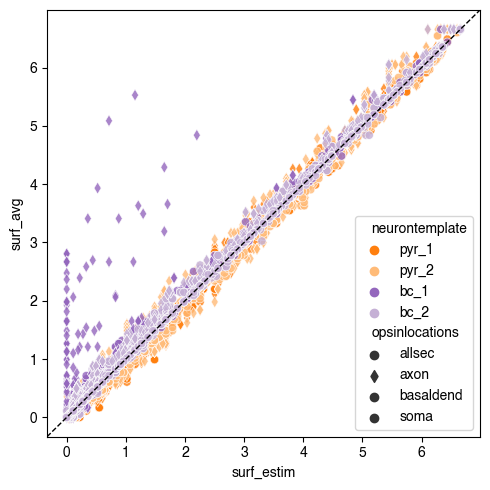

In [24]:
fig,axs = plt.subplots(1,1,tight_layout = True,figsize=(5,5))
for estimfeat in ['surf_estim']:
    sns.scatterplot(vta_limit_df, x=estimfeat, y='surf_avg',hue='neurontemplate', style='opsinlocations', markers={'soma':'o','allsec':'o','axon':'d','basaldend':'o'},ax=axs,alpha=0.8,palette=colorkeyval)
    modify_plot(ax=axs)


In [25]:
vta_limit_df['diff_avg_estim'] = vta_limit_df['surf_avg']-vta_limit_df['surf_estim']
vta_limit_df['reldiff_avg_estim'] = (vta_limit_df['surf_avg']-vta_limit_df['surf_estim'])/vta_limit_df['surf_avg']
vta_limit_df['reldiff_avg_estim_log10'] = np.log10(vta_limit_df['reldiff_avg_estim'])
vta_limit_df['diff_up_estim'] = vta_limit_df['surf_up']-vta_limit_df['surf_estim']
vta_limit_df['diff_low_estim'] = vta_limit_df['surf_low']-vta_limit_df['surf_estim']

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


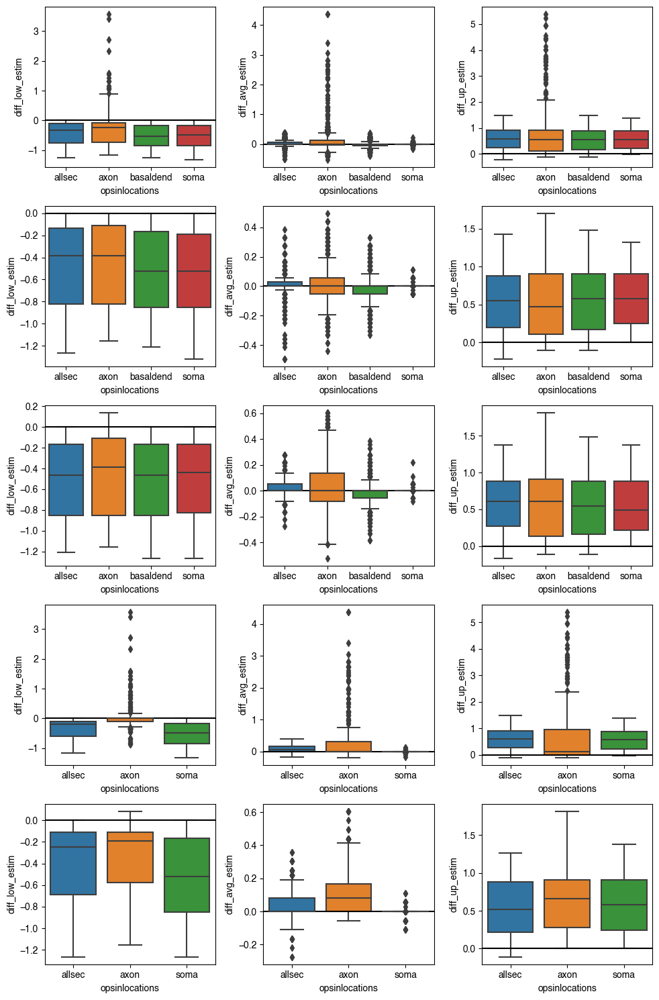

In [26]:
fig,axs = plt.subplots(5,3,tight_layout=True, figsize=(10,15))
sns.boxplot(vta_limit_df, x='opsinlocations', y='diff_low_estim', ax=axs[0, 0])
sns.boxplot(vta_limit_df, x='opsinlocations', y='diff_avg_estim', ax=axs[0,1])
sns.boxplot(vta_limit_df, x='opsinlocations', y='diff_up_estim', ax=axs[0,2])
axs[0, 0].axhline(0, color='k')
axs[0, 1].axhline(0, color='k')
axs[0, 2].axhline(0,color='k')


for i,nt in enumerate(vta_limit_df['neurontemplate'].unique()):
    i+=1
    idx = vta_limit_df['neurontemplate']==nt
    sns.boxplot(vta_limit_df[idx], x='opsinlocations', y='diff_low_estim', ax=axs[i, 0])
    sns.boxplot(vta_limit_df[idx], x='opsinlocations', y='diff_avg_estim', ax=axs[i,1])
    sns.boxplot(vta_limit_df[idx], x='opsinlocations', y='diff_up_estim', ax=axs[i,2])
    axs[i, 0].axhline(0, color='k')
    axs[i, 1].axhline(0, color='k')
    axs[i, 2].axhline(0,color='k')



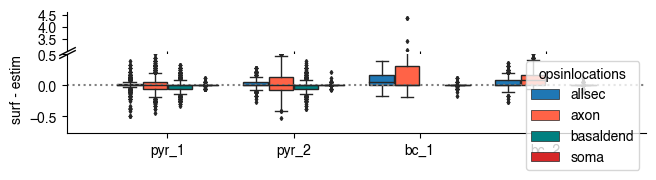

In [27]:


fig = plt.figure(figsize=(19/2.54,4/2.54))
fig, axtop, axbottom = broken_boxplot(vta_limit_df, yaxratio=2,fig=fig,break_points=[0.5,3],x='neurontemplate',y='diff_avg_estim',hue='opsinlocations',palette=colorkeyval,dodge=True,fliersize=2,linewidth=1,saturation=1)
axtop.spines['top'].set_visible(False)
axtop.spines['right'].set_visible(False)
axbottom.spines['top'].set_visible(False)
axbottom.spines['right'].set_visible(False)
axtop.set_yticks([3.5,4,4.5])
axtop.set_ylabel(None)
axtop.get_legend().remove()
axbottom.axhline([0], color='grey', linestyle=':')
axbottom.set_ylabel('surf - estim',loc='top')
axbottom.set_xlabel(None)
fig.savefig('diff_estim.svg',dpi=300)

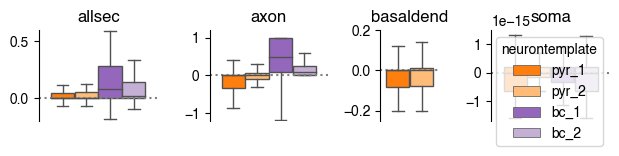

In [28]:
fig = plt.figure(figsize=(16/2.54,4/2.54), tight_layout=True)
axs=[]
gs = mpl.gridspec.GridSpec(1, 4, width_ratios=[2, 2, 1, 2])
for i in range(4):
    axs.append(fig.add_subplot(gs[i]))
ylims = [[-0.2,0.6],[-1.2,1.2],[-0.25,0.2],[-1.7e-15,1.5e-15]]
for ol, ax, yl in zip(unique_values_columns_vta['opsinlocations'], axs, ylims):
    idx = vta_limit_df['opsinlocations']==ol
    sns.boxplot(data=vta_limit_df[idx], x='opsinlocations',y='reldiff_avg_estim',hue='neurontemplate',palette=colorkeyval,dodge=True,showfliers=False,linewidth=1,saturation=1, ax=ax)
    ax.set_ylabel(None)
    ax.set_xticklabels([])
    ax.set_xlabel(None)
    ax.set_title(ol)
    ax.axhline([0], color='grey', linestyle=':')
    ax.set_xticks([])
    ax.set_ylim(yl)
# ax.set_ylim([-0.3,0.3])
    ax.spines[['top','right','bottom']].set_visible(False)
for ax in axs[:3]:
    ax.get_legend().remove()
fig.savefig('reldiffsurfestim.svg',dpi=300)

<AxesSubplot:xlabel='surf_avg_log10', ylabel='reldiff_avg_estim'>

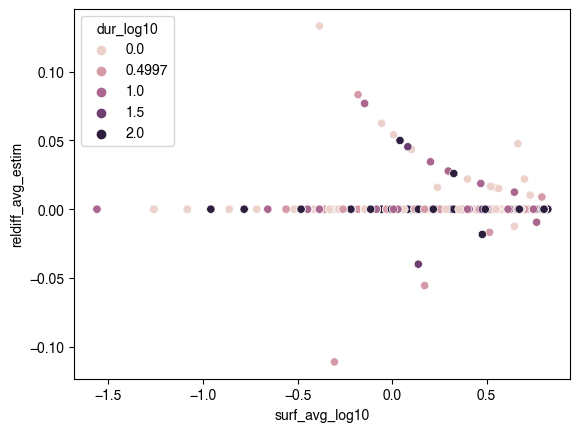

In [29]:
ntol = 'pyr_2_soma'
idx = (np.isnan(vta_limit_df['surf_avg']) & (vta_limit_df['surf_estim']==0))
intm_df = vta_limit_df.loc[(vta_limit_df['nt_ol']==ntol) & ~idx,['reldiff_avg_estim','level_log10','Gmax_log10','dur_log10','theta_0','surf_avg_log10']]
sns.scatterplot(intm_df, x='surf_avg_log10', y='reldiff_avg_estim',hue='dur_log10')

In [30]:
outliers_dict = {}
for ntol in vta_limit_df['nt_ol'].unique():
   idx = (np.isnan(vta_limit_df['surf_avg']) & (vta_limit_df['surf_estim']==0))
   intm_df = vta_limit_df.loc[(vta_limit_df['nt_ol']==ntol) & ~idx,'reldiff_avg_estim']
   outliers, IQR = find_outliers_IQR(intm_df)
   outliers_dict[ntol] = {'outlier_perc':len(outliers)/len(intm_df), '5percerror': sum(np.abs(intm_df)>0.05)/len(intm_df), 'mean': intm_df.mean(), 'median': intm_df.quantile(0.5), 'q3': intm_df.quantile(0.75),'q1': intm_df.quantile(0.25),'max':intm_df.max(), 'min': intm_df.min(), 'IQR': IQR }

outlier_df = pd.DataFrame(outliers_dict).T
outlier_df

,outlier_perc,5percerror,mean,median,q3,q1,max,min,IQR
pyr_1_allsec,0.283598,0.362963,-inf,0.000000e+00,4.878049e-02,-1.258340e-15,0.500000,-inf,4.878049e-02
pyr_1_axon,0.091005,0.550265,-inf,-1.258340e-15,1.913876e-02,-3.333333e-01,0.416667,-inf,3.524721e-01
pyr_1_basaldend,0.231481,0.378704,-inf,-1.258340e-15,1.117987e-15,-8.265027e-02,0.363636,-inf,8.265027e-02
pyr_1_soma,0.039153,0.010582,0.000367,0.000000e+00,1.872360e-16,-6.516530e-16,0.333333,-0.333333,8.388890e-16
pyr_2_allsec,0.258025,0.355556,-inf,0.000000e+00,5.064103e-02,-1.258340e-15,0.500000,-inf,5.064103e-02
pyr_2_axon,0.229358,0.530071,-inf,-1.258340e-15,7.152678e-02,-8.123711e-02,1.000000,-inf,1.527639e-01
pyr_2_basaldend,0.196825,0.410582,-inf,-1.258340e-15,1.015228e-02,-7.920792e-02,0.533333,-inf,8.936021e-02
pyr_2_soma,0.262434,0.009524,0.000789,0.000000e+00,1.888737e-16,-1.605791e-16,0.133333,-0.111111,3.494528e-16
bc_1_allsec,0.084656,0.594356,-inf,8.326118e-02,2.857143e-01,1.106075e-15,0.588235,-inf,2.857143e-01
bc_1_axon,0.066667,0.580247,-inf,5.000000e-01,1.000000e+00,8.247423e-02,1.000000,-inf,9.175258e-01


In [31]:
outliers_dict = {}
for ntol in vta_limit_df['nt_ol'].unique():
   idx = (np.isnan(vta_limit_df['surf_avg']) & (vta_limit_df['surf_estim']==0))
   intm_df = vta_limit_df.loc[(vta_limit_df['nt_ol']==ntol) & ~idx,'diff_avg_estim']
   outliers, IQR = find_outliers_IQR(intm_df)
   outliers_dict[ntol] = {'outlier_perc':len(outliers)/len(intm_df), 'mean': intm_df.mean(), 'median': intm_df.quantile(0.5), 'q3': intm_df.quantile(0.75),'q1': intm_df.quantile(0.25),'max':intm_df.max(), 'min': intm_df.min(), 'IQR': IQR }

outlier_df = pd.DataFrame(outliers_dict).T
outlier_df

,outlier_perc,mean,median,q3,q1,max,min,IQR
pyr_1_allsec,0.298413,0.006693,0.000000e+00,2.750000e-02,-7.993606e-15,0.3850,-0.4950,2.750000e-02
pyr_1_axon,0.166138,-0.002939,-7.993606e-15,5.500000e-02,-5.500000e-02,0.4950,-0.4400,1.100000e-01
pyr_1_basaldend,0.230556,-0.014921,-7.993606e-15,0.000000e+00,-5.500000e-02,0.3300,-0.3300,5.500000e-02
pyr_1_soma,0.354497,0.000262,0.000000e+00,1.110223e-16,-8.881784e-16,0.1100,-0.0550,9.992007e-16
pyr_2_allsec,0.125926,0.017077,0.000000e+00,5.500000e-02,-7.993606e-15,0.2750,-0.2750,5.500000e-02
pyr_2_axon,0.048930,0.035013,-7.993606e-15,1.375000e-01,-8.250000e-02,0.6050,-0.5225,2.200000e-01
pyr_2_basaldend,0.216931,-0.010651,-7.993606e-15,3.996803e-15,-5.500000e-02,0.3850,-0.3850,5.500000e-02
pyr_2_soma,0.421164,0.001164,0.000000e+00,1.110223e-16,0.000000e+00,0.2200,-0.0825,1.110223e-16
bc_1_allsec,0.000000,0.091376,5.500000e-02,1.650000e-01,0.000000e+00,0.3850,-0.1650,1.650000e-01
bc_1_axon,0.140741,0.342290,0.000000e+00,3.025000e-01,0.000000e+00,4.3725,-0.1925,3.025000e-01


In [32]:
corr_dict = {}
idx_soma = vta_limit_df['opsinlocations']=='soma'
x = vta_limit_df.loc[idx_soma,'surf_estim']
y = vta_limit_df.loc[idx_soma,'surf_avg']
idx = ~ (np.isnan(x) |  np.isinf(x) | np.isnan(y) | np.isinf(y))
corr_dict['soma'] = stats.pearsonr(x[idx],y[idx])[0]

idx_notsoma = vta_limit_df['opsinlocations']!='soma'
x = vta_limit_df.loc[idx_notsoma,'surf_estim']
y = vta_limit_df.loc[idx_notsoma,'surf_avg']
idx = ~ (np.isnan(x) |  np.isinf(x) | np.isnan(y) | np.isinf(y))
corr_dict['notsoma'] = stats.pearsonr(x[idx],y[idx])[0]

corr_dict

{'soma': 0.9999860921949659, 'notsoma': 0.9958913476911261}

In [33]:
# percentage between surf up and low
estim_select = 'surf_estim_hr'
columns_OI = ['Gmax','dur','level','neurontemplate','opsinlocations','theta_0','surf_avg','surf_low', 'surf_up',estim_select]
dfOI = vta_df[columns_OI].copy()
dfOI['up-estim'] = dfOI['surf_up']-dfOI[estim_select]
dfOI['low-estim'] = dfOI['surf_low']-dfOI[estim_select]
dfOI['within_bounds'] = ((dfOI['up-estim']>=0) & (dfOI['low-estim']<=0)) | (np.isnan(dfOI['surf_up']) & np.isnan(dfOI['surf_low']) & (dfOI[estim_select]==0))
table = pd.pivot_table(dfOI, values='within_bounds', index=['neurontemplate', 'opsinlocations'],columns=['theta_0'], aggfunc=lambda x:np.round(np.sum(x)/np.size(x)*100))

print(table.describe())
table
# idx = (dfOI['opsinlocations']=='soma') & ~dfOI['within_bounds']
# dfOI.loc[idx]



theta_0       -1.57        0.00        1.57
count     14.000000   14.000000   14.000000
mean      97.642857   94.428571   95.642857
std        3.103525    4.200994    8.044177
min       89.000000   88.000000   69.000000
25%       97.250000   92.000000   94.750000
50%       99.000000   93.500000   98.500000
75%       99.750000   98.750000   99.750000
max      100.000000  100.000000  100.000000


theta_0                        -1.57   0.00   1.57
neurontemplate opsinlocations                     
bc_1           allsec           97.0   94.0   97.0
               axon             89.0   89.0   94.0
               soma             99.0   99.0  100.0
bc_2           allsec           99.0   96.0   99.0
               axon            100.0   98.0   98.0
               soma            100.0  100.0  100.0
pyr_1          allsec           95.0   88.0   94.0
               axon             94.0   92.0   93.0
               basaldend        99.0   90.0   99.0
               soma            100.0  100.0  100.0
pyr_2          allsec           98.0   92.0   97.0
               axon             98.0   92.0   69.0
               basaldend        99.0   93.0   99.0
               soma            100.0   99.0  100.0

In [34]:
# percentage over  vs under
estim_select = 'surf_estim'
columns_OI = ['Gmax','dur','level','neurontemplate','opsinlocations','theta_0','surf_avg','surf_low', 'surf_up',estim_select]
dfOI = vta_df[columns_OI].copy()
dfOI['underestim'] = ((dfOI['surf_avg']-dfOI[estim_select])/dfOI['surf_avg'])>=0.05
dfOI['overestim'] = ((dfOI['surf_avg']-dfOI[estim_select])/dfOI['surf_avg'])<=-0.05

idx = (np.isnan(dfOI['surf_up']) & np.isnan(dfOI['surf_low']) & (dfOI[estim_select]==0))
table = pd.pivot_table(dfOI[~idx], values=['underestim','overestim'], index=['neurontemplate', 'opsinlocations'],columns=['theta_0'], aggfunc=lambda x:np.round(np.sum(x)/np.size(x)*100))

idx = np.ones(len(dfOI)).astype(bool)#(dfOI['neurontemplate'] == 'pyr_1') & (dfOI['opsinlocations'] == 'axon')
print('under estimation:', np.round(sum(dfOI.loc[idx,'underestim'])/len(dfOI[idx])*100))
print('over estimation:', np.round(sum(dfOI.loc[idx,'overestim'])/len(dfOI[idx])*100))

print(table.describe())
table

under estimation: 15.0
over estimation: 10.0
         overestim                       underestim                      
theta_0      -1.57       0.00       1.57      -1.57       0.00       1.57
count    14.000000  14.000000  14.000000  14.000000  14.000000  14.000000
mean     18.142857  13.214286   5.428571  17.857143  17.857143  30.357143
std      21.636355  12.771233   5.018647  23.037952  17.922299  23.779782
min       0.000000   0.000000   0.000000   0.000000   0.000000   0.000000
25%       1.000000   0.250000   0.000000   0.000000   2.000000   6.000000
50%       9.000000  12.500000   6.500000   1.000000  13.500000  30.000000
75%      37.500000  19.750000   8.000000  36.250000  27.750000  51.250000
max      55.000000  43.000000  17.000000  60.000000  53.000000  66.000000


overestim             underestim            
theta_0                           -1.57  0.00  1.57      -1.57  0.00  1.57
neurontemplate opsinlocations                                             
bc_1           allsec               6.0  13.0   7.0       60.0  39.0  53.0
               axon                12.0  12.0   7.0       40.0  46.0  58.0
               soma                 1.0   0.0   0.0        0.0   0.0   0.0
bc_2           allsec               6.0  12.0   8.0       52.0  30.0  27.0
               axon                 0.0   1.0   0.0       48.0  53.0  66.0
               soma                 1.0   0.0   0.0        0.0   1.0   0.0
pyr_1          allsec              13.0  19.0  10.0       25.0  21.0  21.0
               axon                54.0  43.0  17.0        0.0   6.0  46.0
               basaldend           46.0  26.0   6.0        1.0   5.0  30.0
               soma                 0.0   0.0   0.0        1.0   1.0   0.0
pyr_2          allsec              15.0  14.0   5.0       23.0  20.0  30.0
               axon                55.0  20.0   8.0        0.0  17.0  59.0
               basaldend           45.0  25.0   8.0        0.0  10.0  34.0
               soma                 0.0   0.0   0.0        0.0   1.0   1.0

# VTA vs pd and Gmax

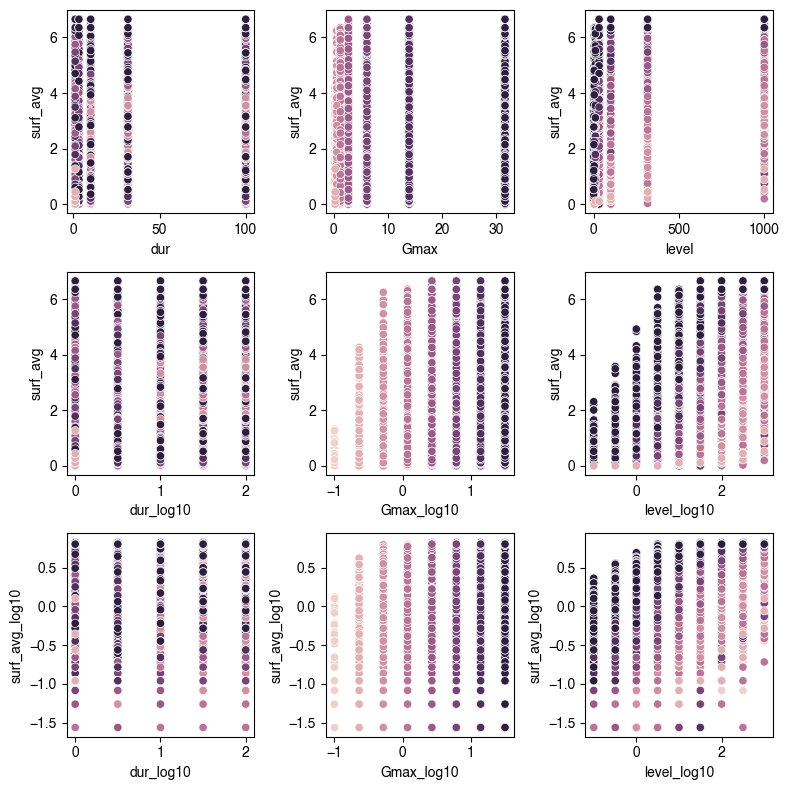

In [35]:
hue = 'Gmax_log10'
palette = None
fig, axs = plt.subplots(3,3, tight_layout=True, figsize=(8,8))
sns.scatterplot(vta_df,x='dur', y='surf_avg', hue = hue, palette=palette, ax=axs[0,0])
sns.scatterplot(vta_df,x='Gmax', y='surf_avg', hue = hue, palette=palette, ax=axs[0,1])
sns.scatterplot(vta_df,x='level', y='surf_avg', hue = hue, palette=palette, ax=axs[0,2])

sns.scatterplot(vta_df,x='dur_log10', y='surf_avg', hue = hue, palette=palette, ax=axs[1,0])
sns.scatterplot(vta_df,x='Gmax_log10', y='surf_avg', hue = hue, palette=palette, ax=axs[1,1])
sns.scatterplot(vta_df,x='level_log10', y='surf_avg', hue = hue, palette=palette, ax=axs[1,2])

sns.scatterplot(vta_df,x='dur_log10', y='surf_avg_log10', hue = hue, palette=palette, ax=axs[2,0])
sns.scatterplot(vta_df,x='Gmax_log10', y='surf_avg_log10', hue = hue, palette=palette, ax=axs[2,1])
sns.scatterplot(vta_df,x='level_log10', y='surf_avg_log10', hue = hue, palette=palette, ax=axs[2,2])

for ax in axs.ravel():
    ax.get_legend().remove()

In [36]:
vta_columns

Index(['vta_low', 'vta_up', 'surf_low', 'surf_up', 'b_opt_pos',
       'b_opt_pos_TAC', 'w_opt_pos_TAC', 'b_opt_pos_TACamp',
       'w_opt_pos_TACamp', 'dur', 'level', 'theta_0', 'neurontemplate', 'x_0',
       'y_0', 'z_0', 'Gmax', 'opsinlocations', 'theta', 'settings_str',
       'surf_avg', 'vta_low_log10', 'vta_up_log10', 'surf_low_log10',
       'surf_up_log10', 'dur_log10', 'Gmax_log10', 'level_log10', 'celltype',
       'number', 'surf_estim', 'surf_estim_hr', 'nt_ol', 'surf_estim_log10',
       'surf_estim_hr_log10', 'surf_avg_log10'],
      dtype='object')

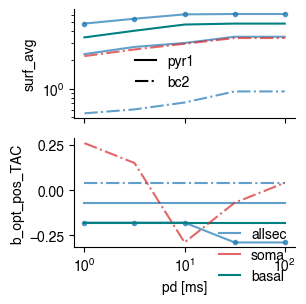

In [37]:
traces_toplot = [{'neurontemplate': 'pyr_1', 'Gmax':1.18, 'opsinlocations': 'allsec', 'level':100, 'theta_0':0},
                 {'neurontemplate': 'pyr_1', 'Gmax':13.9, 'opsinlocations': 'allsec', 'level':100, 'theta_0':0},
                 {'neurontemplate': 'pyr_1', 'Gmax':1.18, 'opsinlocations': 'basaldend', 'level':100, 'theta_0':0},
                 {'neurontemplate': 'bc_2', 'Gmax':1.18, 'opsinlocations': 'allsec', 'level':100, 'theta_0':0},
                 {'neurontemplate': 'bc_2', 'Gmax':1.18, 'opsinlocations': 'soma', 'level':100, 'theta_0':0}]
stylekeyval = {'pyr_1': '-', 'pyr_2': '--', 'bc_1': ':', 'bc_2': '-.'}

fig,axs = plt.subplots(2,1, sharex=True, figsize = (8/2.54,8/2.54), tight_layout=True)
ylabels = ['surf_avg', 'b_opt_pos_TAC']
for feat, ax, ylbl in zip(['surf_avg', 'b_opt_pos_TAC'],axs,ylabels):
    for trace_info in traces_toplot[:]:
        mydata = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,**trace_info)]
        xdata = mydata['dur']
        ydata = mydata[feat]
        xdata,ydata = sort_xy_based_x(xdata,ydata)
        ax.plot(xdata, ydata, color = colorkeyval[trace_info['opsinlocations']],linestyle=stylekeyval[trace_info['neurontemplate']],marker='' if trace_info['Gmax']<10 else '.')
    if feat=='surf_avg':
        ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_ylabel(ylbl)

for ax in axs:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

ax.set_xlabel('pd [ms]')
ax.set_xticks([0.1, 1, 10, 100, 1000])
axs[0].set_yticks([0.01,0.1, 1, 10])

axs[0].plot(np.nan,np.nan,label='pyr1',color = 'k',linestyle=stylekeyval['pyr_1'],marker='')
axs[0].plot(np.nan,np.nan,label='bc2',color = 'k',linestyle=stylekeyval['bc_2'],marker='')
axs[1].plot(np.nan,np.nan,label='allsec',color = colorkeyval['allsec'],linestyle=stylekeyval['pyr_1'],marker='')
axs[1].plot(np.nan,np.nan,label='soma',color = colorkeyval['soma'],linestyle=stylekeyval['pyr_1'],marker='')
axs[1].plot(np.nan,np.nan,label='basal',color = colorkeyval['basaldend'],linestyle=stylekeyval['pyr_1'],marker='')
axs[0].legend(frameon=False, bbox_to_anchor=(0.6,0.7), handlelength=1.5)
axs[1].legend(frameon=False, bbox_to_anchor=(0.6,0.3), handlelength=1.5)
axs[1].minorticks_off()

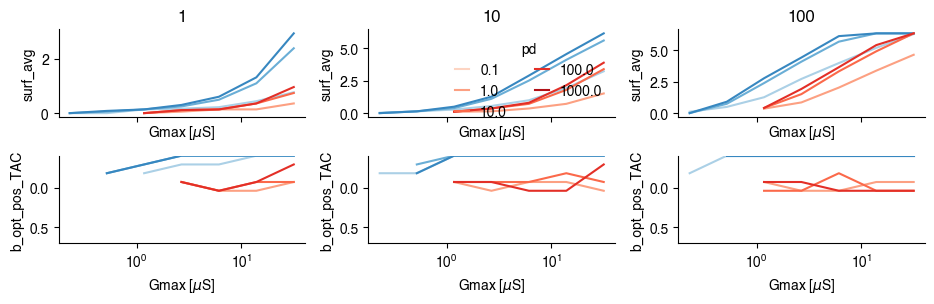

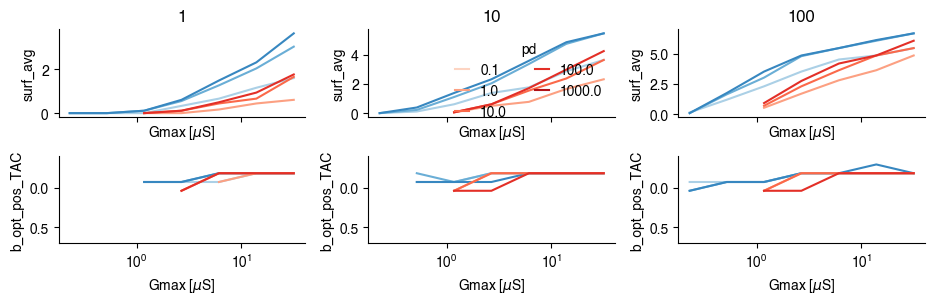

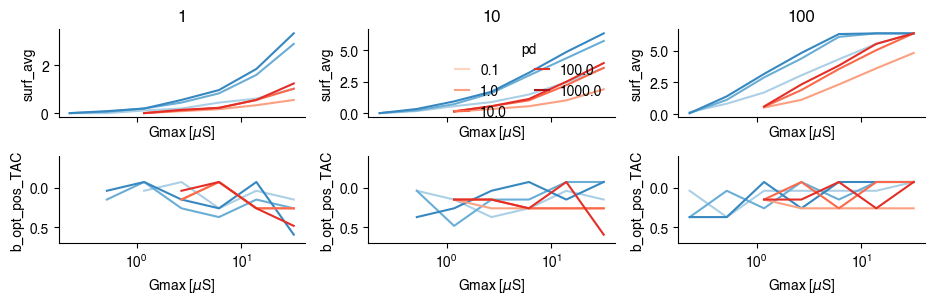

In [38]:
for theta in [-1.57,0,1.57]:
    fig,axs = plt.subplots(2,3,sharex=True, figsize = (24/2.54,8/2.54), tight_layout=True)
    for j, k in enumerate(['pyr_1','bc_2']):
        clr_str = 'Blues' if j==0 else 'Reds'
        for i, lvl in enumerate([1,10,100]):
            fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,**{'neurontemplate': k, 'opsinlocations': 'allsec', 'level':lvl, 'theta_0':theta})]
            udurs = np.logspace(-1,3,5)
            colors = np.array(sns.light_palette("tab:blue", n_colors=len(udurs)+1))
            colors = np.array(sns.color_palette(clr_str, n_colors=len(udurs)))
            for feat, ax in zip(['surf_avg','b_opt_pos_TAC'],axs[:,i]):

                for dur,clr in zip(udurs,colors[:,:]):
                    mydata = fig_df[selection_generator(fig_df,unique_values_columns=unique_values_columns_vta,**{'dur':dur})]
                    xdata,ydata = sort_xy_based_x(mydata['Gmax'],mydata[feat])
                    ax.plot(xdata, ydata, color = clr,linestyle='-')
                ax.set_xscale('log')
                # if feat=='surf_avg':
                #     ax.set_yscale('log')
                ax.set_ylabel(feat)
            axs[1,i].set_ylim([-0.4,0.7])
            axs[1,i].invert_yaxis()
            axs[0,i].set_title(lvl)

    for ax in axs.ravel():
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlabel('Gmax [$\mu$S]')
    for dur,clr in zip(udurs,colors[:,:]):
        axs[0,1].plot(np.nan,np.nan,label=np.round(dur,2),color=clr)

    axs[0,1].legend(frameon=False, bbox_to_anchor=(1,1), handlelength=1, loc='upper right', title='pd',ncol=2)
    axs[0,1].minorticks_off()
    axs[1,1].minorticks_off()

In [39]:
nanidx = np.isnan(vta_df['surf_avg'])
nanidx_log10 = np.isnan(vta_df['surf_avg_log10']) | np.isinf(vta_df['surf_avg_log10'])

single_linear_model = smf.ols(formula='surf_avg_log10 ~ Gmax_log10', data=vta_df[~nanidx_log10]).fit()
summary = single_linear_model.summary2()
print('summary multi linear model')
print(summary)

multi_linear_model = smf.ols(formula='surf_avg_log10 ~ Gmax_log10 + level_log10 + dur_log10', data=vta_df[~nanidx_log10]).fit()
summary = multi_linear_model.summary2()
print('summary multi linear model')
print(summary)

multi_linear_model_pitch = smf.ols(formula='surf_avg_log10 ~ Gmax_log10 + level_log10 + dur_log10 + C(theta_0)', data=vta_df[~nanidx_log10]).fit()
summary = multi_linear_model_pitch.summary2()
print('summary multi linear model with pitch')
print(summary)

multi_linear_model_ol = smf.ols(formula='surf_avg_log10 ~ Gmax_log10 + level_log10 + dur_log10 + C(opsinlocations)', data=vta_df[~nanidx_log10]).fit()
summary = multi_linear_model_ol.summary2()
print('summary multi linear model with opsinlocations')
print(summary)

multi_linear_model_nt = smf.ols(formula='surf_avg_log10 ~ Gmax_log10 + level_log10 + dur_log10 + C(neurontemplate)', data=vta_df[~nanidx_log10]).fit()
summary = multi_linear_model_nt.summary2()
print('summary multi linear model with neurontemplate')
print(summary)

multi_linear_model_all = smf.ols(formula='surf_avg_log10 ~ Gmax_log10 + level_log10 + dur_log10 + C(neurontemplate) + C(opsinlocations) + C(theta_0)', data=vta_df[~nanidx_log10]).fit()
summary = multi_linear_model_all.summary2()
print('summary multi linear model with neurontemplate, pitch, and opsinlocation')
print(summary)

summary multi linear model
                  Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.167     
Dependent Variable: surf_avg_log10   AIC:                18235.2129
Date:               2023-03-06 17:16 BIC:                18249.6616
No. Observations:   10141            Log-Likelihood:     -9115.6   
Df Model:           1                F-statistic:        2041.     
Df Residuals:       10139            Prob (F-statistic): 0.00      
R-squared:          0.168            Scale:              0.35349   
--------------------------------------------------------------------
                Coef.   Std.Err.     t      P>|t|    [0.025   0.975]
--------------------------------------------------------------------
Intercept      -0.1703    0.0082  -20.8991  0.0000  -0.1863  -0.1544
Gmax_log10      0.4060    0.0090   45.1752  0.0000   0.3884   0.4236
-------------------------------------------------------------------
Omnibus:              937.319     

In [40]:
vta_df[~nanidx_log10]
any(np.isinf(vta_df.loc[~nanidx_log10,'Gmax_log10']))


False

In [41]:
1-0.0573372/np.std(vta_df.loc[~nanidx_log10,'surf_avg_log10'])**2

0.864947331054976

In [42]:

vta_df['nt_ol_pi'] = vta_df.apply(lambda row: f"{row['neurontemplate']}_{row['opsinlocations']}_{row['theta_0']}", axis=1)

multi_linear_model_all_singleCAT = smf.ols(formula='surf_avg_log10 ~ Gmax_log10 + level_log10 + dur_log10 + C(nt_ol_pi)', data=vta_df[~nanidx_log10]).fit()
summary = multi_linear_model_all_singleCAT.summary2()
print('summary multi linear model with neurontemplate, pitch, and opsinlocation')
print(summary)
a_lm = anova_lm(multi_linear_model,multi_linear_model_all_singleCAT )

print(a_lm)

md_interaction = smf.mixedlm('surf_avg_log10 ~ Gmax_log10 + level_log10 + dur_log10',  data=vta_df[~nanidx_log10], groups="nt_ol_pi")
mdf_interaction = md_interaction.fit()
print('summary mixded multi linear model')
print(mdf_interaction.summary())

md_interaction = smf.mixedlm('surf_avg_log10 ~ Gmax_log10 + level_log10 + dur_log10',  data=vta_df[~nanidx_log10], groups="nt_ol_pi",re_formula="~Gmax_log10+level_log10+dur_log10")
free = sm.regression.mixed_linear_model.MixedLMParams.from_components(
    np.ones(4), np.eye(4)
)
mdf = md_interaction.fit(free=free, method=["lbfgs"])
print(mdf.summary())
mdf_interaction = md_interaction.fit()
print('summary mixded multi linear model')
print(mdf_interaction.summary())

summary multi linear model with neurontemplate, pitch, and opsinlocation
                           Results: Ordinary least squares
Model:                     OLS                    Adj. R-squared:           0.865    
Dependent Variable:        surf_avg_log10         AIC:                      -167.4555
Date:                      2023-03-06 17:16       BIC:                      157.6399 
No. Observations:          10141                  Log-Likelihood:           128.73   
Df Model:                  44                     F-statistic:              1477.    
Df Residuals:              10096                  Prob (F-statistic):       0.00     
R-squared:                 0.866                  Scale:                    0.057337 
-------------------------------------------------------------------------------------
                                      Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-------------------------------------------------------------------------------------
Intercep

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


                 Mixed Linear Model Regression Results
Model:                MixedLM     Dependent Variable:     surf_avg_log10
No. Observations:     10141       Method:                 REML          
No. Groups:           42          Scale:                  0.0521        
Min. group size:      69          Log-Likelihood:         297.9066      
Max. group size:      327         Converged:              Yes           
Mean group size:      241.5                                             
------------------------------------------------------------------------
                             Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------------------------
Intercept                    -1.047    0.078 -13.388 0.000 -1.200 -0.894
Gmax_log10                    0.642    0.015  42.358 0.000  0.612  0.671
level_log10                   0.437    0.011  39.983 0.000  0.416  0.459
dur_log10                     0.111    0.004  27.582 0.000  0.103  0.

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


summary mixded multi linear model
                 Mixed Linear Model Regression Results
Model:                MixedLM     Dependent Variable:     surf_avg_log10
No. Observations:     10141       Method:                 REML          
No. Groups:           42          Scale:                  0.0519        
Min. group size:      69          Log-Likelihood:         401.7802      
Max. group size:      327         Converged:              Yes           
Mean group size:      241.5                                             
------------------------------------------------------------------------
                             Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------------------------
Intercept                    -1.085    0.096 -11.251 0.000 -1.274 -0.896
Gmax_log10                    0.664    0.023  28.595 0.000  0.618  0.709
level_log10                   0.442    0.013  33.733 0.000  0.417  0.468
dur_log10                     0.112

In [43]:
import itertools
# interactions
multi_linear_model_all = smf.ols(formula='surf_avg_log10 ~ Gmax_log10 + level_log10 + dur_log10 + C(nt_ol_pi)', data=vta_df[~nanidx_log10]).fit()
summary = multi_linear_model_all.summary2()
print('summary multi linear model with neurontemplate, pitch, and opsinlocation')
print(summary)

formula_mla = 'surf_avg_log10 ~ Gmax_log10 + level_log10 + dur_log10 + + C(nt_ol_pi)'
elements = ['Gmax_log10', 'level_log10', 'dur_log10', 'C(nt_ol_pi)']

r2adj = {}
anova_check = {}
combos = (itertools.combinations(elements, 2))
for x in combos:
    formula = f"{formula_mla} + {x[0]}:{x[1]}"
    myfit = smf.ols(formula=formula, data=vta_df[~nanidx_log10]).fit()
    r2adj[f"{x[0]}-{x[1]}"] = myfit.rsquared_adj
    a_lm = anova_lm(multi_linear_model_all,myfit)
    anova_check[f"{x[0]}-{x[1]}"] = a_lm.loc[[1],'Pr(>F)'].values[0]
for k,v in r2adj.items():
    print(f"{k}:\n\tr2adj:{v:0.5f}\n\tpval_anova:{anova_check[k]:0.5e}\n\n")


summary multi linear model with neurontemplate, pitch, and opsinlocation
                           Results: Ordinary least squares
Model:                     OLS                    Adj. R-squared:           0.865    
Dependent Variable:        surf_avg_log10         AIC:                      -167.4555
Date:                      2023-03-06 17:16       BIC:                      157.6399 
No. Observations:          10141                  Log-Likelihood:           128.73   
Df Model:                  44                     F-statistic:              1477.    
Df Residuals:              10096                  Prob (F-statistic):       0.00     
R-squared:                 0.866                  Scale:                    0.057337 
-------------------------------------------------------------------------------------
                                      Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-------------------------------------------------------------------------------------
Intercep

In [44]:
a_lm['Pr(>F)']

0         NaN
1    0.058645
Name: Pr(>F), dtype: float64

# Extra

In [45]:

classes = ['neurontemplate','opsinlocations','Gmax','dur','level']
idxs = []
for t0 in unique_values_columns_vta['theta_0']:
    idxs.append(vta_df['theta_0']==t0)

df1 = vta_limit_df[idxs[0]].set_index([x for x in classes])
df2 = vta_limit_df[idxs[1]].set_index([x for x in classes])
dfs = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=(f"_{unique_values_columns_vta['theta_0'][0]}", f"_{unique_values_columns_vta['theta_0'][1]}"),validate='one_to_one')
df3 = vta_limit_df[idxs[2]].set_index([x for x in classes])
dfs = pd.merge(dfs, df3.add_suffix(f"_{unique_values_columns_vta['theta_0'][2]}"), left_index=True, right_index = True,validate='one_to_one')
print(dfs.columns,unique_values_columns_vta['theta_0'][2])
dfs = dfs.reset_index()

idxs = []
dfs[['celltype','number']] = dfs['neurontemplate'].str.split('_',expand=True)
for n in dfs['number'].unique():
    idxs.append(dfs['number']==n)
    print()
classes.append('celltype')
print(classes)
df1 = dfs[idxs[0]].set_index([x for x in classes if  not x == 'neurontemplate'])
df2 = dfs[idxs[1]].set_index([x for x in classes if not x == 'neurontemplate'])
dfs2 = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=(f"_1", f"_2"),validate='one_to_one')
dfs2 = dfs2.reset_index()


Index(['vta_low_-1.57', 'vta_up_-1.57', 'surf_low_-1.57', 'surf_up_-1.57',
       'b_opt_pos_-1.57', 'b_opt_pos_TAC_-1.57', 'w_opt_pos_TAC_-1.57',
       'b_opt_pos_TACamp_-1.57', 'w_opt_pos_TACamp_-1.57', 'theta_0_-1.57',
       ...
       'nt_ol_1.57', 'surf_estim_log10_1.57', 'surf_estim_hr_log10_1.57',
       'surf_avg_log10_1.57', 'selector_1.57', 'diff_avg_estim_1.57',
       'reldiff_avg_estim_1.57', 'reldiff_avg_estim_log10_1.57',
       'diff_up_estim_1.57', 'diff_low_estim_1.57'],
      dtype='object', length=111) 1.57


['neurontemplate', 'opsinlocations', 'Gmax', 'dur', 'level', 'celltype']


['surf_avg_-1.57', 'surf_avg_0.0', 'surf_avg_1.57']


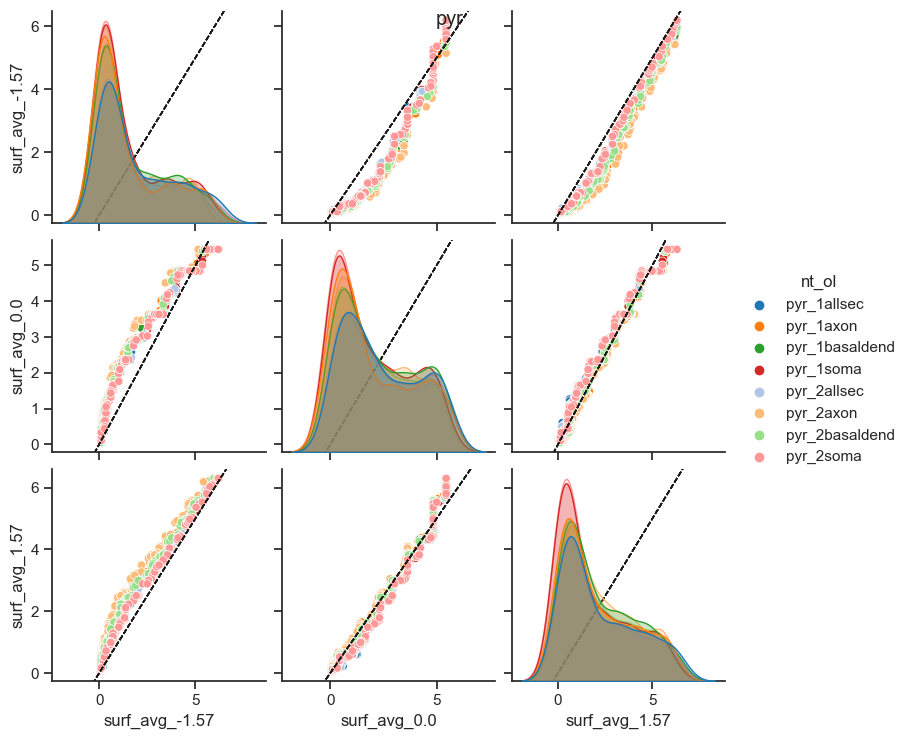

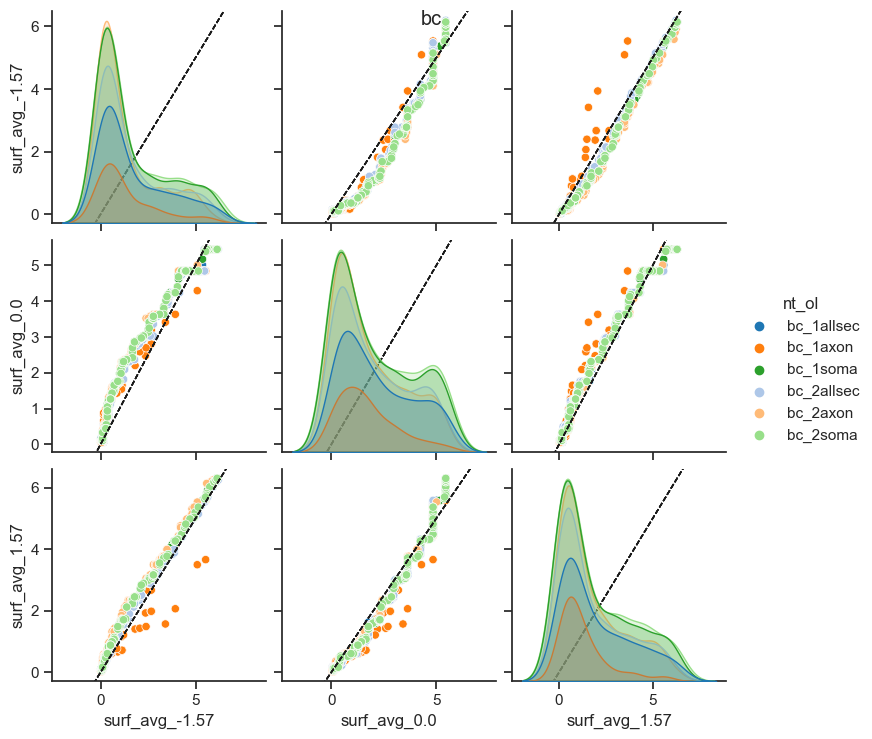

In [46]:
def modify_plot(*args, **kwargs):
  if "ax" in kwargs:
    ax = kwargs['ax']
  else:
    ax = plt.gca()
  xpoints = ypoints = ax.get_xlim()
  ax.plot(xpoints, ypoints, linestyle='--', color='k', lw=1, scalex=False, scaley=False)



sns.set_theme(style="ticks")
vars = [x for x in dfs.columns if 'surf_avg' in x and not 'log10' in x]
print(vars)
for x in ['pyr','bc']:
    dfs_intm = dfs[dfs['neurontemplate'].str.contains(x)].copy()
    dfs_intm['nt_ol'] = dfs_intm['neurontemplate'] + dfs_intm['opsinlocations']
    idx = np.ones(len(dfs_intm))
    for v in vars:
        idx = idx & (dfs_intm[v]>0) & (dfs_intm[v]<dfs[v].max())
    palette=np.array(sns.color_palette("tab20",n_colors=len(dfs_intm['nt_ol'].unique())))
    palette = np.vstack((palette[0::2,:],palette[1::2,:]))
    palette = dict(zip(dfs_intm['nt_ol'].unique(), palette))
    # print(palette)
    g = sns.pairplot(dfs_intm[idx], hue="nt_ol",vars=vars,palette=palette)
    g.map(modify_plot)
    fig = plt.gcf()
    fig.suptitle(x)

['surf_avg_-1.57_1', 'surf_avg_0.0_1', 'surf_avg_1.57_1', 'surf_avg_-1.57_2', 'surf_avg_0.0_2', 'surf_avg_1.57_2']


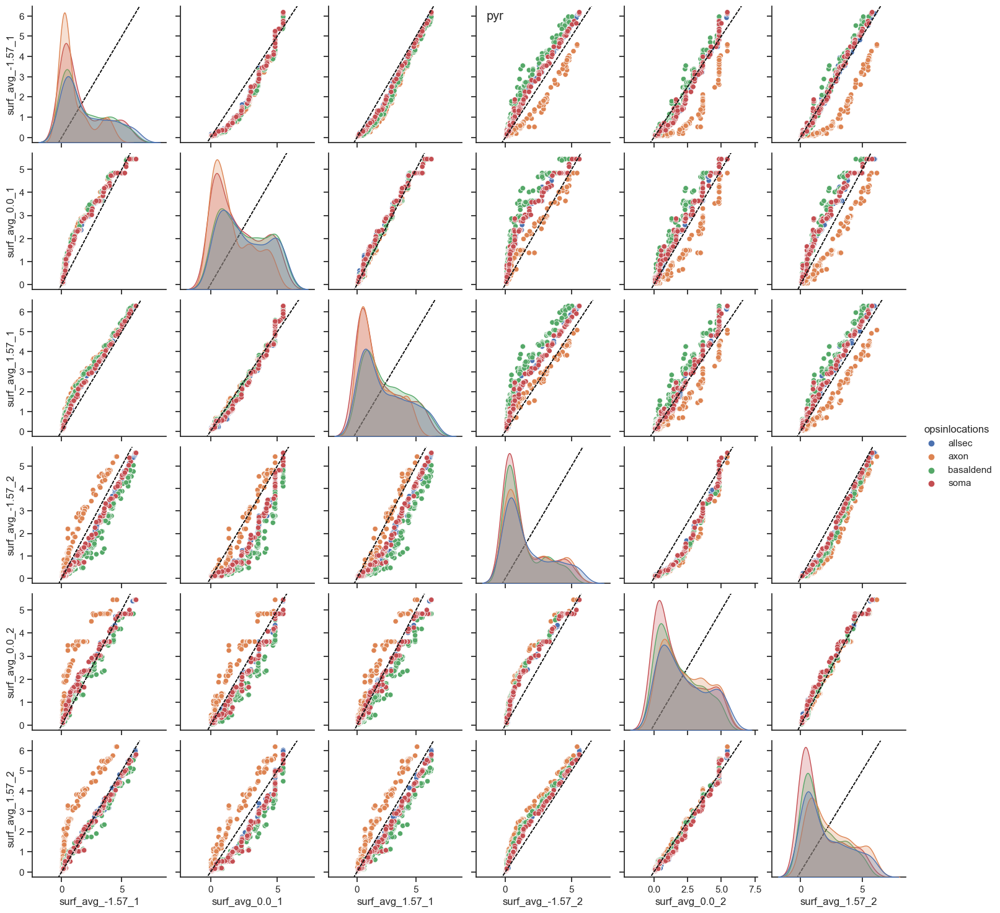

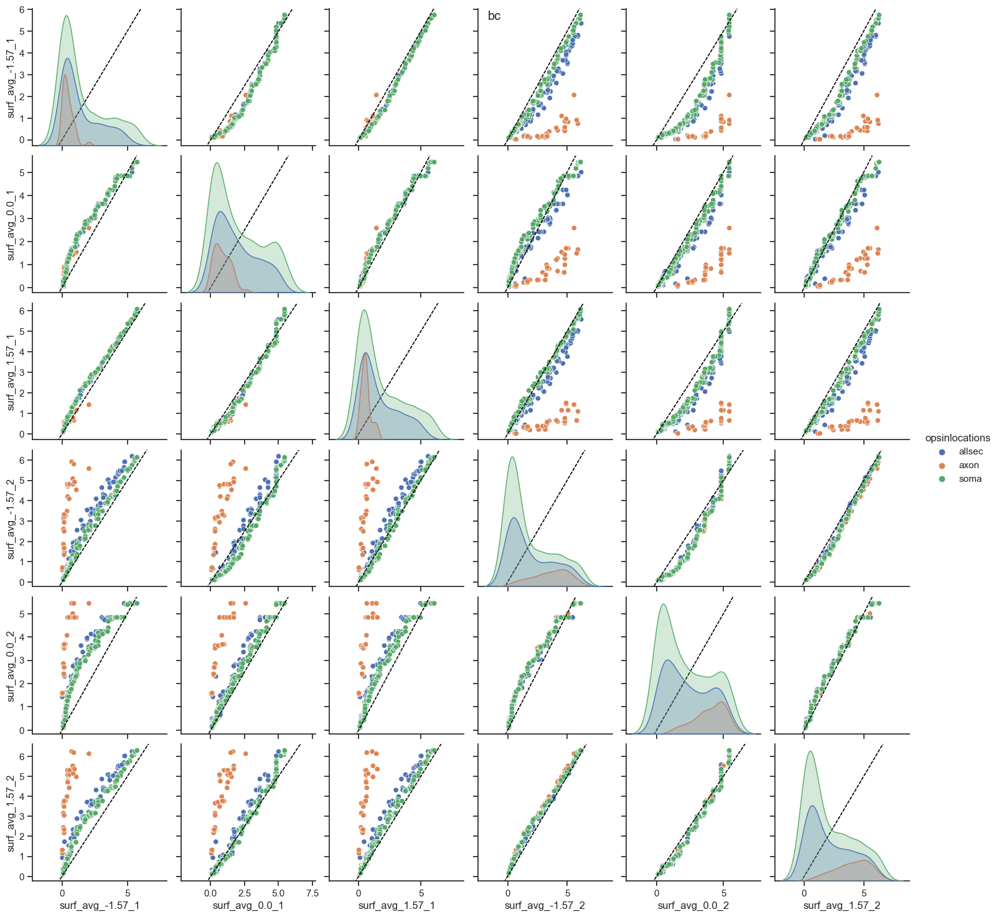

In [47]:
vars = [x for x in dfs2.columns if 'surf_avg' in x and not 'log10' in x]
print(vars)

for x in ['pyr','bc']:
    dfs_intm = dfs2[dfs2['celltype'].str.contains(x)].copy()
    idx = np.ones(len(dfs_intm))
    for v in vars:
         idx = idx & (dfs_intm[v]>0) & (dfs_intm[v]<dfs2[v].max())
    g = sns.pairplot(dfs_intm[idx], hue="opsinlocations",vars=vars)
    g.map(modify_plot)
    fig = plt.gcf()
    fig.suptitle(x)

In [48]:
def linearReg(dataframe,features,axs,filteronthreshold,xdata_str='Gmax_log10',plot_flag = True,scatterplot=True):
    ress = []
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    for feat,ax in zip(features,axs):
        xdata = np.array(dataframe[xdata_str])
        ydata = np.array(dataframe[feat])
        idx = ~np.isnan(ydata)
        if filteronthreshold:
            idx = ~(np.isnan(np.array(dataframe['surf_low_log10']))|np.isinf(np.array(dataframe['surf_low_log10'])))& idx
        xdata = xdata[idx]
        xvals = np.unique(xdata)
        ydata = ydata[idx]
        res = stats.linregress(xdata, ydata)
        ts = tinv(0.05, len(xdata)-2)
        print(f"\n{feat}\nRsquared: {res.rvalue**2}\nslope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        print(f"intercept (95%): {res.intercept:.6f} +/- {ts*res.intercept_stderr:.6f}")


        # calculate MSE
        yestim = xdata*res.slope+res.intercept
        MSE = np.mean((ydata-yestim)**2)

        # calculate own estimate 95% confidence interval
        mymatrix = np.zeros((4,len(xvals)))
        i= -1
        for x in [-1,1]:
            for y in [-1,1]:
                i+=1
                mymatrix[i,:] = xvals*(res.slope+x*ts*res.stderr)+res.intercept+y*ts*res.intercept_stderr
        minslope = np.min(mymatrix,axis=0)
        maxslope = np.max(mymatrix,axis=0)

        #plot

        intm_df = dataframe[idx]
        if plot_flag:
            if scatterplot:
                sns.scatterplot(intm_df,x = xdata_str,y=feat,ax=ax,hue='opsinlocations',style='theta_0')
                sns.regplot(intm_df,x = xdata_str, y=feat,ax=ax,marker='')
            else:
                sns.regplot(intm_df,x = xdata_str, y=feat,ax=ax)
            ax.plot(xvals,xvals*res.slope+res.intercept)
            ax.plot(xvals,minslope,color='k')
            ax.plot(xvals,maxslope,color='k')
            ax.set_title(feat)
        res = res._asdict()
        res['MSE'] = MSE
        res['Rsquared'] = res['rvalue']**2
        ress.append(res)
    return ress


surf_low_log10
Rsquared: 0.4994428925874067
slope (95%): 0.510145 +/- 0.028949
intercept (95%): 0.041782 +/- 0.025580

surf_up_log10
Rsquared: 0.5861387351396906
slope (95%): 0.361567 +/- 0.017222
intercept (95%): 0.377138 +/- 0.015217


 pyr_1

surf_low_log10
Rsquared: 0.6760763239793075
slope (95%): 0.533699 +/- 0.036636
intercept (95%): 0.136331 +/- 0.030893

surf_up_log10
Rsquared: 0.7131936266866163
slope (95%): 0.374040 +/- 0.023523
intercept (95%): 0.439920 +/- 0.019836


 pyr_2

surf_low_log10
Rsquared: 0.6769959572010158
slope (95%): 0.574024 +/- 0.039679
intercept (95%): 0.083112 +/- 0.033587

surf_up_log10
Rsquared: 0.7287100118703963
slope (95%): 0.396695 +/- 0.024222
intercept (95%): 0.407288 +/- 0.020503


 bc_1

surf_low_log10
Rsquared: 0.17187059149255648
slope (95%): 0.374336 +/- 0.122946
intercept (95%): -0.092917 +/- 0.124381

surf_up_log10
Rsquared: 0.36307667659208265
slope (95%): 0.306770 +/- 0.060794
intercept (95%): 0.279425 +/- 0.061504


 bc_2

surf_low_log10

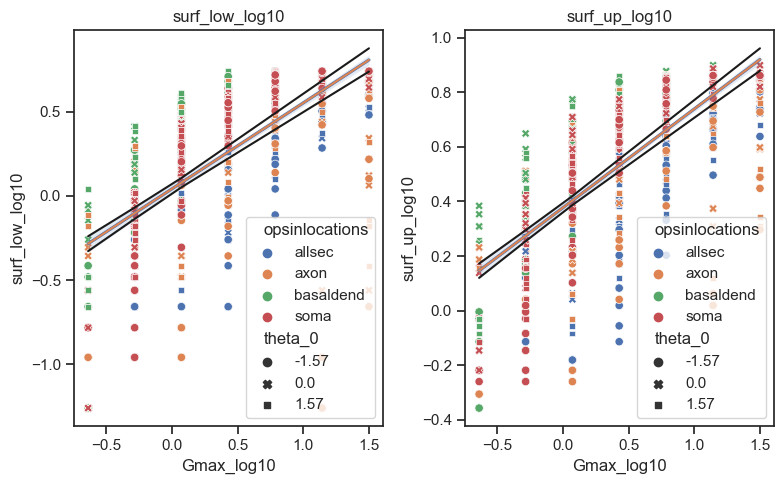

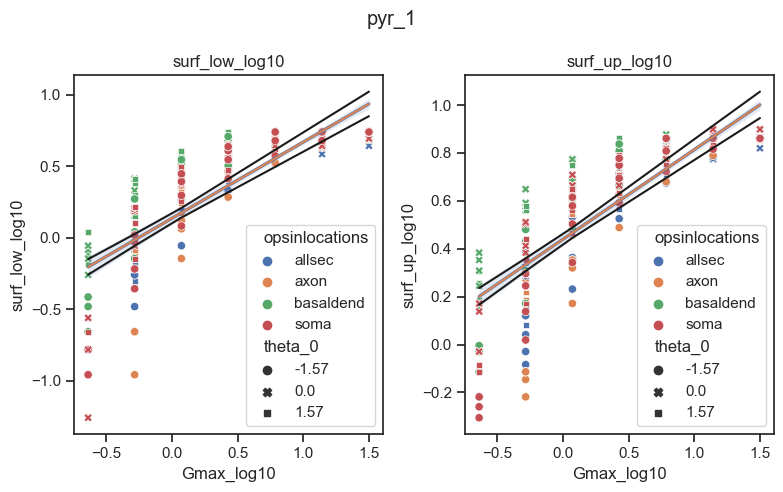

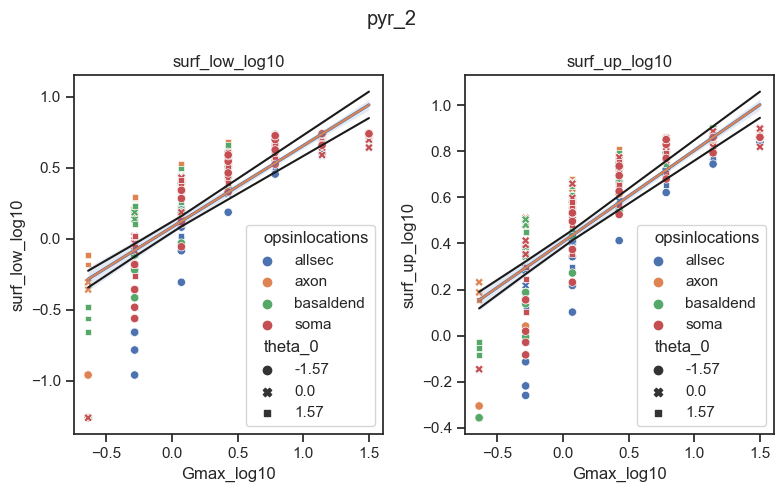

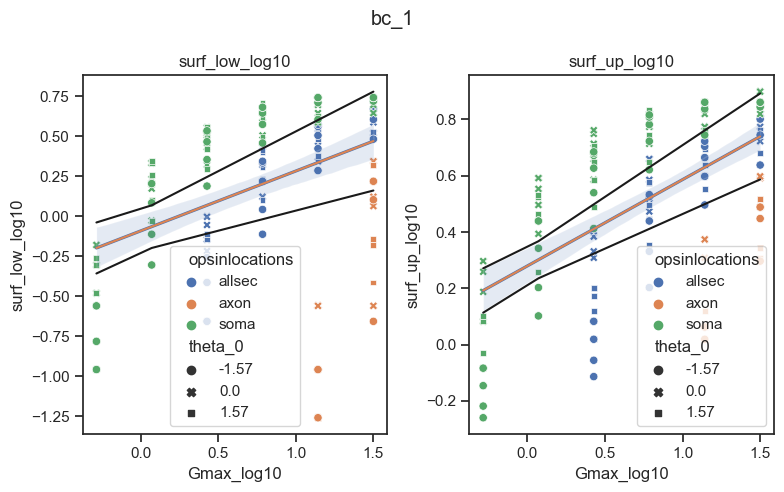

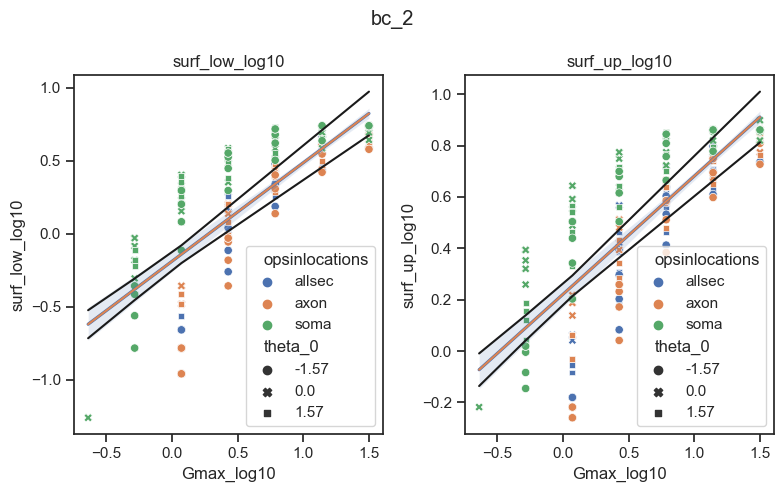

In [49]:
ress_dict = {'surf_low_log10':{},'surf_up_log10':{}}
fig,axs = plt.subplots(1,2,tight_layout = True,figsize=(8,5))
filteronthreshold = True
ress = linearReg(vta_df[vta_df['level']==100],['surf_low_log10','surf_up_log10'],axs,filteronthreshold)
ress_dict['surf_low_log10']['all'] = ress[0]
ress_dict['surf_up_log10']['all'] = ress[1]
for cell in unique_values_columns_vta['neurontemplate']:
    intm_df = vta_df[(vta_df['neurontemplate']==cell) & (vta_df['level']==100)]
    fig,axs = plt.subplots(1,2,tight_layout = True,figsize=(8,5))
    print('\n\n',cell)
    ress = linearReg(intm_df,['surf_low_log10','surf_up_log10'],axs,filteronthreshold)
    fig.suptitle(cell)
    ress_dict['surf_low_log10'][cell] = ress[0]
    ress_dict['surf_up_log10'][cell] = ress[1]